# settings

In [1]:
import sys
sys.path.append('../../')

from datetime import date, timedelta
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import numpy as np

%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
from scripts.simulator import VariableLocalTransaction
# from scripts.variable_local import AutoAdjustmentTransactionMulti
from scripts.exec_simulator import ExecuteAutoAdjustmentTransactionSingle, ExecuteAutoAdjustmentTransactionMulti, ExecuteAutoAdjustmentTransactionDynamicMulti
from scripts.price_data.get_price import GetPriceData
from scripts.visualizer import LogVisualizer
from scripts.types import PortfolioItem, PortfolioWithPriorityItem, TransactionOption

price_getter = GetPriceData()

from pprint import pprint

In [2]:
# Relative path to save data
from pathlib import Path

data_dir = Path('./data0322/')
data_dir.mkdir(parents=True, exist_ok=True)

# portfolio

## Borrower portfolio

In [3]:
# 追加検証用ポートフォリオ（シナリオ毎）
borrower_portfolio_s1 = {
    '8306.T': {
        'num': 3322260,
        'is_usd': False,
        'priority': 5,
    },
    '8604.T': {
        'num': 2469136,
        'is_usd': False,
        'priority': 4,
    },
    '4901.T': {
        'num': 641026,
        'is_usd': False,
        'priority': 3,
    },
    '7013.T': {
        'num': 1183432,
        'is_usd': False,
        'priority': 2,
    },
    '8031.T': {
        'num': 1771480,
        'is_usd': False,
        'priority': 1,
    },
}

borrower_portfolio_s2 = {
    '8306.T': {
        'num': 2166848,
        'is_usd': False,
        'priority': 5,
    },
    '8604.T': {
        'num': 1423488,
        'is_usd': False,
        'priority': 4,
    },
    '4901.T': {
        'num': 736649,
        'is_usd': False,
        'priority': 3,
    },
    '7013.T': {
        'num': 1250000,
        'is_usd': False,
        'priority': 2,
    },
    '8031.T': {
        'num': 1479290,
        'is_usd': False,
        'priority': 1,
    },
}

borrower_portfolio_s3= {
    '8306.T': {
        'num': 4728133,
        'is_usd': False,
        'priority': 5,
    },
    '8604.T': {
        'num': 4608295,
        'is_usd': False,
        'priority': 4,
    },
    '4901.T': {
        'num': 1129306,
        'is_usd': False,
        'priority': 3,
    },
    '7013.T': {
        'num': 2469136,
        'is_usd': False,
        'priority': 2,
    },
    '8031.T': {
        'num': 2259888,
        'is_usd': False,
        'priority': 1,
    },
}

borrower_portfolio_s4 = {
    '8306.T': {
        'num': 3189793,
        'is_usd': False,
        'priority': 5,
    },
    '8604.T': {
        'num': 2157498,
        'is_usd': False,
        'priority': 4,
    },
    '4901.T': {
        'num': 865801,
        'is_usd': False,
        'priority': 3,
    },
    '7013.T': {
        'num': 1652893,
        'is_usd': False,
        'priority': 2,
    },
    '8031.T': {
        'num': 2162163,
        'is_usd': False,
        'priority': 1,
    },
}


# 8306のみの場合
single_borrower_portfolio_s1 = {
    '8306.T': {
        'num': 16611296,
        'is_usd': False,
        'priority': 5,
    },
}

single_borrower_portfolio_s2 = {
    '8306.T': {
        'num': 10834237,
        'is_usd': False,
        'priority': 5,
    },
}

single_borrower_portfolio_s3 = {
    '8306.T': {
        'num': 23640662,
        'is_usd': False,
        'priority': 5,
    },
}

single_borrower_portfolio_s4 = {
    '8306.T': {
        'num': 15948964,
        'is_usd': False,
        'priority': 5,
    },
}

## Lender portfolio

In [4]:

lender_portfolio_X = {
    'JPY': {
        'num': 10000000000,
        'is_usd': False,
        'priority': 1,
    }
}

# models (追加検証用）

## model1-1（追加検証）
単一担保の取引、マージンコール閾値設定なし

In [5]:
options_1_1 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0
}

## model1-2（追加検証）
単一担保の取引、マージンコール閾値設定あり

In [6]:
options_1_2 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0.02
}

## model2-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、静的優先度付け

In [7]:
options_2_1 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': True,
    'margin_call_threshold': 0
}

## model2-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、静的優先度付け

In [8]:
options_2_2 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': True,
    'margin_call_threshold': 0.02
}

## model3-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、動的優先度付け

In [9]:
options_3_1 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0
}

## model3-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、動的優先度付け

In [10]:
options_3_2 = {
    'borrower_loan_ratio': 1.0,
    'print_log': True,
    'auto_deposit': True,
    'is_dummy_data': False,
    'is_reverse': False,
    'margin_call_threshold': 0.02
}

In [11]:
# シナリオ毎の開始時の各トークン価格

# s1
"""
start_date_1 = date(2009, 7, 1)
end_date_1 = date(2009, 8, 31)
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"""

# s2
"""
start_date_2 = date(2008, 10, 1)
end_date_2 = date(2008, 12, 1)
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"""

# s3
"""
start_date_3 = date(2009, 3, 1)
end_date_3 = date(2009, 5, 1)
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"""

# s4
"""
start_date_4 = date(2008, 11, 1)
end_date_4 = date(2009, 1, 1)
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"""
    

'\nstart_date_4 = date(2008, 11, 1)\nend_date_4 = date(2009, 1, 1)\n8306.T: 627.0\n8604.T: 927.0\n4901.T: 2310.0\n7013.T: 1210.0\n8031.T: 925.0\n'

In [12]:
10000000000 / 627

15948963.31738437

# Simulation

## リーマンショック前後（2008/9 - 2009/9）

In [31]:
start_date_0 = date(2008, 9, 1)
end_date_0 = date(2009, 9, 1)

In [36]:
simulator_0 = ExecuteAutoAdjustmentTransactionSingle(borrower_portfolio_down, lender_portfolio_jpy_0, start_date_0, end_date_0,  options=options_0)
print('Start simulation model0...')
%time logs_0 = simulator_0.execute()
print("End simulation model0!!!")

("JCT portfolio: {'8306.T': {'num': 1000000, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1000000, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1000000, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1000000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1000000, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 8616500000, 'is_usd': False, 'priority': 1}}"
2008-09-01: Price updating...
JPY: 1.0
2008-09-01: Price updating...
8306.T: 824.0
8604.T: 1423.0
4901.T: 3050.0
7013.T: 1880.0
8031.T: 1893.0
"8306.T: {'num': 1000000, 'is_usd': False, 'priority': 5, 'price': 824.0}"
"8604.T: {'num': 1000000, 'is_usd': False, 'priority': 4, 'price': 1423.0}"
"4901.T: {'num': 1000000, 'is_usd': False, 'priority': 3, 'price': 3050.0}"
"7013.T: {'num': 1000000, 'is_usd': False, 'priority': 2, 'price': 1880.0}"
"8031.T: {'num': 1000000, 'is_usd': False, 'priority': 1, 'price': 1893.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@

2008-09-06: Price updating...
JPY: 1.0
2008-09-06: Price updating...
8306.T: 850.0
8604.T: 1501.0
4901.T: 3080.0
7013.T: 1840.0
8031.T: 1699.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3080.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1840.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1699.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1117647, 'price': 850.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1501.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-07
2008-09-07: Price updating...
JPY: 1.0
2008-09-07: Price updating...
8306.T: 850.0
8604.T: 1501.0
4901.T:

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2895.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1429.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2263889, 'price': 792.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1303.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-16
2008-09-16: Price updating...
JPY: 1.0
2008-09-16: Price updating...
8306.T: 792.0
8604.T: 1303.0
4901.T: 2895.0
7013.T: 1650.0
8031.T: 1429.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'490

2008-09-25: Price updating...
JPY: 1.0
2008-09-25: Price updating...
8306.T: 917.0
8604.T: 1461.0
4901.T: 2985.0
7013.T: 1720.0
8031.T: 1498.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2985.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1720.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1498.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 1533261, 'price': 917.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1461.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-09-26
2008-09-26: Price updating...
JPY: 1.0
2008-09-26: Price updating...
8306.T: 931.0
8604.T: 1468.0
4901.T:

from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3703474, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-05
2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False

2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3487655, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1425.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-15
2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
8604.T: 1413.0
4901.T:

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4900672, 'price': 745.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-24
2008-10-24: Price updating...
JPY: 1.0
2008-10-24: Price updating...
8306.T: 683.0
8604.T: 1055.0
4901.T: 1983.0
7013.T: 1070.0
8031.T: 859.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 

2008-11-02: Price updating...
JPY: 1.0
2008-11-02: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5897927, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 927.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-03
2008-11-03: Price updating...
JPY: 1.0
2008-11-03: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1310.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 973.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5603476, 'price': 633.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 940.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-12
2008-11-12: Price updating...
JPY: 1.0
2008-11-12: Price updating...
8306.T: 615.0
8604.T: 905.0
4901.T: 2310.0
7013.T: 1280.0
8031.T: 928.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-11-21: Price updating...
JPY: 1.0
2008-11-21: Price updating...
8306.T: 492.0
8604.T: 645.0
4901.T: 2110.0
7013.T: 1140.0
8031.T: 753.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8987804, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 645.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 852.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8113948, 'price': 509.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-01
2008-12-01: Price updating...
JPY: 1.0
2008-12-01: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-12-10: Price updating...
JPY: 1.0
2008-12-10: Price updating...
8306.T: 468.0
8604.T: 701.0
4901.T: 2175.0
7013.T: 1110.0
8031.T: 796.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 796.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9162393, 'price': 468.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 701.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-11
2008-12-11: Price updating...
JPY: 1.0
2008-12-11: Price updating...
8306.T: 500.0
8604.T: 718.0
4901.T: 2145

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1855.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 820.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8225000, 'price': 560.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 699.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-20
2008-12-20: Price updating...
JPY: 1.0
2008-12-20: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T'

2008-12-29: Price updating...
JPY: 1.0
2008-12-29: Price updating...
8306.T: 556.0
8604.T: 734.0
4901.T: 1927.0
7013.T: 1100.0
8031.T: 875.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1927.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 875.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7974820, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 734.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-30
2008-12-30: Price updating...
JPY: 1.0
2008-12-30: Price updating...
8306.T: 549.0
8604.T: 729.0
4901.T: 1950

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2260.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1270.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1052.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6380136, 'price': 584.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 762.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-08
2009-01-08: Price updating...
JPY: 1.0
2009-01-08: Price updating...
8306.T: 560.0
8604.T: 712.0
4901.T: 2200.0
7013.T: 1220.0
8031.T: 992.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T

2009-01-17: Price updating...
JPY: 1.0
2009-01-17: Price updating...
8306.T: 517.0
8604.T: 653.0
4901.T: 2125.0
7013.T: 1110.0
8031.T: 922.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2125.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 922.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8239846, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 653.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-18
2009-01-18: Price updating...
JPY: 1.0
2009-01-18: Price updating...
8306.T: 517.0
8604.T: 653.0
4901.T: 2125

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1915.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1060.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 886.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 10043669, 'price': 458.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 609.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-01-27
2009-01-27: Price updating...
JPY: 1.0
2009-01-27: Price updating...
8306.T: 497.0
8604.T: 639.0
4901.T: 2045.0
7013.T: 1100.0
8031.T: 942.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T

2009-02-05: Price updating...
JPY: 1.0
2009-02-05: Price updating...
8306.T: 477.0
8604.T: 573.0
4901.T: 1885.0
7013.T: 970.0
8031.T: 1045.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 970.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1045.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9637317, 'price': 477.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 573.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-06
2009-02-06: Price updating...
JPY: 1.0
2009-02-06: Price updating...
8306.T: 480.0
8604.T: 572.0
4901.T: 1935

2009-02-15: Price updating...
JPY: 1.0
2009-02-15: Price updating...
8306.T: 470.0
8604.T: 470.0
4901.T: 1836.0
7013.T: 930.0
8031.T: 950.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1836.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 930.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 950.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 10391489, 'price': 470.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 470.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-16
2009-02-16: Price updating...
JPY: 1.0
2009-02-16: Price updating...
8306.T: 470.0
8604.T: 470.0
4901.T: 1836.

2009-02-25: Price updating...
JPY: 1.0
2009-02-25: Price updating...
8306.T: 445.0
8604.T: 415.0
4901.T: 1833.0
7013.T: 850.0
8031.T: 887.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1833.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 850.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 887.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 11426966, 'price': 445.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 415.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-02-26
2009-02-26: Price updating...
JPY: 1.0
2009-02-26: Price updating...
8306.T: 442.0
8604.T: 415.0
4901.T: 1842.

2009-03-07: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0
7013.T: 840.0
8031.T: 837.0
adjust by single token manually.
from Borrower(A) to Lender(B)
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 1765.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 840.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 837.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 13685040, 'price': 381.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 414.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-08
2009-03-08: Price updating...
JPY: 1.0
2009-03-08: Price updating...
8306.T: 381.0
8604.T: 414.0
4901.T: 1765.0
7013.T: 840.0
8031.T: 837.0
adjust by single token manually

2009-03-17: Price updating...
JPY: 1.0
2009-03-17: Price updating...
8306.T: 477.0
8604.T: 507.0
4901.T: 2005.0
7013.T: 960.0
8031.T: 866.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2005.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 960.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 866.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9920335, 'price': 477.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 507.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-18
2009-03-18: Price updating...
JPY: 1.0
2009-03-18: Price updating...
8306.T: 478.0
8604.T: 514.0
4901.T: 2055.0

2009-03-27: Price updating...
JPY: 1.0
2009-03-27: Price updating...
8306.T: 527.0
8604.T: 551.0
4901.T: 2350.0
7013.T: 1130.0
8031.T: 1049.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1130.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1049.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7571158, 'price': 527.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 551.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-28
2009-03-28: Price updating...
JPY: 1.0
2009-03-28: Price updating...
8306.T: 488.0
8604.T: 524.0
4901.T: 21

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1270.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1141.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7181286, 'price': 513.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 585.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-06
2009-04-06: Price updating...
JPY: 1.0
2009-04-06: Price updating...
8306.T: 513.0
8604.T: 585.0
4901.T: 2390.0
7013.T: 1270.0
8031.T: 1141.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-04-15: Price updating...
JPY: 1.0
2009-04-15: Price updating...
8306.T: 521.0
8604.T: 597.0
4901.T: 2475.0
7013.T: 1290.0
8031.T: 1179.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2475.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1290.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6773513, 'price': 521.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 597.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-16
2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
8604.T: 582.0
4901.T: 25

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1530.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1070.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6761133, 'price': 494.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 605.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-25
2009-04-25: Price updating...
JPY: 1.0
2009-04-25: Price updating...
8306.T: 508.0
8604.T: 609.0
4901.T: 2585.0
7013.T: 1500.0
8031.T: 1066.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-05-04: Price updating...
JPY: 1.0
2009-05-04: Price updating...
8306.T: 617.0
8604.T: 652.0
4901.T: 2605.0
7013.T: 1680.0
8031.T: 1159.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2605.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1680.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1159.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4820097, 'price': 617.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 652.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-05
2009-05-05: Price updating...
JPY: 1.0
2009-05-05: Price updating...
8306.T: 617.0
8604.T: 652.0
4901.T: 26

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2660.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1179.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4724800, 'price': 625.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 678.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-14
2009-05-14: Price updating...
JPY: 1.0
2009-05-14: Price updating...
8306.T: 588.0
8604.T: 645.0
4901.T: 2580.0
7013.T: 1520.0
8031.T: 1117.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-05-23: Price updating...
JPY: 1.0
2009-05-23: Price updating...
8306.T: 611.0
8604.T: 689.0
4901.T: 2555.0
7013.T: 1680.0
8031.T: 1177.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2555.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1680.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1177.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4859247, 'price': 611.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 689.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-05-24
2009-05-24: Price updating...
JPY: 1.0
2009-05-24: Price updating...
8306.T: 611.0
8604.T: 689.0
4901.T: 25

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2740.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1720.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1286.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4191558, 'price': 616.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 742.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-02
2009-06-02: Price updating...
JPY: 1.0
2009-06-02: Price updating...
8306.T: 621.0
8604.T: 737.0
4901.T: 2790.0
7013.T: 1710.0
8031.T: 1281.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-06-11: Price updating...
JPY: 1.0
2009-06-11: Price updating...
8306.T: 641.0
8604.T: 872.0
4901.T: 2910.0
7013.T: 1730.0
8031.T: 1301.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2910.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1730.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1301.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3521060, 'price': 641.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 872.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-12
2009-06-12: Price updating...
JPY: 1.0
2009-06-12: Price updating...
8306.T: 652.0
8604.T: 917.0
4901.T: 29

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2860.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1710.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1164.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4087805, 'price': 615.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 822.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-06-21
2009-06-21: Price updating...
JPY: 1.0
2009-06-21: Price updating...
8306.T: 615.0
8604.T: 822.0
4901.T: 2860.0
7013.T: 1710.0
8031.T: 1164.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-06-30: Price updating...
JPY: 1.0
2009-06-30: Price updating...
8306.T: 598.0
8604.T: 814.0
4901.T: 3060.0
7013.T: 1670.0
8031.T: 1146.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3060.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1146.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3979933, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 814.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-01
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 31

from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2915.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1420.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1056.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5395265, 'price': 549.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 717.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-10
2009-07-10: Price updating...
JPY: 1.0
2009-07-10: Price updating...
8306.T: 538.0
8604.T: 710.0
4901.T: 2945.0
7013.T: 1420.0
8031.T: 1049.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-07-19: Price updating...
JPY: 1.0
2009-07-19: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 2885.0
7013.T: 1600.0
8031.T: 1147.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1147.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4798562, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 770.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-20
2009-07-20: Price updating...
JPY: 1.0
2009-07-20: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 28

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 3000.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1630.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4421621, 'price': 555.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 815.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-29
2009-07-29: Price updating...
JPY: 1.0
2009-07-29: Price updating...
8306.T: 544.0
8604.T: 809.0
4901.T: 3020.0
7013.T: 1590.0
8031.T: 1171.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-08-07: Price updating...
JPY: 1.0
2009-08-07: Price updating...
8306.T: 598.0
8604.T: 786.0
4901.T: 2885.0
7013.T: 1650.0
8031.T: 1303.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1303.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4090302, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 786.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-08
2009-08-08: Price updating...
JPY: 1.0
2009-08-08: Price updating...
8306.T: 609.0
8604.T: 808.0
4901.T: 28

from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2690.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1740.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1241.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4367174, 'price': 591.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 818.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-17
2009-08-17: Price updating...
JPY: 1.0
2009-08-17: Price updating...
8306.T: 591.0
8604.T: 818.0
4901.T: 2690.0
7013.T: 1740.0
8031.T: 1241.0
adjust by single token manually.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.

2009-08-26: Price updating...
JPY: 1.0
2009-08-26: Price updating...
8306.T: 595.0
8604.T: 824.0
4901.T: 2840.0
7013.T: 1870.0
8031.T: 1261.0
adjust by single token manually.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment will be done by tomorrow@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1000000, 'price': 2840.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1000000, 'price': 1870.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1000000, 'price': 1261.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3823529, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1000000, 'price': 824.0, 'priority': 4}}
--------------------DONE(manual)------------------------
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-27
2009-08-27: Price updating...
JPY: 1.0
2009-08-27: Price updating...
8306.T: 593.0
8604.T: 813.0
4901.T: 27

Log Visualizer initialized.


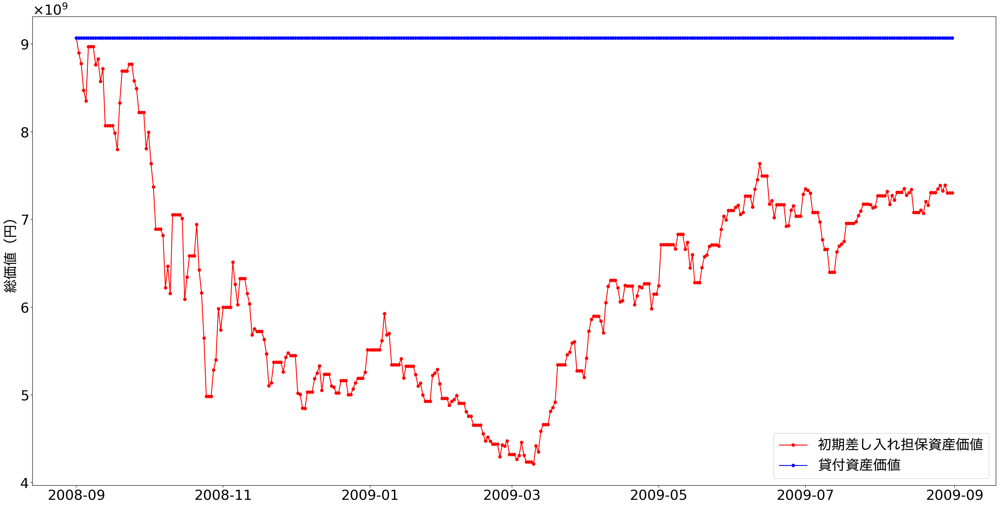

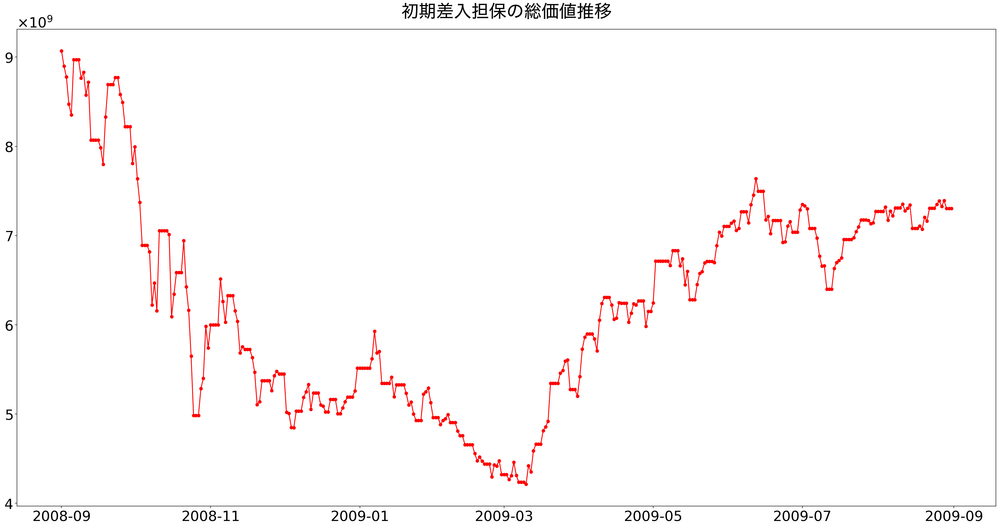

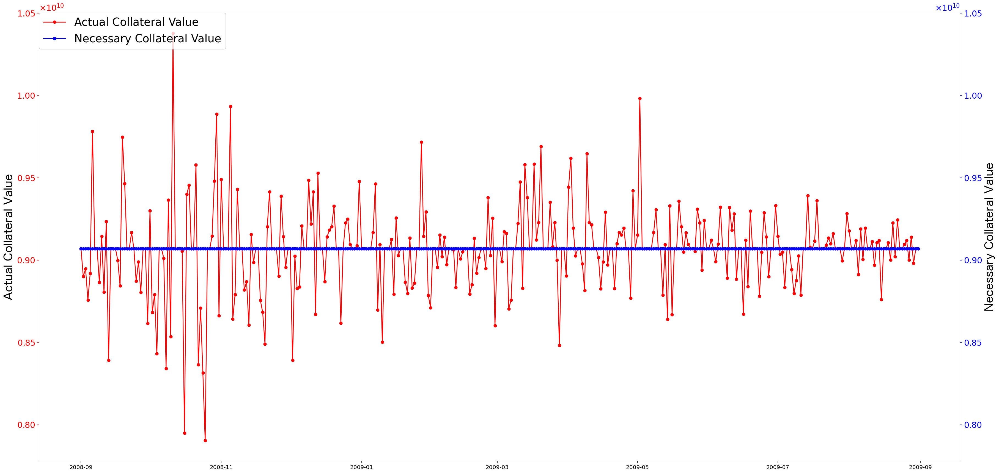

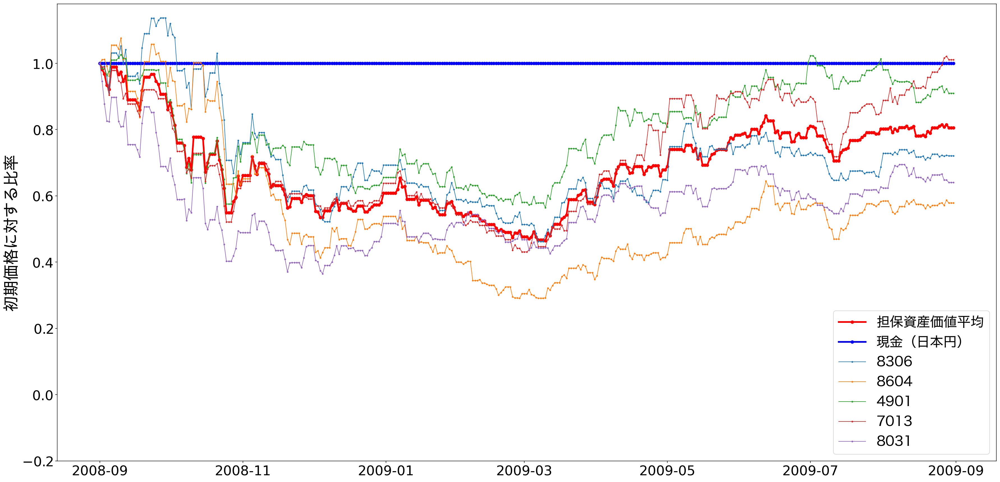

In [37]:
data_dir = Path('./data0118/')
data_dir.mkdir(parents=True, exist_ok=True)
visualizer_0 = LogVisualizer(logs_0, './data0118/all_term')
visualizer_0.compare_initial_collateral_portfolio()
visualizer_0.plt_initial_collateral_portfolio_value()
visualizer_0.plt_collateral_price_diff()
visualizer_0.compare_initial_collateral_portfolio_ratio()

Log Visualizer initialized.


AttributeError: 'LogVisualizer' object has no attribute 'calc_price_diffs'

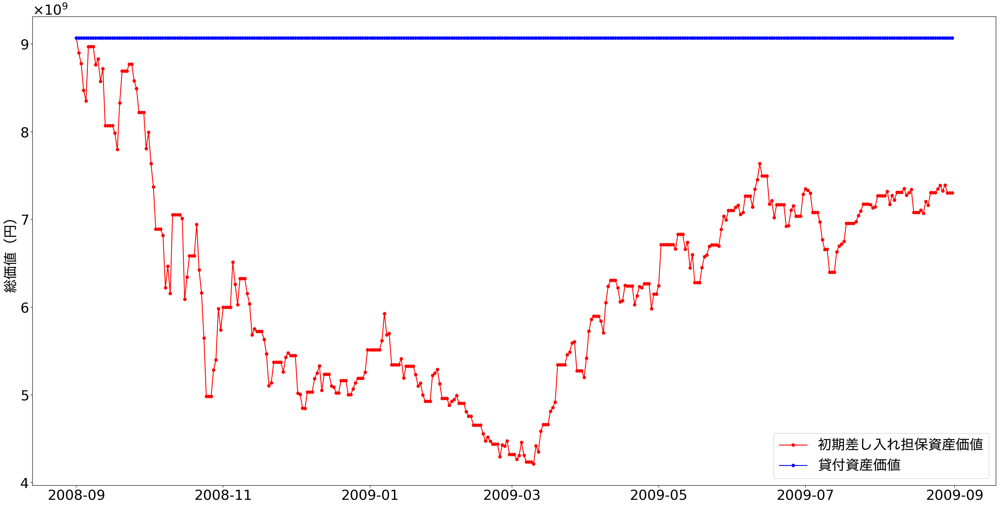

In [38]:
saved_logs_all_term = np.load('./data/all_term.npy', allow_pickle=True).item()
visualizer_all_term = LogVisualizer(saved_logs_all_term)
visualizer_all_term.compare_initial_collateral_portfolio()
visualizer_all_term.calc_price_diffs()
collateral_values_all_term = visualizer_all_term.calc_collateral_num()

## 【注意】追加検証における変更点

- ### ポートフォリオ
貸手は１００億円日本円固定、借手は各トークンを均等に（２０億円相当ずつ）差し入れ

- ### 動的優先度付けモデル（モデル3）
借手は期中に差し入れているトークン毎の総額が常に均等になるように差し入れる


## シナリオ1: 平常

In [13]:
# シミュレーションの日付設定
start_date_1 = date(2009, 7, 1)
end_date_1 = date(2009, 8, 31)

### model1-1（追加検証）
単一担保の取引、マージンコール閾値設定なし

In [14]:
simulator_s1_m1_1 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_1_1)
print('Start simulation model1-1...')
%time logs_s1_m1_1 = simulator_s1_m1_1.execute()
print("End simulation model1-1!!!")

"JCT portfolio: {'8306.T': {'num': 16611296, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
"8306.T: {'num': 16611296, 'is_usd': False, 'priority': 5, 'price': 602.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-07-01: Price updating...
8306.T: 602.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 16611296,
                                      'price': 602.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000192.0],
 'date': [datetime.date(2009, 7, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 16611296,
                                              'price': 602.

2009-07-15: Price updating...
JPY: 1.0
2009-07-15: Price updating...
8306.T: 538.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 18587361, 'price': 538.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-16
2009-07-16: Price updating...
JPY: 1.0
2009-07-16: Price updating...
8306.T: 533.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 18761727, 'price': 533.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2009-07-31: Price updating...
JPY: 1.0
2009-07-31: Price updating...
8306.T: 566.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17667844, 'price': 566.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-01
2009-08-01: Price updating...
JPY: 1.0
2009-08-01: Price updating...
8306.T: 600.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16666666, 'price': 600.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2009-08-16: Price updating...
JPY: 1.0
2009-08-16: Price updating...
8306.T: 591.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16920473, 'price': 591.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-17
2009-08-17: Price updating...
JPY: 1.0
2009-08-17: Price updating...
8306.T: 591.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16920474, 'price': 591.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

Log Visualizer initialized.


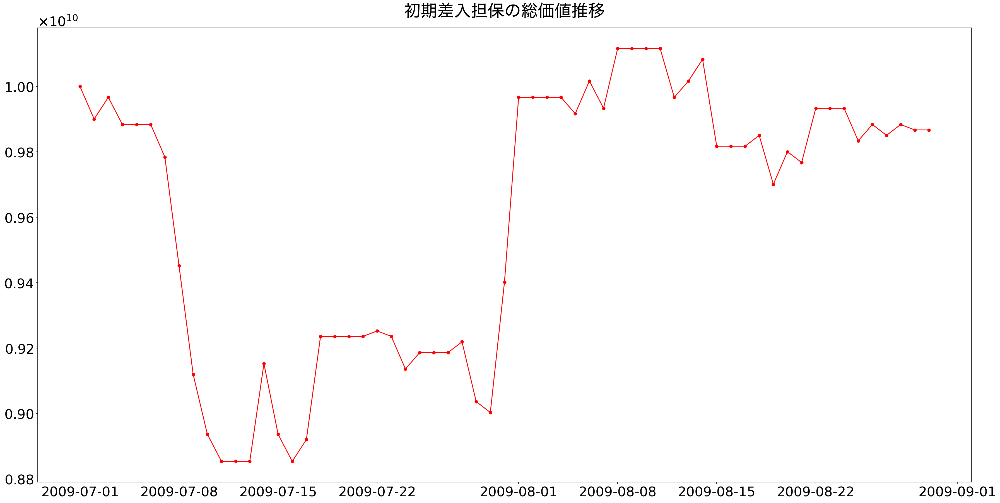

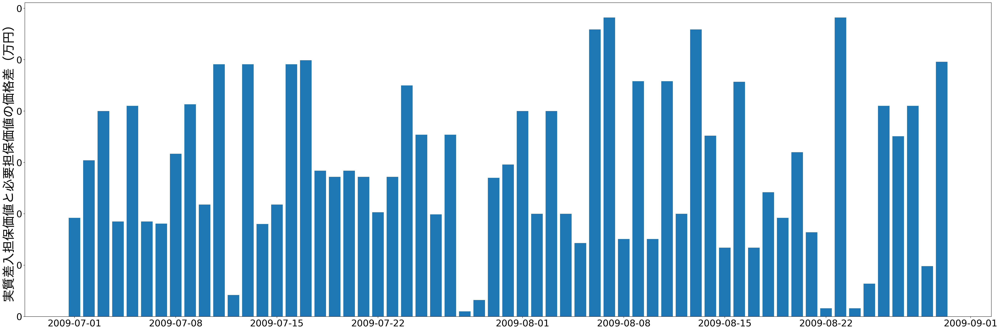

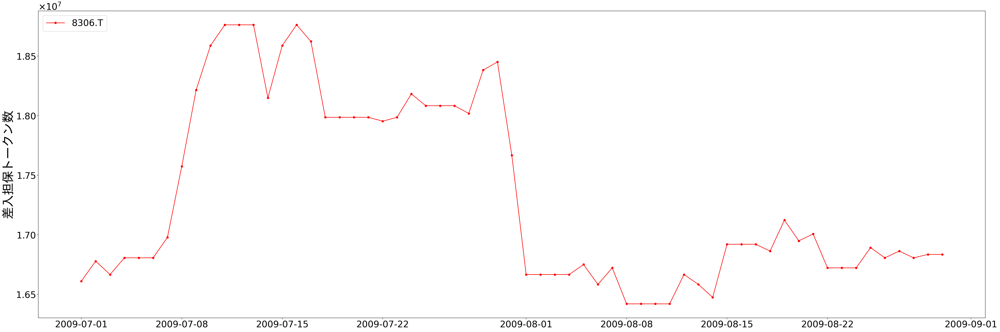

In [15]:
visualizer_s1_m1_1 = LogVisualizer(logs_s1_m1_1, './data0322/s1_m1_1')
# visualizer_s1_m1_1.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m1_1.plt_initial_collateral_portfolio_value()
visualizer_s1_m1_1.bar_collateral_price_diff()
_ = visualizer_s1_m1_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

In [16]:
visualizer_s1_m1_1.calc_portfolio_credit_diff()

KeyError: 'price'

### model1-2（追加検証）
単一担保の取引、マージンコール閾値設定あり

In [33]:
simulator_s1_m1_2 = ExecuteAutoAdjustmentTransactionMulti(single_borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_1_2)
print('Start simulation model1_2...')
%time logs_s1_m1_2 = simulator_s1_m1_2.execute()
print("End simulation model1_2!!!")

"JCT portfolio: {'8306.T': {'num': 16611296, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
"8306.T: {'num': 16611296, 'is_usd': False, 'priority': 5, 'price': 602.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-07-01: Price updating...
8306.T: 602.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 16611296,
                                      'price': 602.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000192.0],
 'date': [datetime.date(2009, 7, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 16611296,
                                              'price': 602.

2009-07-15: Price updating...
JPY: 1.0
2009-07-15: Price updating...
8306.T: 538.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 438541, 'is_usd': False, 'priority': 5, 'price': 538.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'8306.T': {'is_usd': False, 'num': 18587361, 'price': 538.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-16
2009-07-16: Price updating...
JPY: 1.0
2009-07-16: Price updating...
8306.T: 533.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  92936587.0
{'8306.T': {'is_usd': False, 'num': 18587361, 'price': 533.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

{'8306.T': {'is_usd': False, 'num': 17667844, 'price': 566.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-01
2009-08-01: Price updating...
JPY: 1.0
2009-08-01: Price updating...
8306.T: 600.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 17667844, 'is_usd': False, 'price': 600.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'8306.T': {'is_usd': False, 'num': 16666666, 'price': 600.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-02
2009-08-02: Price updating...
JPY: 1.0
2009-08-02: Price updating...
8306.T: 600.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  2000

2009-08-17: Price updating...
JPY: 1.0
2009-08-17: Price updating...
8306.T: 591.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  150000394.0
{'8306.T': {'is_usd': False, 'num': 16666666, 'price': 591.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-18
2009-08-18: Price updating...
JPY: 1.0
2009-08-18: Price updating...
8306.T: 593.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  116667062.0
{'8306.T': {'is_usd': False, 'num': 16666666, 'price': 593.0, 'priority': 5}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08

Log Visualizer initialized.


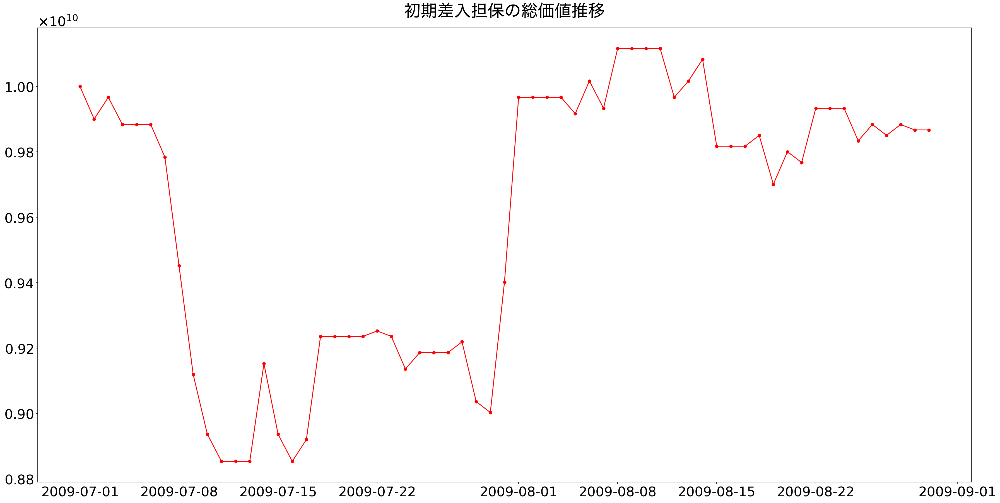

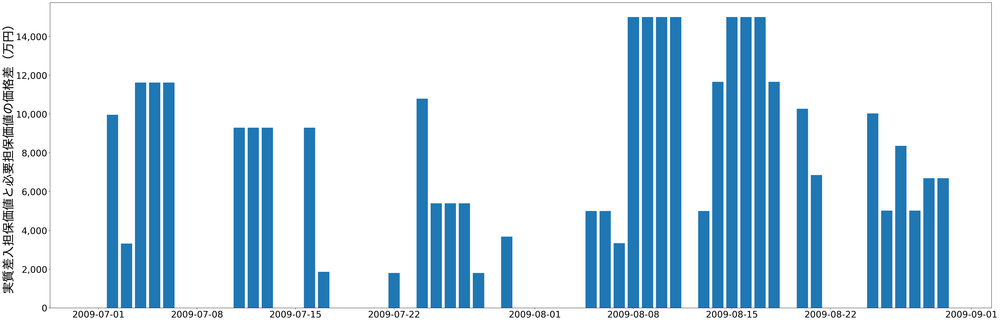

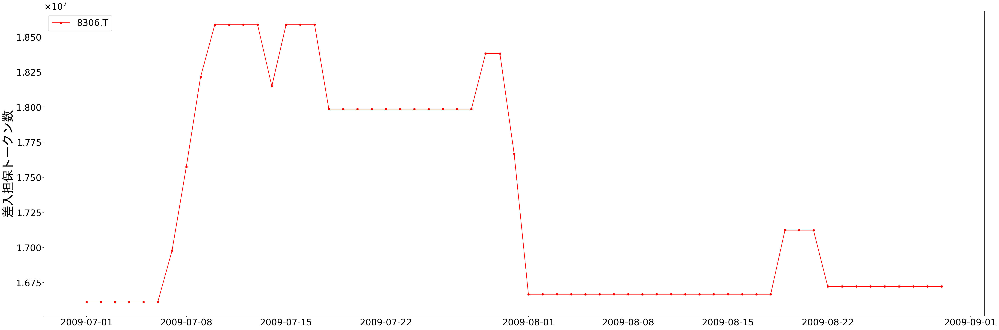

In [34]:
visualizer_s1_m1_2 = LogVisualizer(logs_s1_m1_2, './data0322/s1_m1_2')
# visualizer_s1_m1_2.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m1_2.plt_initial_collateral_portfolio_value()
visualizer_s1_m1_2.bar_collateral_price_diff()
_ = visualizer_s1_m1_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、静的優先度付け

In [13]:
simulator_s1_m2_1 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_2_1)
print('Start simulation model2_1...')
%time logs_s1_m2_1 = simulator_s1_m2_1.execute()
print("End simulation model2_1!!!")

("JCT portfolio: {'8306.T': {'num': 3322260, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2469136, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 641026, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1183432, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1771480, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 3322260, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 2469136, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 641026, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1183432, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1771480, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
20

2009-07-05: Price updating...
JPY: 1.0
2009-07-05: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 3823915, 'is_usd': False, 'price': 595.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3823914, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-06
2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
86

2009-07-13: Price updating...
JPY: 1.0
2009-07-13: Price updating...
8306.T: 533.0
8604.T: 668.0
4901.T: 2815.0
7013.T: 1350.0
8031.T: 1035.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1, 'is_usd': False, 'priority': 5, 'price': 533.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2815.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1350.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1035.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5844304, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 668.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-14
2009-07-14: Price updating...
JPY: 1.0
2009-07-14: Price updating...
8306.T: 551.0
8604.T: 714.0
4901.T: 288

2009-07-22: Price updating...
8306.T: 557.0
8604.T: 780.0
4901.T: 2890.0
7013.T: 1610.0
8031.T: 1139.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 4179904, 'is_usd': False, 'price': 557.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2890.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1610.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1139.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4126512, 'price': 557.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 780.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-23
2009-07-23: Price updating...
JPY: 1.0
2009-07-23: Price updating...
8306.T: 556.0
8604.T: 781.0
4901.T: 2945.0
7013.T: 1630

8306.T: 566.0
8604.T: 829.0
4901.T: 3090.0
7013.T: 1600.0
8031.T: 1187.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 3884840, 'is_usd': False, 'price': 566.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 3090.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1187.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3491303, 'price': 566.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 829.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-01
2009-08-01: Price updating...
JPY: 1.0
2009-08-01: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
is_reverse: 

8604.T: 808.0
4901.T: 2880.0
7013.T: 1700.0
8031.T: 1315.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2859982, 'is_usd': False, 'priority': 5, 'price': 609.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2880.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1700.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1315.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2984323, 'price': 609.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 808.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-10
2009-08-10: Price updating...
JPY: 1.0
2009-08-10: Price updating...
8306.T: 609.0
8604.T: 808.0
4901.T: 2880.0
7013.T: 1700.0
8031.T: 1315.0
is_reverse: True
from Lender(B) to Borrower

7013.T: 1750.0
8031.T: 1232.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 3381233, 'is_usd': False, 'price': 593.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2720.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1750.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1232.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3360983, 'price': 593.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 814.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-19
2009-08-19: Price updating...
JPY: 1.0
2009-08-19: Price updating...
8306.T: 584.0
8604.T: 799.0
4901.T: 2730.0
7013.T: 1740.0
8031.T: 1217.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2483321,

8031.T: 1226.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2990415, 'is_usd': False, 'priority': 5, 'price': 593.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2785.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1910.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1226.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2993500, 'price': 593.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-28
2009-08-28: Price updating...
JPY: 1.0
2009-08-28: Price updating...
8306.T: 595.0
8604.T: 835.0
4901.T: 2815.0
7013.T: 1920.0
8031.T: 1226.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 2993500, 'is_usd': Fals

Log Visualizer initialized.


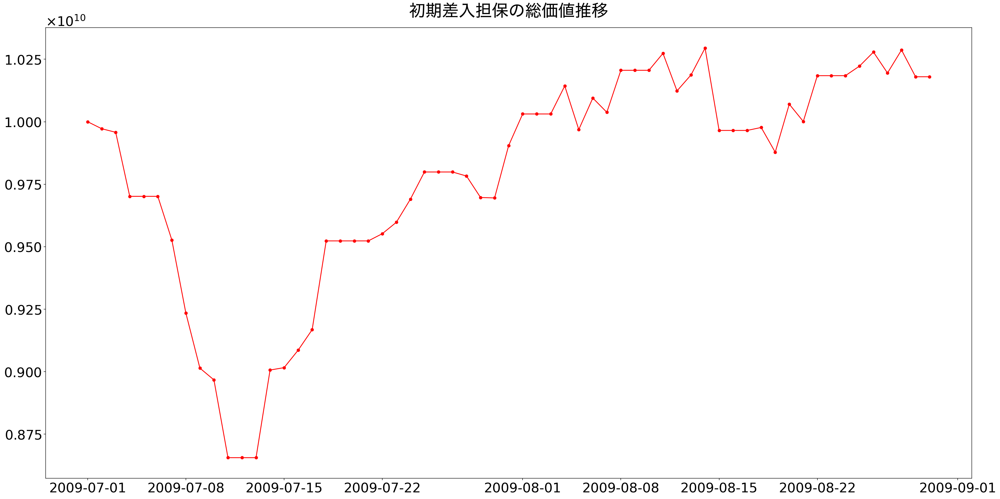

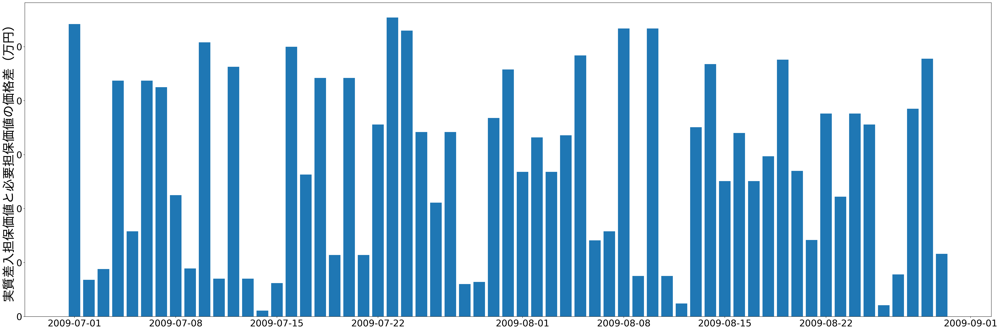

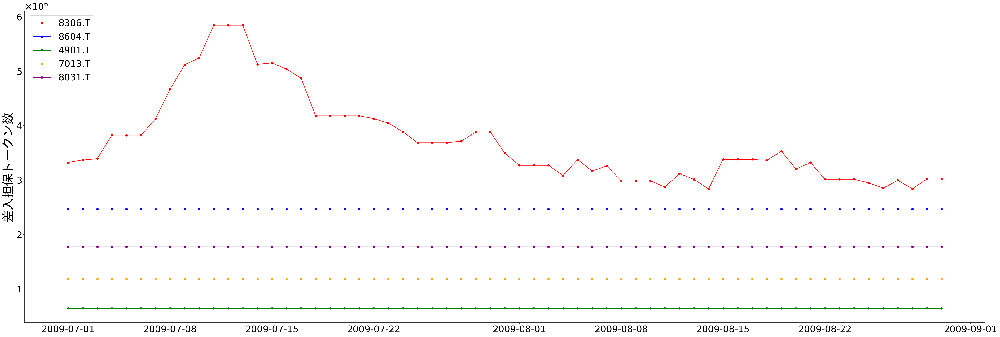

In [14]:
visualizer_s1_m2_1 = LogVisualizer(logs_s1_m2_1, './data0322/s1_m2_1')
# visualizer_s1_m2_1.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m2_1.plt_initial_collateral_portfolio_value()
visualizer_s1_m2_1.bar_collateral_price_diff()
_ = visualizer_s1_m2_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、静的優先度付け

In [15]:
simulator_s1_m2_2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_2_2)
print('Start simulation model2_2...')
%time logs_s1_m2_2 = simulator_s1_m2_2.execute()
print("End simulation model2_2!!!")

("JCT portfolio: {'8306.T': {'num': 3322260, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2469136, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 641026, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1183432, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1771480, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 3322260, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 2469136, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 641026, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1183432, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1771480, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
20

2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -437.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3823915, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-07
2009-07-07: Price updating...
JPY: 1.0
2009-07-07: Price updating...
8306.T: 589.0
8604.T: 793.0
4901.T: 3010.0
7013.T: 1510.0
8031.T: 

{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1420.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1063.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5125445, 'price': 551.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 714.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-15
2009-07-15: Price updating...
JPY: 1.0
2009-07-15: Price updating...
8306.T: 538.0
8604.T: 707.0
4901.T: 2925.0
7013.T: 1480.0
8031.T: 1048.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  13839988.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2925.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 

2009-07-24: Price updating...
JPY: 1.0
2009-07-24: Price updating...
8306.T: 550.0
8604.T: 795.0
4901.T: 2940.0
7013.T: 1640.0
8031.T: 1171.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -161757770.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2940.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1640.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1171.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4179903, 'price': 550.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 795.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-25
2009-07-25: Price updating...
JPY: 1.0
2009-07-25: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
80

2009-08-03: Price updating...
JPY: 1.0
2009-08-03: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  268.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2990.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1180.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3270555, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 832.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-04
2009-08-04: Price updating...
JPY: 1.0
2009-08-04: Price updating...
8306.T: 600.0
8604.T: 814.0
4901.T: 2920.0
7013.T: 1740.0
8031.T: 1

2009-08-13: Price updating...
JPY: 1.0
2009-08-13: Price updating...
8306.T: 603.0
8604.T: 828.0
4901.T: 2865.0
7013.T: 1750.0
8031.T: 1260.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  83582181.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2865.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1750.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1260.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2872907, 'price': 603.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 828.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-14
2009-08-14: Price updating...
JPY: 1.0
2009-08-14: Price updating...
8306.T: 607.0
8604.T: 837.0
4901.T: 2825.0
7013.T: 1780.0
8031

2009-08-23: Price updating...
JPY: 1.0
2009-08-23: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1255.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  376.0
{'4901.T': {'is_usd': False, 'num': 641026, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1183432, 'price': 1830.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1771480, 'price': 1255.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3014082, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2469136, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-24
2009-08-24: Price updating...
JPY: 1.0
2009-08-24: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1

Log Visualizer initialized.


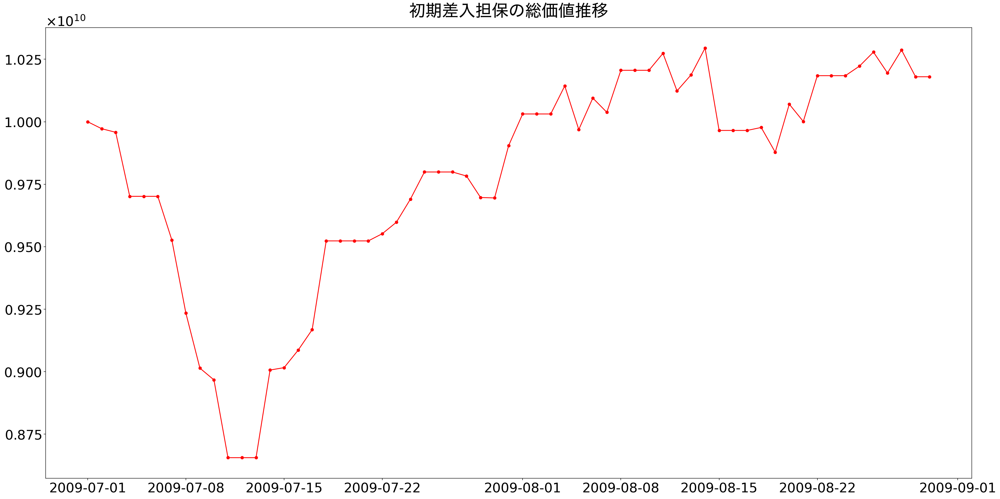

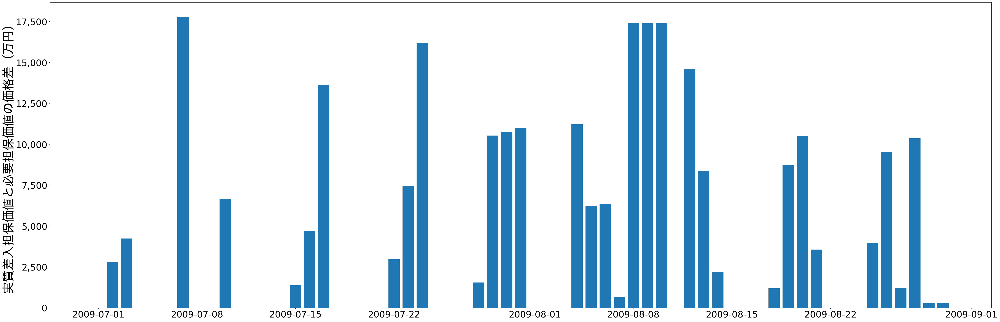

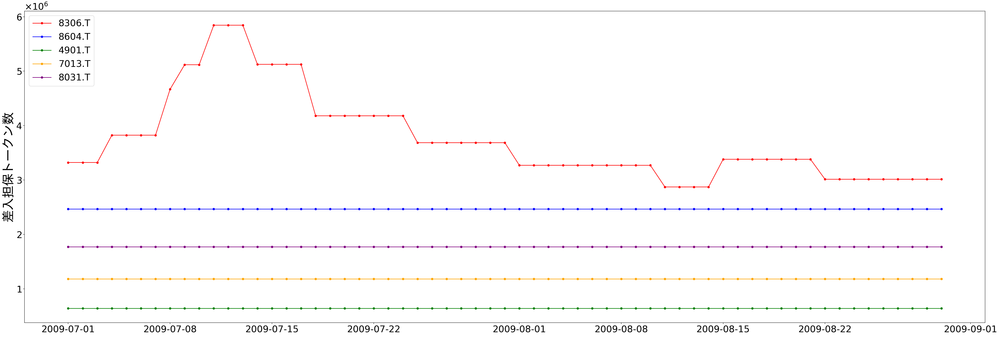

In [16]:
visualizer_s1_m2_2 = LogVisualizer(logs_s1_m2_2, './data0322/s1_m2_2')
# visualizer_s1_m2_2.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m2_2.plt_initial_collateral_portfolio_value()
visualizer_s1_m2_2.bar_collateral_price_diff()
_ = visualizer_s1_m2_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、動的優先度付け

In [39]:
simulator_s1_m3_1 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_3_1)
print('Start simulation model3_1...')
%time logs_s1_m3_1 = simulator_s1_m3_1.execute()
print("End simulation model3_1!!!")
logs_s1_m3_1

("JCT portfolio: {'8306.T': {'num': 3322260, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2469136, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 641026, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1183432, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1771480, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 3322260, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 2469136, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 641026, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1183432, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1771480, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 31

{'4901.T': {'is_usd': False, 'num': 660067, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1290323, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1846723, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3361345, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2433091, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-05
2009-07-05: Price updating...
JPY: 1.0
2009-07-05: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 595.0}"
余剰返還時
"8604.T: {'num': 36045, 'is_usd': False, 'priority': 4, 'price': 822.0}"
余剰返還時
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 3030.0}"
余剰返還時

2009-07-11: Price updating...
JPY: 1.0
2009-07-11: Price updating...
8306.T: 533.0
8604.T: 668.0
4901.T: 2815.0
7013.T: 1350.0
8031.T: 1035.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 533.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 668.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 6989, 'is_usd': False, 'priority': 3, 'price': 2815.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1350.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 1035.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 710480, 'price': 2815.

2009-07-18: Price updating...
JPY: 1.0
2009-07-18: Price updating...
8306.T: 556.0
8604.T: 770.0
4901.T: 2885.0
7013.T: 1600.0
8031.T: 1147.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 27951, 'is_usd': False, 'priority': 5, 'price': 556.0}"
余剰返還時
"8604.T: {'num': 269216, 'is_usd': False, 'priority': 4, 'price': 770.0}"
余剰返還時
"4901.T: {'num': 12399, 'is_usd': False, 'priority': 3, 'price': 2885.0}"
余剰返還時
"7013.T: {'num': 165692, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
余剰返還時
"8031.T: {'num': 102541, 'is_usd': False, 'priority': 1, 'price': 1147.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 693241, 'price': 2885.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1743680, 'price': 1147.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3597123, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2597403, 'price': 770.0, 'priority': 4}}
OK. collateral is moved.
@

2009-07-25: Price updating...
JPY: 1.0
2009-07-25: Price updating...
8306.T: 553.0
8604.T: 820.0
4901.T: 2985.0
7013.T: 1650.0
8031.T: 1169.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 115982, 'is_usd': False, 'priority': 5, 'price': 553.0}"
余剰返還時
"8604.T: {'num': 478288, 'is_usd': False, 'priority': 4, 'price': 820.0}"
余剰返還時
"4901.T: {'num': 30207, 'is_usd': False, 'priority': 3, 'price': 2985.0}"
余剰返還時
"7013.T: {'num': 261969, 'is_usd': False, 'priority': 2, 'price': 1650.0}"
余剰返還時
"8031.T: {'num': 224426, 'is_usd': False, 'priority': 1, 'price': 1169.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 670017, 'price': 2985.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1212122, 'price': 1650.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1710864, 'price': 1169.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3616637, 'price': 553.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2439025, 'price': 820.0, 'priority': 4}}
OK. collateral is mov

2009-08-01: Price updating...
JPY: 1.0
2009-08-01: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 218777, 'is_usd': False, 'priority': 5, 'price': 600.0}"
余剰返還時
"8604.T: {'num': 581466, 'is_usd': False, 'priority': 4, 'price': 832.0}"
余剰返還時
"4901.T: {'num': 63230, 'is_usd': False, 'priority': 3, 'price': 2990.0}"
追加差入（充足時）
"7013.T: {'num': 231482, 'is_usd': False, 'priority': 2, 'price': 1670.0}"
余剰返還時
"8031.T: {'num': 247448, 'is_usd': False, 'priority': 1, 'price': 1180.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 668897, 'price': 2990.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1197605, 'price': 1670.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1694916, 'price': 1180.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3333334, 'price': 600.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2403847, 'price': 832.0, 'priority': 4}}
OK. collateral is

2009-08-08: Price updating...
JPY: 1.0
2009-08-08: Price updating...
8306.T: 609.0
8604.T: 808.0
4901.T: 2880.0
7013.T: 1700.0
8031.T: 1315.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 407864, 'is_usd': False, 'priority': 5, 'price': 609.0}"
余剰返還時
"8604.T: {'num': 449482, 'is_usd': False, 'priority': 4, 'price': 808.0}"
余剰返還時
"4901.T: {'num': 17239, 'is_usd': False, 'priority': 3, 'price': 2880.0}"
追加差入（充足時）
"7013.T: {'num': 269360, 'is_usd': False, 'priority': 2, 'price': 1700.0}"
余剰返還時
"8031.T: {'num': 397448, 'is_usd': False, 'priority': 1, 'price': 1315.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 694445, 'price': 2880.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1176471, 'price': 1700.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1520913, 'price': 1315.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3284073, 'price': 609.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2475248, 'price': 808.0, 'priority': 4}}
OK. collateral is mov

2009-08-15: Price updating...
JPY: 1.0
2009-08-15: Price updating...
8306.T: 591.0
8604.T: 818.0
4901.T: 2690.0
7013.T: 1740.0
8031.T: 1241.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 457453, 'is_usd': False, 'priority': 5, 'price': 591.0}"
追加差入（充足時）
"8604.T: {'num': 604525, 'is_usd': False, 'priority': 4, 'price': 818.0}"
追加差入（充足時）
"4901.T: {'num': 2515, 'is_usd': False, 'priority': 3, 'price': 2690.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"7013.T: {'num': 357886, 'is_usd': False, 'priority': 2, 'price': 1740.0}"
追加差入（充足時）
"8031.T: {'num': 387966, 'is_usd': False, 'priority': 1, 'price': 1241.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 743495, 'price': 2690.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1149426, 'price': 1740.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1611604, 'price': 1241.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3384095, 'price': 591.0, 'priority': 5},
 '8604.T': {

2009-08-22: Price updating...
JPY: 1.0
2009-08-22: Price updating...
8306.T: 598.0
8604.T: 813.0
4901.T: 2810.0
7013.T: 1830.0
8031.T: 1255.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 350985, 'is_usd': False, 'priority': 5, 'price': 598.0}"
余剰返還時
"8604.T: {'num': 509539, 'is_usd': False, 'priority': 4, 'price': 813.0}"
余剰返還時
"4901.T: {'num': 14897, 'is_usd': False, 'priority': 3, 'price': 2810.0}"
余剰返還時
"7013.T: {'num': 370370, 'is_usd': False, 'priority': 2, 'price': 1830.0}"
余剰返還時
"8031.T: {'num': 299714, 'is_usd': False, 'priority': 1, 'price': 1255.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 711744, 'price': 2810.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1092897, 'price': 1830.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1593626, 'price': 1255.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3344482, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2460025, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.


2009-08-29: Price updating...
JPY: 1.0
2009-08-29: Price updating...
8306.T: 594.0
8604.T: 823.0
4901.T: 2775.0
7013.T: 1900.0
8031.T: 1212.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 391001, 'is_usd': False, 'priority': 5, 'price': 594.0}"
追加差入（充足時）
"8604.T: {'num': 598802, 'is_usd': False, 'priority': 4, 'price': 823.0}"
追加差入（充足時）
"4901.T: {'num': 33015, 'is_usd': False, 'priority': 3, 'price': 2775.0}"
追加差入（充足時）
"7013.T: {'num': 439815, 'is_usd': False, 'priority': 2, 'price': 1900.0}"
追加差入（充足時）
"8031.T: {'num': 301046, 'is_usd': False, 'priority': 1, 'price': 1212.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 720721, 'price': 2775.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1052632, 'price': 1900.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1650166, 'price': 1212.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3367004, 'price': 594.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2430134, 'price': 823.0, 'priority': 4}}
OK. c

{'date': [datetime.date(2009, 7, 1),
  datetime.date(2009, 7, 2),
  datetime.date(2009, 7, 3),
  datetime.date(2009, 7, 4),
  datetime.date(2009, 7, 5),
  datetime.date(2009, 7, 6),
  datetime.date(2009, 7, 7),
  datetime.date(2009, 7, 8),
  datetime.date(2009, 7, 9),
  datetime.date(2009, 7, 10),
  datetime.date(2009, 7, 11),
  datetime.date(2009, 7, 12),
  datetime.date(2009, 7, 13),
  datetime.date(2009, 7, 14),
  datetime.date(2009, 7, 15),
  datetime.date(2009, 7, 16),
  datetime.date(2009, 7, 17),
  datetime.date(2009, 7, 18),
  datetime.date(2009, 7, 19),
  datetime.date(2009, 7, 20),
  datetime.date(2009, 7, 21),
  datetime.date(2009, 7, 22),
  datetime.date(2009, 7, 23),
  datetime.date(2009, 7, 24),
  datetime.date(2009, 7, 25),
  datetime.date(2009, 7, 26),
  datetime.date(2009, 7, 27),
  datetime.date(2009, 7, 28),
  datetime.date(2009, 7, 29),
  datetime.date(2009, 7, 30),
  datetime.date(2009, 7, 31),
  datetime.date(2009, 8, 1),
  datetime.date(2009, 8, 2),
  datetime.da

Log Visualizer initialized.


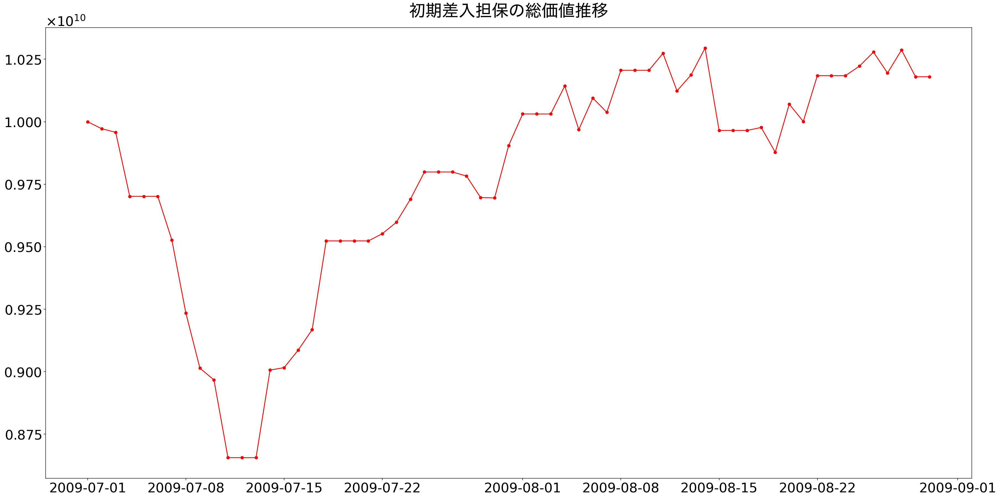

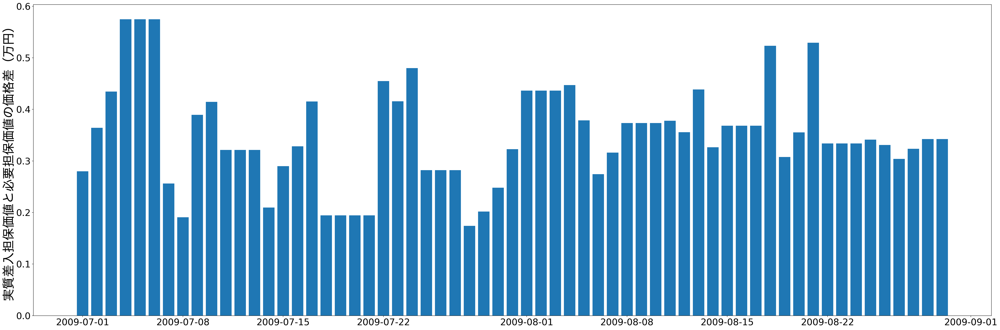

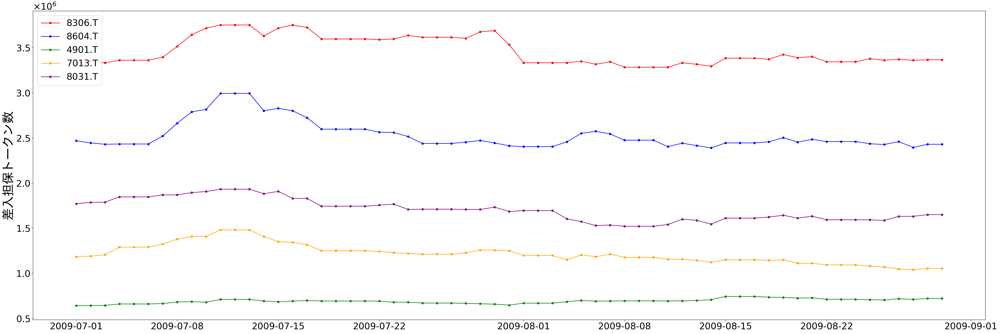

In [40]:
visualizer_s1_m3_1 = LogVisualizer(logs_s1_m3_1, './data0322/s1_m3_1')
# visualizer_s1_m3_1.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m3_1.plt_initial_collateral_portfolio_value()
visualizer_s1_m3_1.bar_collateral_price_diff(is_decimal=True)
_ = visualizer_s1_m3_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、動的優先度付け

In [41]:
simulator_s1_m3_2 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s1, lender_portfolio_X, start_date_1, end_date_1,  options=options_3_2)
print('Start simulation model3_2...')
%time logs_s1_m3_2 = simulator_s1_m3_2.execute()
print("End simulation model3_2!!!")

("JCT portfolio: {'8306.T': {'num': 3322260, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2469136, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 641026, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1183432, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1771480, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-07-01: Price updating...
JPY: 1.0
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 3120.0
7013.T: 1690.0
8031.T: 1129.0
"8306.T: {'num': 3322260, 'is_usd': False, 'priority': 5, 'price': 602.0}"
"8604.T: {'num': 2469136, 'is_usd': False, 'priority': 4, 'price': 810.0}"
"4901.T: {'num': 641026, 'is_usd': False, 'priority': 3, 'price': 3120.0}"
"7013.T: {'num': 1183432, 'is_usd': False, 'priority': 2, 'price': 1690.0}"
"8031.T: {'num': 1771480, 'is_usd': False, 'priority': 1, 'price': 1129.0}"
2009-07-01: Price updating...
8306.T: 602.0
8604.T: 810.0
4901.T: 31

{'4901.T': {'is_usd': False, 'num': 660067, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1290323, 'price': 1550.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1846723, 'price': 1083.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3361345, 'price': 595.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2433091, 'price': 822.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-06
2009-07-06: Price updating...
JPY: 1.0
2009-07-06: Price updating...
8306.T: 595.0
8604.T: 822.0
4901.T: 3030.0
7013.T: 1550.0
8031.T: 1083.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -5746.0
{'4901.T': {'is_usd': False, 'num': 660067, 'price': 3030.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1290323, 'price': 155

2009-07-13: Price updating...
JPY: 1.0
2009-07-13: Price updating...
8306.T: 533.0
8604.T: 668.0
4901.T: 2815.0
7013.T: 1350.0
8031.T: 1035.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -3214.0
{'4901.T': {'is_usd': False, 'num': 710480, 'price': 2815.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1481482, 'price': 1350.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1932368, 'price': 1035.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3752346, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2994012, 'price': 668.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-14
2009-07-14: Price updating...
JPY: 1.0
2009-07-14: Price updating...
8306.T: 551.0
8604.T: 714.0
4901.T: 2885.0
7013.T: 1420.0
8031.T:

2009-07-22: Price updating...
JPY: 1.0
2009-07-22: Price updating...
8306.T: 557.0
8604.T: 780.0
4901.T: 2890.0
7013.T: 1610.0
8031.T: 1139.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -31589861.0
{'4901.T': {'is_usd': False, 'num': 693241, 'price': 2890.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1610.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1743680, 'price': 1139.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3597123, 'price': 557.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2597403, 'price': 780.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-07-23
2009-07-23: Price updating...
JPY: 1.0
2009-07-23: Price updating...
8306.T: 556.0
8604.T: 781.0
4901.T: 2945.0
7013.T: 1630.0
803

8306.T: 566.0
8604.T: 829.0
4901.T: 3090.0
7013.T: 1600.0
8031.T: 1187.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -109511565.0
{'4901.T': {'is_usd': False, 'num': 670017, 'price': 3090.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1212122, 'price': 1600.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1710864, 'price': 1187.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3616637, 'price': 566.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2439025, 'price': 829.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-01
2009-08-01: Price updating...
JPY: 1.0
2009-08-01: Price updating...
8306.T: 600.0
8604.T: 832.0
4901.T: 2990.0
7013.T: 1670.0
8031.T: 1180.0
necessary_each_collateral_value: 2000000000
"8306.T: {'n

price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -163475182.0
{'4901.T': {'is_usd': False, 'num': 668897, 'price': 2880.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1197605, 'price': 1700.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1694916, 'price': 1315.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3333334, 'price': 609.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2403847, 'price': 808.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-10
2009-08-10: Price updating...
JPY: 1.0
2009-08-10: Price updating...
8306.T: 609.0
8604.T: 808.0
4901.T: 2880.0
7013.T: 1700.0
8031.T: 1315.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:

2009-08-18: Price updating...
JPY: 1.0
2009-08-18: Price updating...
8306.T: 593.0
8604.T: 814.0
4901.T: 2720.0
7013.T: 1750.0
8031.T: 1232.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -16286595.0
{'4901.T': {'is_usd': False, 'num': 743495, 'price': 2720.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1149426, 'price': 1750.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1611604, 'price': 1232.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3384095, 'price': 593.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2444988, 'price': 814.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-19
2009-08-19: Price updating...
JPY: 1.0
2009-08-19: Price updating...
8306.T: 584.0
8604.T: 799.0
4901.T: 2730.0
7013.T: 1740.0
803

8306.T: 593.0
8604.T: 813.0
4901.T: 2785.0
7013.T: 1910.0
8031.T: 1226.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -6703937.0
{'4901.T': {'is_usd': False, 'num': 711744, 'price': 2785.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1092897, 'price': 1910.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1593626, 'price': 1226.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3344482, 'price': 593.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2460025, 'price': 813.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-08-28
2009-08-28: Price updating...
JPY: 1.0
2009-08-28: Price updating...
8306.T: 595.0
8604.T: 835.0
4901.T: 2815.0
7013.T: 1920.0
8031.T: 1226.0
price diff is so little that auto margin call is cancelled

Log Visualizer initialized.


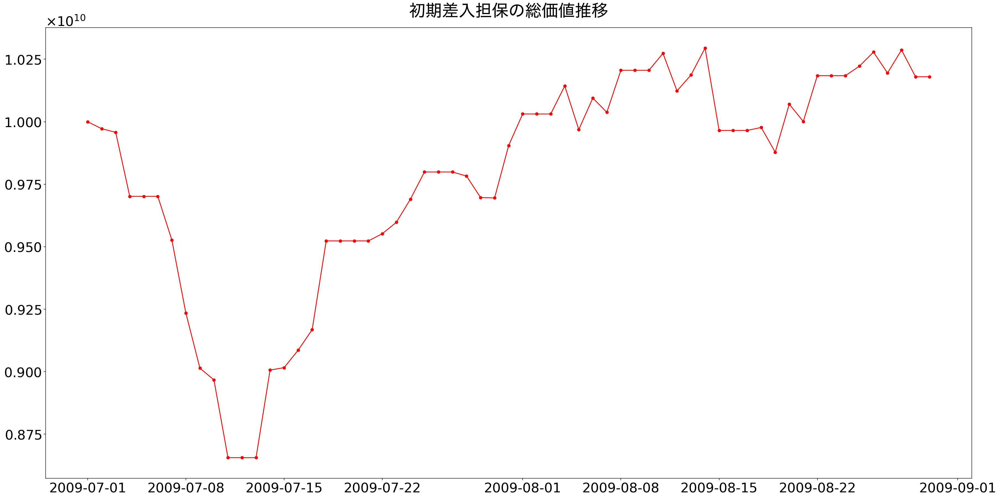

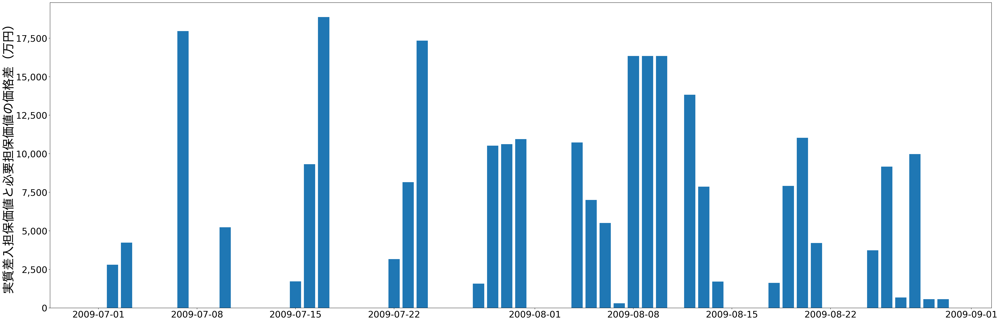

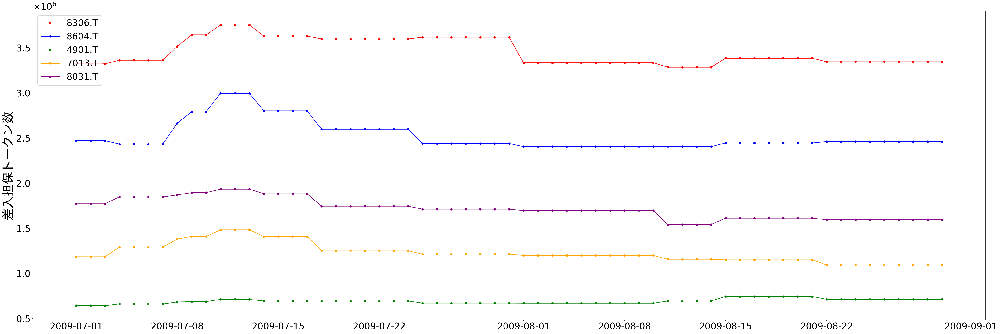

In [42]:
visualizer_s1_m3_2 = LogVisualizer(logs_s1_m3_2, './data0322/s1_m3_2')
# visualizer_s1_m3_2.compare_initial_collateral_portfolio_ratio()
visualizer_s1_m3_2.plt_initial_collateral_portfolio_value()
visualizer_s1_m3_2.bar_collateral_price_diff()
_ = visualizer_s1_m3_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

## シナリオ2: 急落

In [43]:
# シミュレーションの日付設定
start_date_2 = date(2008, 10, 1)
end_date_2 = date(2008, 12, 1)

### model1-1（追加検証）
単一担保の取引、マージンコール閾値設定なし

In [44]:
simulator_s2_m1_1 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_1_1)
print('Start simulation model1-1...')
%time logs_s2_m1_1 = simulator_s2_m1_1.execute()
print("End simulation model1-1!!!")

"JCT portfolio: {'8306.T': {'num': 10834237, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
"8306.T: {'num': 10834237, 'is_usd': False, 'priority': 5, 'price': 923.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008-10-01: Price updating...
8306.T: 923.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 10834237,
                                      'price': 923.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000751.0],
 'date': [datetime.date(2008, 10, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 10834237,
                                              'price': 923

2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 12180267, 'price': 821.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-16
2008-10-16: Price updating...
JPY: 1.0
2008-10-16: Price updating...
8306.T: 741.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 13495277, 'price': 741.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-10-31: Price updating...
JPY: 1.0
2008-10-31: Price updating...
8306.T: 598.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16722409, 'price': 598.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-01
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 15948963, 'price': 627.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17094017, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-17
2008-11-17: Price updating...
JPY: 1.0
2008-11-17: Price updating...
8306.T: 585.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17094018, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

Log Visualizer initialized.


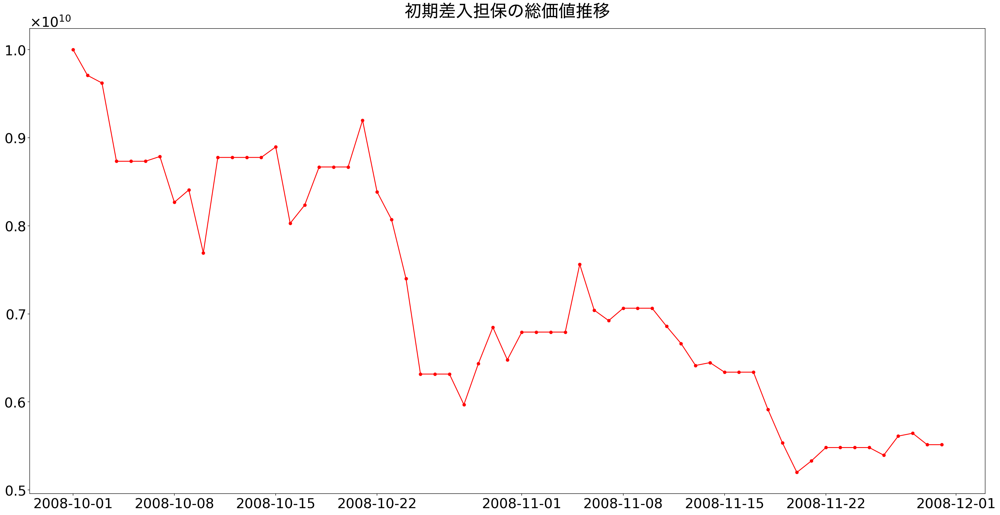

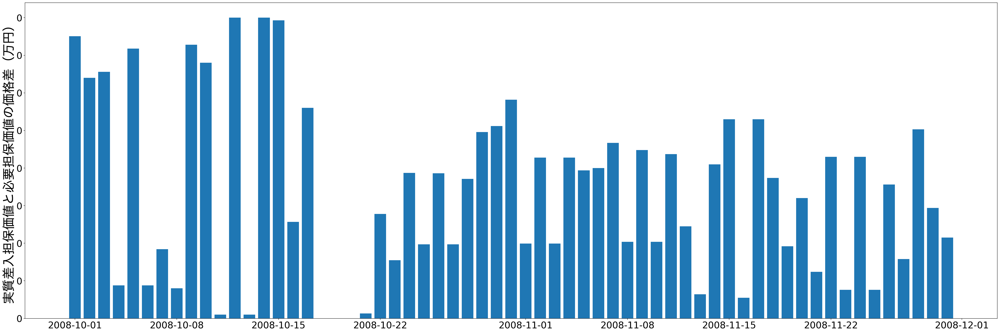

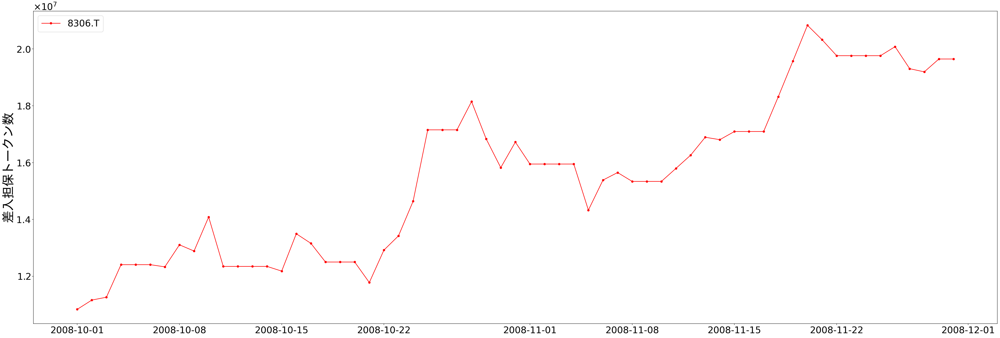

In [45]:
visualizer_s2_m1_1 = LogVisualizer(logs_s2_m1_1, './data0322/s2_m1_1')
# visualizer_s2_m1_1.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m1_1.plt_initial_collateral_portfolio_value()
visualizer_s2_m1_1.bar_collateral_price_diff()
_ = visualizer_s2_m1_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model1-2（追加検証）
単一担保の取引、マージンコール閾値設定あり

In [46]:
simulator_s2_m1_2 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_1_2)
print('Start simulation model1_2...')
%time logs_s2_m1_2 = simulator_s2_m1_2.execute()
print("End simulation model1_2!!!")

"JCT portfolio: {'8306.T': {'num': 10834237, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
"8306.T: {'num': 10834237, 'is_usd': False, 'priority': 5, 'price': 923.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008-10-01: Price updating...
8306.T: 923.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 10834237,
                                      'price': 923.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000751.0],
 'date': [datetime.date(2008, 10, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 10834237,
                                              'price': 923

--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 12345679, 'price': 810.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-15
2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -135802459.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 12345679, 'price': 821.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-16
2008-10-16: Price updating...
JPY: 1.0
2008-10-16: Price updating...
8306.T: 741.0
adjust by single token.
from Borrower(A) to Lender

2008-10-30: Price updating...
JPY: 1.0
2008-10-30: Price updating...
8306.T: 632.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 15822784, 'price': 632.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-31
2008-10-31: Price updating...
JPY: 1.0
2008-10-31: Price updating...
8306.T: 598.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16722409, 'price': 598.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16891892, 'price': 595.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-15
2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  118243180.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16891892, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
price diff is so little that auto margin call is ca

2008-11-30: Price updating...
JPY: 1.0
2008-11-30: Price updating...
8306.T: 509.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  173745329.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19305019, 'price': 509.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 25.8 s, sys: 1.89 s, total: 27.6 s
Wall time: 3min 35s
End simulation model1_2!!!


Log Visualizer initialized.


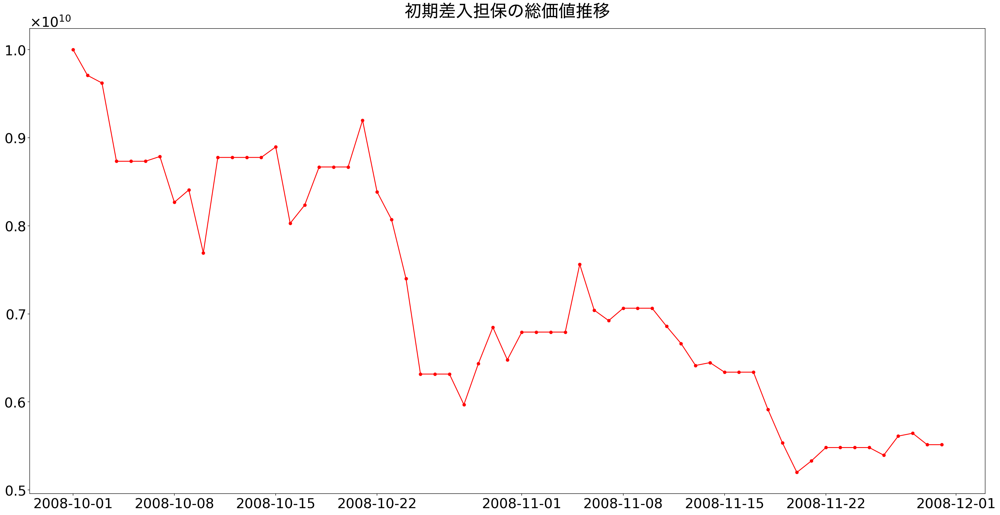

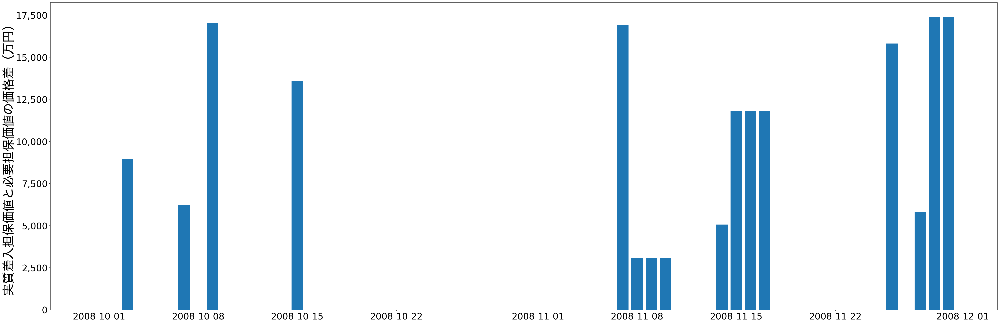

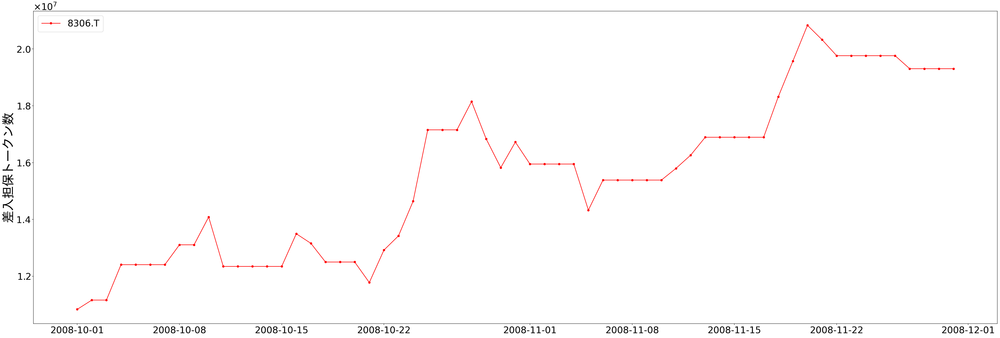

In [47]:
visualizer_s2_m1_2 = LogVisualizer(logs_s2_m1_2, './data0322/s2_m1_2')
# visualizer_s2_m1_2.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m1_2.plt_initial_collateral_portfolio_value()
visualizer_s2_m1_2.bar_collateral_price_diff()
_ = visualizer_s2_m1_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、静的優先度付け

In [88]:
simulator_s2_m2_1 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_2_1)
print('Start simulation model2_1...')
%time logs_s2_m2_1 = simulator_s2_m2_1.execute()
print("End simulation model2_1!!!")

("JCT portfolio: {'8306.T': {'num': 2166848, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1423488, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 736649, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1250000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1479290, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 2166848, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1423488, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 736649, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1250000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1479290, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@


2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 3882627, 'is_usd': False, 'price': 806.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3882626, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-06
2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
49

from Lender(B) to Borrower(A)
"8306.T: {'num': 3452736, 'is_usd': False, 'price': 810.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3452735, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-14
2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1818148, 'is_usd': False, 'priority': 5, 'price': 810

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2190.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 980.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4678033, 'price': 774.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1232.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-23
2008-10-23: Price updating...
JPY: 1.0
2008-10-23: Price updating...
8306.T: 745.0
8604.T: 1179.0
4901.T: 2110.0
7013.T: 1190.0
8031.T: 940.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 592850, 'is_usd': False, 'priority': 5, 'price': 745.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': Fals

2008-10-31: Price updating...
JPY: 1.0
2008-10-31: Price updating...
8306.T: 598.0
8604.T: 902.0
4901.T: 2145.0
7013.T: 1170.0
8031.T: 926.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2200865, 'is_usd': False, 'priority': 5, 'price': 598.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2145.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1170.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 926.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7196621, 'price': 598.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 902.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-01
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T:

8031.T: 991.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2963846, 'is_usd': False, 'priority': 5, 'price': 652.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1320.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 991.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5729344, 'price': 652.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 975.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-10
2008-11-10: Price updating...
JPY: 1.0
2008-11-10: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 5729344, 'is_usd': False, 'price': 652.0, '

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2295.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 827.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 8230570, 'price': 546.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 776.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-19
2008-11-19: Price updating...
JPY: 1.0
2008-11-19: Price updating...
8306.T: 511.0
8604.T: 749.0
4901.T: 2275.0
7013.T: 1160.0
8031.T: 773.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 462619, 'is_usd': False, 'priority': 5, 'price': 511.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 749.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2275.0}"
"7013.T: {'num': 0, 'is_usd': Fa

2008-11-27: Price updating...
JPY: 1.0
2008-11-27: Price updating...
8306.T: 518.0
8604.T: 680.0
4901.T: 2330.0
7013.T: 1120.0
8031.T: 781.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 9883129, 'is_usd': False, 'price': 518.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2330.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 781.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9189788, 'price': 518.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 680.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-28
2008-11-28: Price updating...
JPY: 1.0
2008-11-28: Price updating...
8306.T: 521.0
8604.T: 688.0
4901.T:

Log Visualizer initialized.


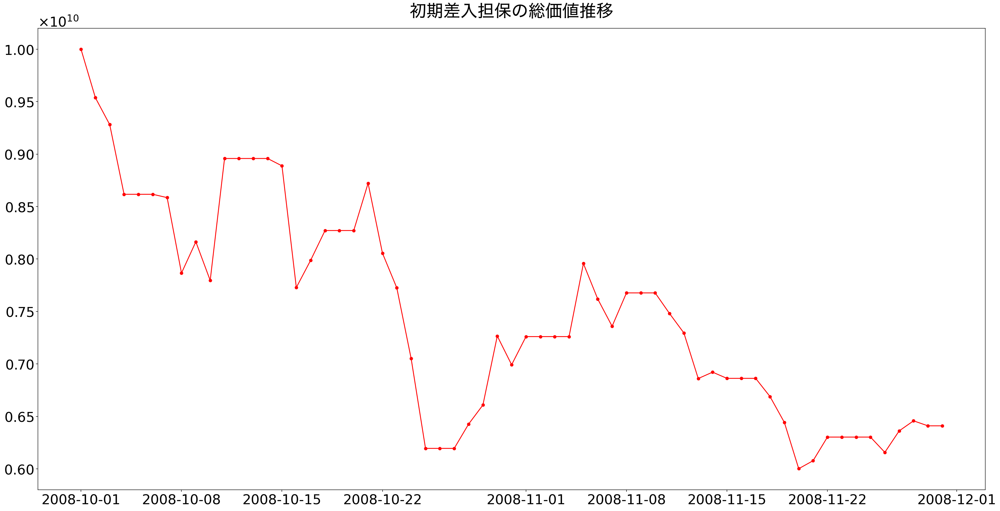

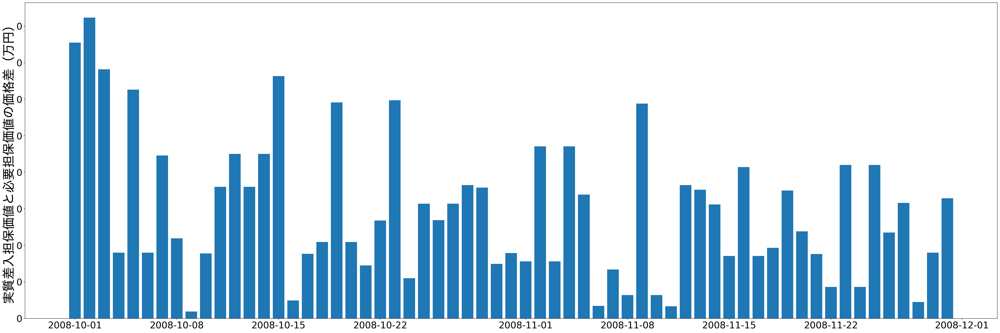

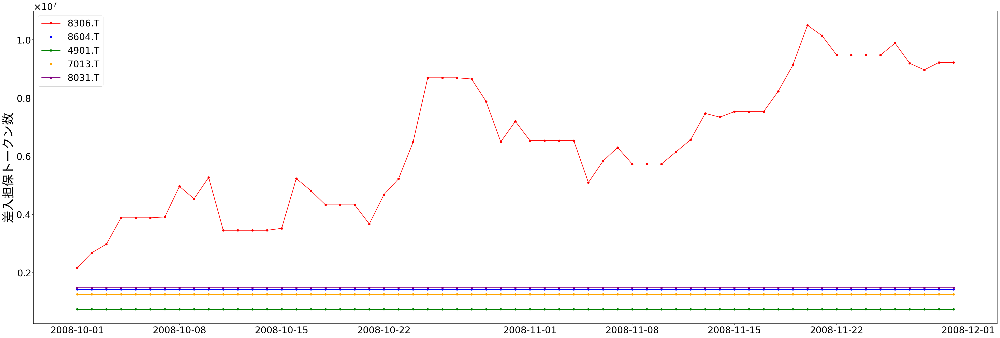

In [89]:
visualizer_s2_m2_1 = LogVisualizer(logs_s2_m2_1, './data0322/s2_m2_1')
# visualizer_s2_m2_1.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m2_1.plt_initial_collateral_portfolio_value()
visualizer_s2_m2_1.bar_collateral_price_diff()
_ = visualizer_s2_m2_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、静的優先度付け

In [90]:
simulator_s2_m2_2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_2_2)
print('Start simulation model2_2...')
%time logs_s2_m2_2 = simulator_s2_m2_2.execute()
print("End simulation model2_2!!!")

("JCT portfolio: {'8306.T': {'num': 2166848, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1423488, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 736649, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1250000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1479290, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 2166848, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1423488, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 736649, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1250000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1479290, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@


2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -180.0
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3882627, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-06
2008-10-06: Price updating...
JPY: 1.0
2008-10-06: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.

2008-10-14: Price updating...
JPY: 1.0
2008-10-14: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  360.0
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3452735, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-15
2008-10-15: Price updating...
JPY: 1.0
2008-10-15: Price updating...
8306.T: 821.0
8604.T: 1413.0
4901.T: 2230.0
7013.T: 1370.0
8031.T

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 940.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5220599, 'price': 745.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 1179.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-24
2008-10-24: Price updating...
JPY: 1.0
2008-10-24: Price updating...
8306.T: 683.0
8604.T: 1055.0
4901.T: 1983.0
7013.T: 1070.0
8031.T: 859.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 50284, 'is_usd': False, 'priority': 5, 'price': 683.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 1055.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 1983.0}"
"7013.T: {'num': 0, 'is_usd': 

2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 7196621, 'is_usd': False, 'price': 627.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6535764, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 927.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-02
2008-11-02: Price updating...
JPY: 1.0
2008-11-02: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T:

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1320.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 991.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5729343, 'price': 652.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 975.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-11
2008-11-11: Price updating...
JPY: 1.0
2008-11-11: Price updating...
8306.T: 633.0
8604.T: 940.0
4901.T: 2300.0
7013.T: 1310.0
8031.T: 973.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2963846, 'is_usd': False, 'priority': 5, 'price': 633.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2275.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1160.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 773.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9128063, 'price': 511.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 749.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-20
2008-11-20: Price updating...
JPY: 1.0
2008-11-20: Price updating...
8306.T: 480.0
8604.T: 666.0
4901.T: 2140.0
7013.T: 1120.0
8031.T: 701.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 480.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 666.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2140.0}"
"7013.T: {'num': 0, 'is_usd': False, 

{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1479290, 'price': 846.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 9189788, 'price': 521.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1423488, 'price': 688.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-29
2008-11-29: Price updating...
JPY: 1.0
2008-11-29: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  15125264.0
{'4901.T': {'is_usd': False, 'num': 736649, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1250000, 'price': 11

Log Visualizer initialized.


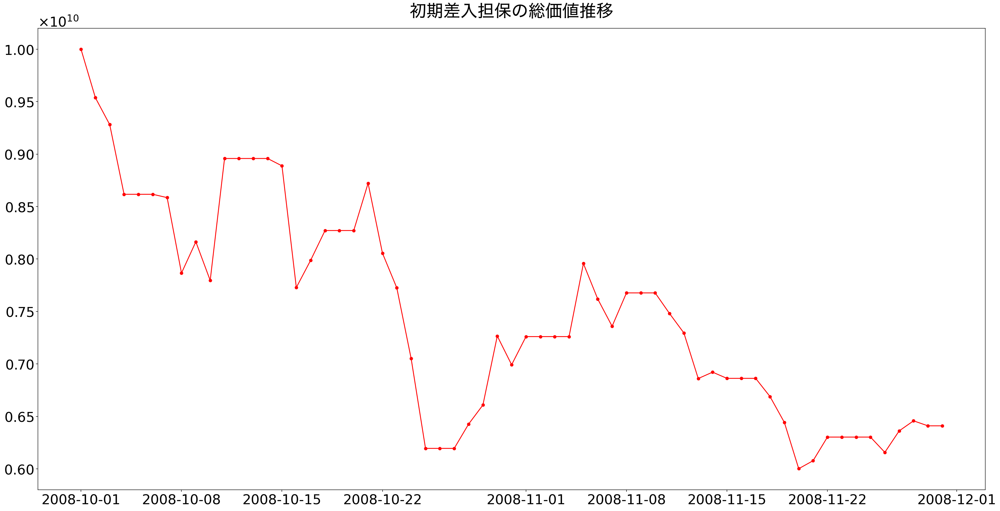

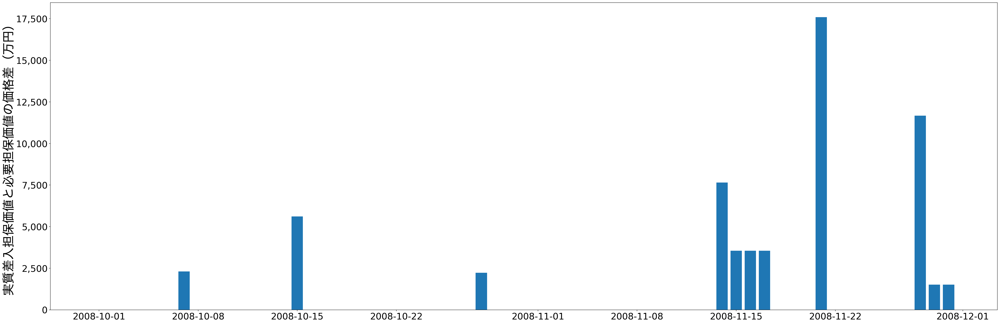

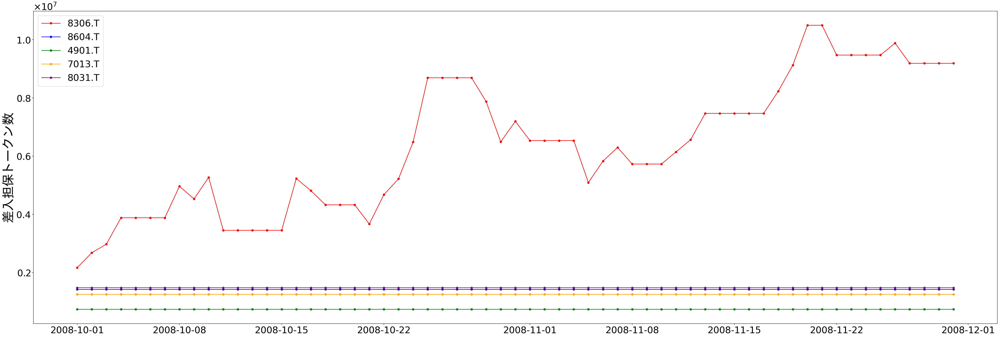

In [91]:
visualizer_s2_m2_2 = LogVisualizer(logs_s2_m2_2, './data0322/s2_m2_2')
# visualizer_s2_m2_2.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m2_2.plt_initial_collateral_portfolio_value()
visualizer_s2_m2_2.bar_collateral_price_diff()
_ = visualizer_s2_m2_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、動的優先度付け

In [52]:
simulator_s2_m3_1 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_3_1)
print('Start simulation model3_1...')
%time logs_s2_m3_1 = simulator_s2_m3_1.execute()
print("End simulation model3_1!!!")

("JCT portfolio: {'8306.T': {'num': 2166848, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1423488, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 736649, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1250000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1479290, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 2166848, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1423488, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 736649, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1250000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1479290, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T:

{'4901.T': {'is_usd': False, 'num': 851064, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1449276, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1795333, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2481390, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1611604, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-05
2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 806.0}"
余剰返還時
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 1241.0}"
余剰返還時
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2350.0}"
余剰返還時


2008-10-11: Price updating...
JPY: 1.0
2008-10-11: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 810.0}"
余剰返還時
"8604.T: {'num': 75288, 'is_usd': False, 'priority': 4, 'price': 1425.0}"
余剰返還時
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2210.0}"
余剰返還時
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1370.0}"
余剰返還時
"8031.T: {'num': 86974, 'is_usd': False, 'priority': 1, 'price': 1240.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 904978, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1459855, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1612904, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2469136, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1403509, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@

2008-10-18: Price updating...
JPY: 1.0
2008-10-18: Price updating...
8306.T: 800.0
8604.T: 1262.0
4901.T: 2225.0
7013.T: 1300.0
8031.T: 999.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 185323, 'is_usd': False, 'priority': 5, 'price': 800.0}"
余剰返還時
"8604.T: {'num': 128163, 'is_usd': False, 'priority': 4, 'price': 1262.0}"
追加差入（充足時）
"4901.T: {'num': 72568, 'is_usd': False, 'priority': 3, 'price': 2225.0}"
余剰返還時
"7013.T: {'num': 90393, 'is_usd': False, 'priority': 2, 'price': 1300.0}"
余剰返還時
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 999.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 898877, 'price': 2225.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1538462, 'price': 1300.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2002003, 'price': 999.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2500000, 'price': 800.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1584787, 'price': 1262.0, 'priority': 4}}
OK. collateral is moved.
@@

2008-10-25: Price updating...
JPY: 1.0
2008-10-25: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 583.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 904.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 18649, 'is_usd': False, 'priority': 3, 'price': 1755.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 980.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 762.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1139602, 'price': 1755.0,

2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 285283, 'is_usd': False, 'priority': 5, 'price': 627.0}"
余剰返還時
"8604.T: {'num': 105586, 'is_usd': False, 'priority': 4, 'price': 927.0}"
余剰返還時
"4901.T: {'num': 207201, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
余剰返還時
"7013.T: {'num': 331415, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
余剰返還時
"8031.T: {'num': 464844, 'is_usd': False, 'priority': 1, 'price': 925.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3189793, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 927.0, 'priority': 4}}
OK. collateral is moved

2008-11-08: Price updating...
JPY: 1.0
2008-11-08: Price updating...
8306.T: 652.0
8604.T: 975.0
4901.T: 2390.0
7013.T: 1320.0
8031.T: 991.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 499874, 'is_usd': False, 'priority': 5, 'price': 652.0}"
余剰返還時
"8604.T: {'num': 213176, 'is_usd': False, 'priority': 4, 'price': 975.0}"
余剰返還時
"4901.T: {'num': 242741, 'is_usd': False, 'priority': 3, 'price': 2390.0}"
余剰返還時
"7013.T: {'num': 466013, 'is_usd': False, 'priority': 2, 'price': 1320.0}"
余剰返還時
"8031.T: {'num': 503781, 'is_usd': False, 'priority': 1, 'price': 991.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 836821, 'price': 2390.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1515152, 'price': 1320.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2018164, 'price': 991.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3067485, 'price': 652.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2051283, 'price': 975.0, 'priority': 4}}
OK. collateral is moved.
@@

2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 268420, 'is_usd': False, 'priority': 5, 'price': 585.0}"
追加差入（充足時）
"8604.T: {'num': 16301, 'is_usd': False, 'priority': 4, 'price': 837.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 256599, 'is_usd': False, 'priority': 3, 'price': 2270.0}"
余剰返還時
"7013.T: {'num': 345901, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
余剰返還時
"8031.T: {'num': 282751, 'is_usd': False, 'priority': 1, 'price': 824.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 881058, 'price': 2270.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2427185, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3418804, 'price': 585.0, 'priority': 5},
 '8604.T': {'is_usd': 

{'4901.T': {'is_usd': False, 'num': 947868, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1754386, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2656043, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4065041, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3100776, 'price': 645.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 101626, 'is_usd': False, 'priority': 5, 'price': 506.0}"
余剰返還時
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 693.0}"
余剰返還時
"4901.T: {'num': 191734, 'is_usd': False, 'priority': 3, 'price': 2280.0}"
余

{'4901.T': {'is_usd': False, 'num': 867679, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1785715, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2364067, 'price': 846.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3838772, 'price': 521.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2906977, 'price': 688.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-29
2008-11-29: Price updating...
JPY: 1.0
2008-11-29: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 327895, 'is_usd': False, 'priority': 5, 'price': 509.0}"
追加差入（充足時）
"8604.T: {'num': 193799, 'is_usd': False, 'priority': 4, 'price': 678.0}"
追加差入（充足時）
"4901.T: {'num': 271923, 'is_usd': False, 'priority': 3, 'price

Log Visualizer initialized.


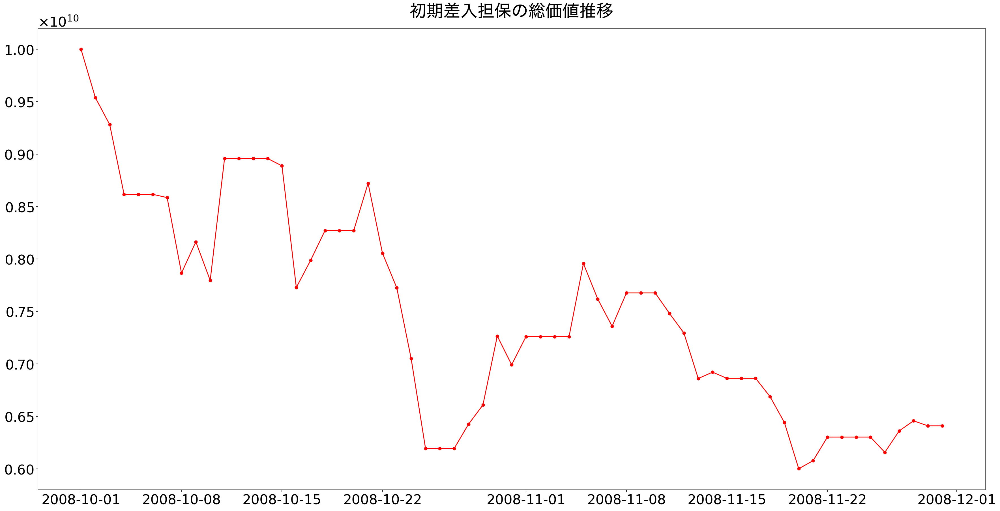

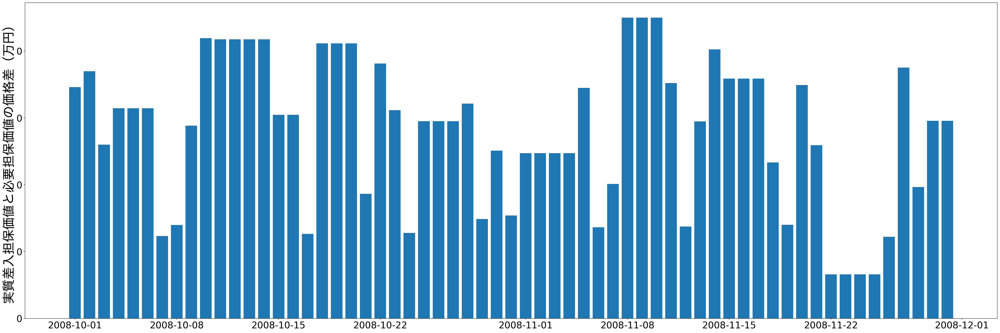

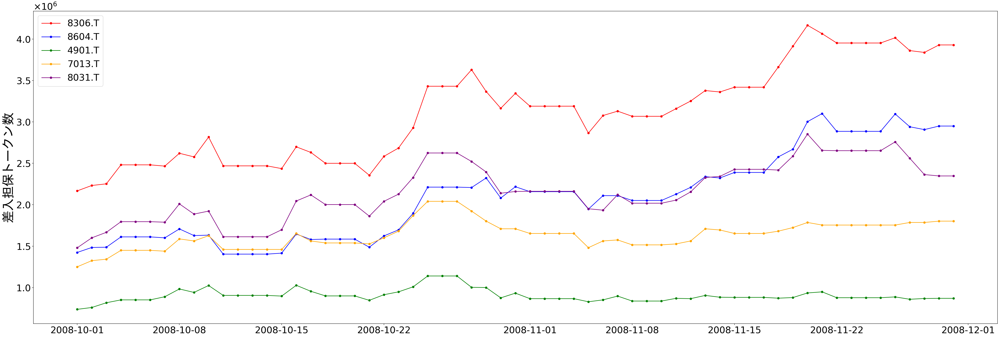

In [53]:
visualizer_s2_m3_1 = LogVisualizer(logs_s2_m3_1, './data0322/s2_m3_1')
# visualizer_s2_m3_1.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m3_1.plt_initial_collateral_portfolio_value()
visualizer_s2_m3_1.bar_collateral_price_diff()
_ = visualizer_s2_m3_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、動的優先度付け

In [54]:
simulator_s2_m3_2 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s2, lender_portfolio_X, start_date_2, end_date_2,  options=options_3_2)
print('Start simulation model3_2...')
%time logs_s2_m3_2 = simulator_s2_m3_2.execute()
print("End simulation model3_2!!!")

("JCT portfolio: {'8306.T': {'num': 2166848, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 1423488, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 736649, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1250000, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 1479290, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-10-01: Price updating...
JPY: 1.0
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T: 2715.0
7013.T: 1600.0
8031.T: 1352.0
"8306.T: {'num': 2166848, 'is_usd': False, 'priority': 5, 'price': 923.0}"
"8604.T: {'num': 1423488, 'is_usd': False, 'priority': 4, 'price': 1405.0}"
"4901.T: {'num': 736649, 'is_usd': False, 'priority': 3, 'price': 2715.0}"
"7013.T: {'num': 1250000, 'is_usd': False, 'priority': 2, 'price': 1600.0}"
"8031.T: {'num': 1479290, 'is_usd': False, 'priority': 1, 'price': 1352.0}"
2008-10-01: Price updating...
8306.T: 923.0
8604.T: 1405.0
4901.T:

{'4901.T': {'is_usd': False, 'num': 851064, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1449276, 'price': 1380.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1795333, 'price': 1114.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2481390, 'price': 806.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1611604, 'price': 1241.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-05
2008-10-05: Price updating...
JPY: 1.0
2008-10-05: Price updating...
8306.T: 806.0
8604.T: 1241.0
4901.T: 2350.0
7013.T: 1380.0
8031.T: 1114.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -3146.0
{'4901.T': {'is_usd': False, 'num': 851064, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1449276, 'price': 1

2008-10-12: Price updating...
JPY: 1.0
2008-10-12: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031.T: 1240.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -4175.0
{'4901.T': {'is_usd': False, 'num': 904978, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1459855, 'price': 1370.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1612904, 'price': 1240.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2469136, 'price': 810.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1403509, 'price': 1425.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-13
2008-10-13: Price updating...
JPY: 1.0
2008-10-13: Price updating...
8306.T: 810.0
8604.T: 1425.0
4901.T: 2210.0
7013.T: 1370.0
8031

8306.T: 800.0
8604.T: 1262.0
4901.T: 2225.0
7013.T: 1300.0
8031.T: 999.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -4116.0
{'4901.T': {'is_usd': False, 'num': 898877, 'price': 2225.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1538462, 'price': 1300.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2002003, 'price': 999.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2500000, 'price': 800.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1584787, 'price': 1262.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-21
2008-10-21: Price updating...
JPY: 1.0
2008-10-21: Price updating...
8306.T: 849.0
8604.T: 1345.0
4901.T: 2365.0
7013.T: 1310.0
8031.T: 1074.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num':

2008-10-27: Price updating...
JPY: 1.0
2008-10-27: Price updating...
8306.T: 583.0
8604.T: 904.0
4901.T: 1755.0
7013.T: 980.0
8031.T: 762.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -2950.0
{'4901.T': {'is_usd': False, 'num': 1139602, 'price': 1755.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2040817, 'price': 980.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2624672, 'price': 762.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3430532, 'price': 583.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2212390, 'price': 904.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-10-28
2008-10-28: Price updating...
JPY: 1.0
2008-10-28: Price updating...
8306.T: 551.0
8604.T: 906.0
4901.T: 1995.0
7013.T: 1040.0
8031.T: 79

2008-11-04: Price updating...
JPY: 1.0
2008-11-04: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -2472.0
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 925.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3189793, 'price': 627.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 927.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-05
2008-11-05: Price updating...
JPY: 1.0
2008-11-05: Price updating...
8306.T: 698.0
8604.T: 1027.0
4901.T: 2415.0
7013.T: 1350.0
8031.T: 

2008-11-12: Price updating...
JPY: 1.0
2008-11-12: Price updating...
8306.T: 615.0
8604.T: 905.0
4901.T: 2310.0
7013.T: 1280.0
8031.T: 928.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 470207, 'is_usd': False, 'priority': 5, 'price': 615.0}"
追加差入（充足時）
"8604.T: {'num': 195221, 'is_usd': False, 'priority': 4, 'price': 905.0}"
追加差入（充足時）
"4901.T: {'num': 270036, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
余剰返還時
"7013.T: {'num': 514099, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
追加差入（充足時）
"8031.T: {'num': 569173, 'is_usd': False, 'priority': 1, 'price': 928.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2155173, 'price': 928.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3252033, 'price': 615.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2209945, 'price': 905.0, 'priority': 4}}
OK. collate

2008-11-20: Price updating...
JPY: 1.0
2008-11-20: Price updating...
8306.T: 480.0
8604.T: 666.0
4901.T: 2140.0
7013.T: 1120.0
8031.T: 701.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 480.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 666.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 260481, 'is_usd': False, 'priority': 3, 'price': 2140.0}"
追加差入（充足時）
"7013.T: {'num': 316679, 'is_usd': False, 'priority': 2, 'price': 1120.0}"
追加差入（充足時）
"8031.T: {'num': 37349, 'is_usd': False, 'priority': 1, 'price': 701.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 934580, 'price': 2140.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1785715, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 

2008-11-28: Price updating...
JPY: 1.0
2008-11-28: Price updating...
8306.T: 521.0
8604.T: 688.0
4901.T: 2305.0
7013.T: 1120.0
8031.T: 846.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -180110230.0
{'4901.T': {'is_usd': False, 'num': 858370, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1785715, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2560820, 'price': 846.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3861004, 'price': 521.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2941177, 'price': 688.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-29
2008-11-29: Price updating...
JPY: 1.0
2008-11-29: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031

Log Visualizer initialized.


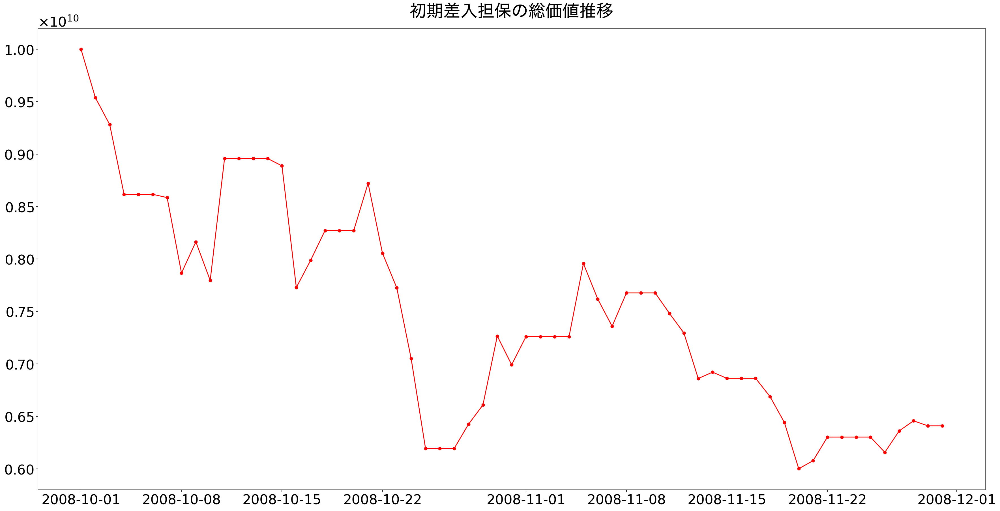

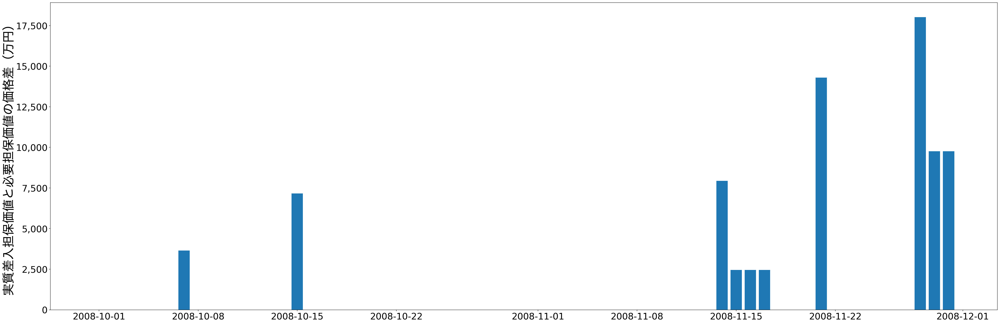

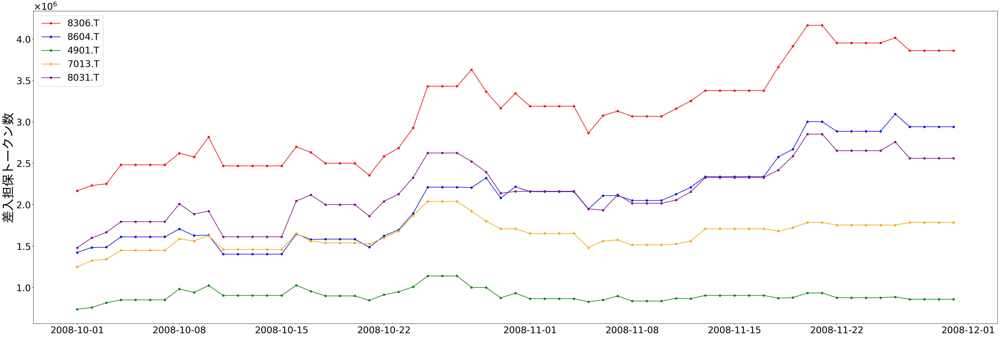

In [55]:
visualizer_s2_m3_2 = LogVisualizer(logs_s2_m3_2, './data0322/s2_m3_2')
# visualizer_s2_m3_2.compare_initial_collateral_portfolio_ratio()
visualizer_s2_m3_2.plt_initial_collateral_portfolio_value()
visualizer_s2_m3_2.bar_collateral_price_diff()
_ = visualizer_s2_m3_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

## シナリオ3: 急騰

In [56]:
# シミュレーションの日付設定
start_date_3 = date(2009, 3, 1)
end_date_3 = date(2009, 5, 1)

### model1-1（追加検証）
単一担保の取引、マージンコール閾値設定なし

In [57]:
simulator_s3_m1_1 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_1_1)
print('Start simulation model1-1...')
%time logs_s3_m1_1 = simulator_s3_m1_1.execute()
print("End simulation model1-1!!!")

"JCT portfolio: {'8306.T': {'num': 23640662, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
"8306.T: {'num': 23640662, 'is_usd': False, 'priority': 5, 'price': 423.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-03-01: Price updating...
8306.T: 423.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 23640662,
                                      'price': 423.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000026.0],
 'date': [datetime.date(2009, 3, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 23640662,
                                              'price': 423.

2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 22675737, 'price': 441.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 22675736, 'price': 441.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2009-03-31: Price updating...
JPY: 1.0
2009-03-31: Price updating...
8306.T: 476.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 21008404, 'price': 476.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-01
2009-04-01: Price updating...
JPY: 1.0
2009-04-01: Price updating...
8306.T: 495.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 20202020, 'price': 495.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19801981, 'price': 505.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-17
2009-04-17: Price updating...
JPY: 1.0
2009-04-17: Price updating...
8306.T: 513.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19493177, 'price': 513.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

Log Visualizer initialized.


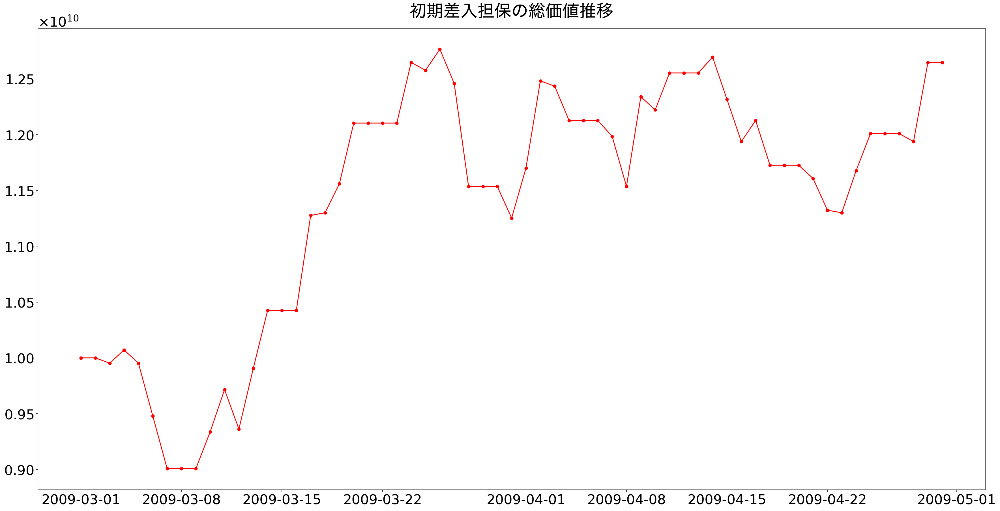

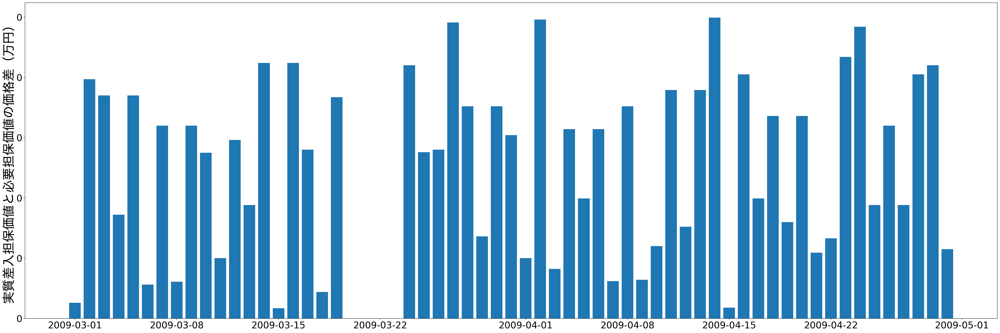

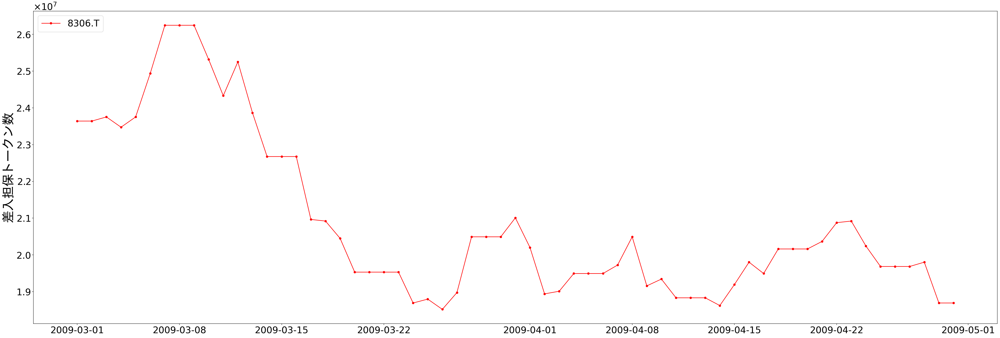

In [58]:
visualizer_s3_m1_1 = LogVisualizer(logs_s3_m1_1, './data0322/s3_m1_1')
# visualizer_s3_m1_1.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m1_1.plt_initial_collateral_portfolio_value()
visualizer_s3_m1_1.bar_collateral_price_diff()
_ = visualizer_s3_m1_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model1-2（追加検証）
単一担保の取引、マージンコール閾値設定あり

In [59]:
simulator_s3_m1_2 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_1_2)
print('Start simulation model1_2...')
%time logs_s3_m1_2 = simulator_s3_m1_2.execute()
print("End simulation model1_2!!!")

"JCT portfolio: {'8306.T': {'num': 23640662, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
"8306.T: {'num': 23640662, 'is_usd': False, 'priority': 5, 'price': 423.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009-03-01: Price updating...
8306.T: 423.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 23640662,
                                      'price': 423.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000026.0],
 'date': [datetime.date(2009, 3, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 23640662,
                                              'price': 423.

2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  424.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 22675736, 'price': 441.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  424.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 22675736, 'price': 441.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@

--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 20491804, 'price': 488.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-31
2009-03-31: Price updating...
JPY: 1.0
2009-03-31: Price updating...
8306.T: 476.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 21008404, 'price': 476.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-01
2009-04-01: Price updating...
JPY: 1.0
2009-04-01: Price updating...
8306.T: 495.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price 

2009-04-15: Price updating...
JPY: 1.0
2009-04-15: Price updating...
8306.T: 521.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19193858, 'price': 521.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-16
2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19801981, 'price': 505.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 18691588, 'price': 535.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 25.9 s, sys: 1.92 s, total: 27.9 s
Wall time: 2min 16s
End simulation model1_2!!!


Log Visualizer initialized.


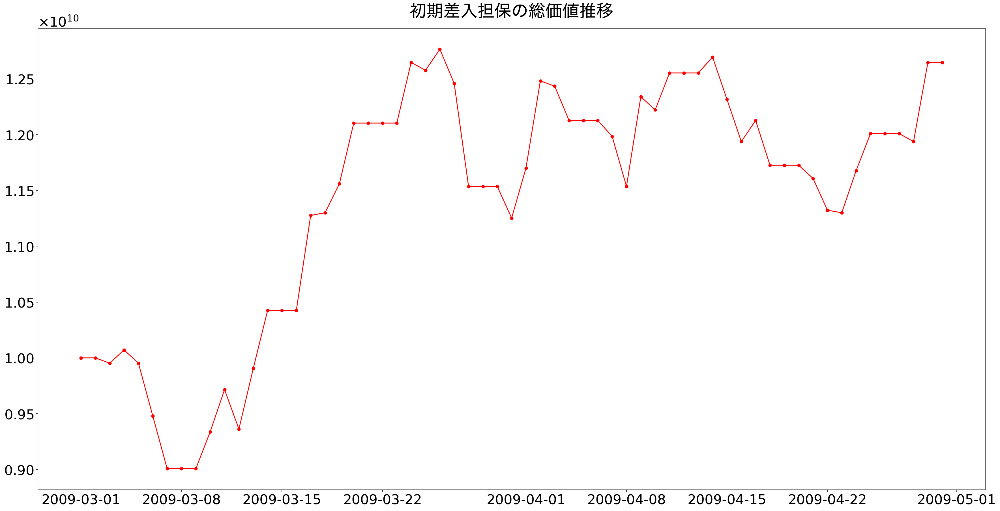

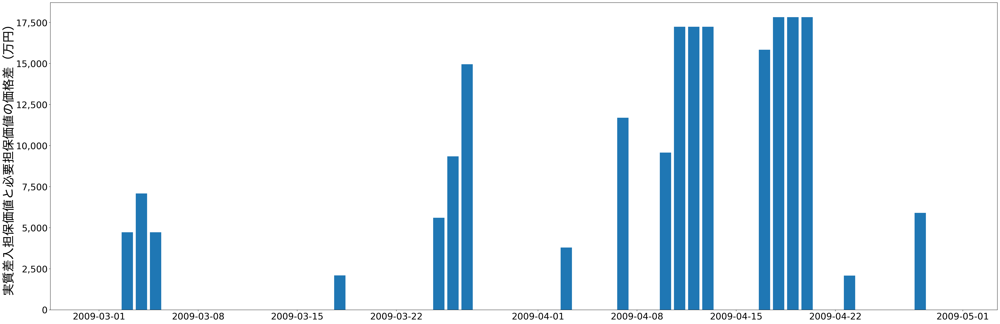

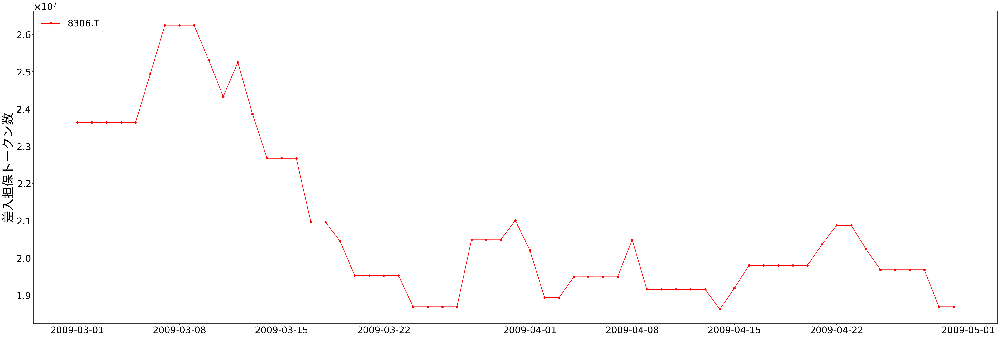

In [60]:
visualizer_s3_m1_2 = LogVisualizer(logs_s3_m1_2, './data0322/s3_m1_2')
# visualizer_s3_m1_2.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m1_2.plt_initial_collateral_portfolio_value()
visualizer_s3_m1_2.bar_collateral_price_diff()
_ = visualizer_s3_m1_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、静的優先度付け

In [92]:
simulator_s3_m2_1 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_2_1)
print('Start simulation model2_1...')
%time logs_s3_m2_1 = simulator_s3_m2_1.execute()
print("End simulation model2_1!!!")

("JCT portfolio: {'8306.T': {'num': 4728133, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 4608295, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1129306, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 2469136, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2259888, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 4728133, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 4608295, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1129306, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 2469136, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 2259888, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 750213, 'is_usd': False, 'priority': 5, 'price': 401.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 417.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 1763.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 890.0}"
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 842.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4955157, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4608295, 'price': 417.0, 'priority': 4}}
OK. collater

2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2562198, 'is_usd': False, 'priority': 5, 'price': 441.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3037122, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4608295, 'price': 481.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 

from Lender(B) to Borrower(A)
"8306.T: {'num': 289427, 'is_usd': False, 'price': 535.0, 'priority': 5}"
"8604.T: {'num': 4608295, 'is_usd': False, 'price': 555.0, 'priority': 4}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1018.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4400803, 'price': 555.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-25
2009-03-25: Price updating...
JPY: 1.0
2009-03-25: Price updating...
8306.T: 532.0
8604.T: 537.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1071.0
from Lender(B) to Borrower(A)
"83

2009-04-02: Price updating...
JPY: 1.0
2009-04-02: Price updating...
8306.T: 528.0
8604.T: 563.0
4901.T: 2305.0
7013.T: 1250.0
8031.T: 1081.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 527132, 'is_usd': False, 'price': 528.0, 'priority': 5}"
"8604.T: {'num': 3966215, 'is_usd': False, 'price': 563.0, 'priority': 4}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1081.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 528.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3317212, 'price': 563.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-03
2009-04-03: Price updating...
JPY

2009-04-11: Price updating...
JPY: 1.0
2009-04-11: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 0, 'is_usd': False, 'price': 531.0, 'priority': 5}"
"8604.T: {'num': 1930980, 'is_usd': False, 'price': 625.0, 'priority': 4}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1659982, 'price': 625.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-12
2009-04-12: Price updating...
JPY: 1.0

8306.T: 496.0
8604.T: 600.0
4901.T: 2595.0
7013.T: 1360.0
8031.T: 1192.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 43650, 'is_usd': False, 'price': 496.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2595.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1360.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1192.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 43649, 'price': 496.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1659982, 'price': 600.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-21
2009-04-21: Price updating...
JPY: 1.0
2009-04-21: Price updating...
8306.T: 491.0
8604.T: 578.0
4901.T: 2515.0
7013.T: 1330.0
8031.T: 1115.0
from Borrower(A) to Lender(B)
"8

8031.T: 1038.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 1235532, 'is_usd': False, 'price': 535.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2500.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1490.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1038.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 513746, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1489141, 'price': 589.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-30
2009-04-30: Price updating...
JPY: 1.0
2009-04-30: Price updating...
8306.T: 535.0
8604.T: 589.0
4901.T: 2500.0
7013.T: 1490.0
8031.T: 1038.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 5085573, 'is_usd': False, 'priority': 5,

Log Visualizer initialized.


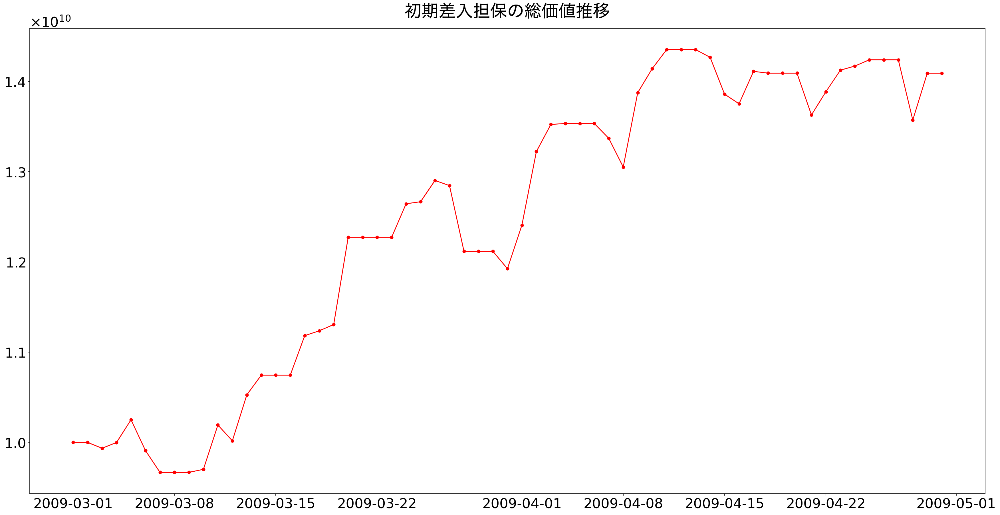

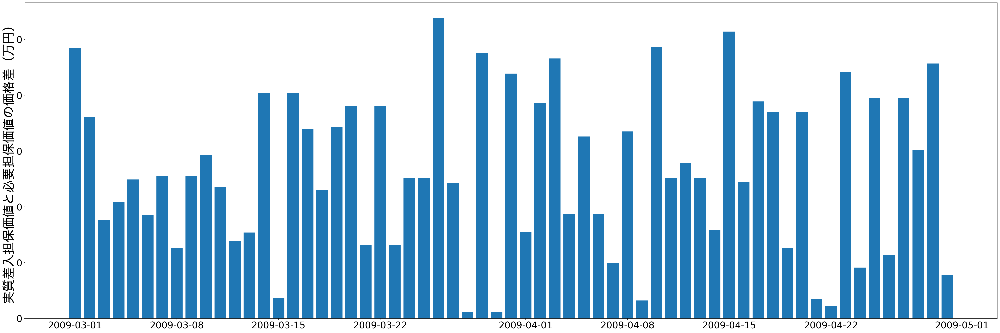

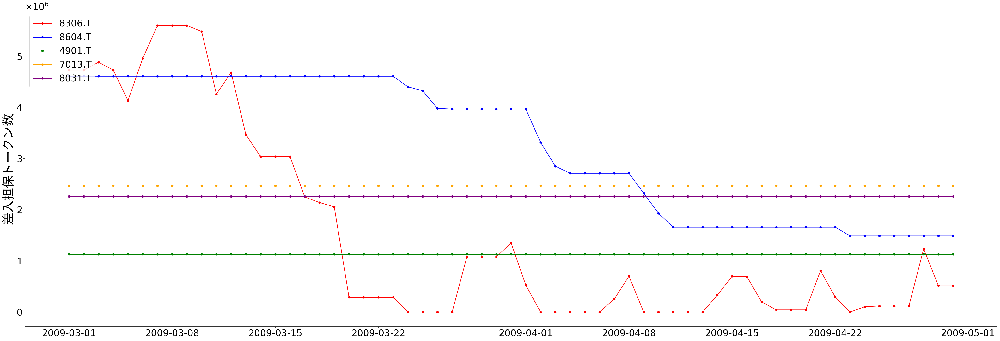

In [93]:
visualizer_s3_m2_1 = LogVisualizer(logs_s3_m2_1, './data0322/s3_m2_1')
# visualizer_s3_m2_1.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m2_1.plt_initial_collateral_portfolio_value()
visualizer_s3_m2_1.bar_collateral_price_diff()
_ = visualizer_s3_m2_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、静的優先度付け

In [94]:
simulator_s3_m2_2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_2_2)
print('Start simulation model2_2...')
%time logs_s3_m2_2 = simulator_s3_m2_2.execute()
print("End simulation model2_2!!!")

("JCT portfolio: {'8306.T': {'num': 4728133, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 4608295, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1129306, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 2469136, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2259888, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 4728133, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 4608295, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1129306, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 2469136, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 2259888, 'is_usd': False, 'priority': 1, 'price': 885.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2009

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 596768, 'is_usd': False, 'priority': 5, 'price': 401.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 417.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 1763.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 890.0}"
"8031.T: {'num': 2, 'is_usd': False, 'priority': 1, 'price': 842.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 890.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 842.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4955157, 'price': 401.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4608295, 'price': 417.0, 'priority': 4}}
OK. collater

2009-03-15: Price updating...
JPY: 1.0
2009-03-15: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -190527472.0
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3469157, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4608295, 'price': 481.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-16
2009-03-16: Price updating...
JPY: 1.0
2009-03-16: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T

{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1018.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4400803, 'price': 555.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-25
2009-03-25: Price updating...
JPY: 1.0
2009-03-25: Price updating...
8306.T: 532.0
8604.T: 537.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1071.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -40559359.0
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2250.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 110

2009-04-03: Price updating...
JPY: 1.0
2009-04-03: Price updating...
8306.T: 526.0
8604.T: 590.0
4901.T: 2365.0
7013.T: 1250.0
8031.T: 1133.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 0, 'is_usd': False, 'price': 526.0, 'priority': 5}"
"8604.T: {'num': 3317212, 'is_usd': False, 'price': 590.0, 'priority': 4}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2365.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1133.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 526.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2851386, 'price': 590.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-04
2009-04-04: Price updating...
JPY: 1.0

8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -169373498.0
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2615.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1330.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1206.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 0, 'price': 531.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1930980, 'price': 625.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-13
2009-04-13: Price updating...
JPY: 1.0
2009-04-13: Price updating...
8306.T: 531.0
8604.T: 625.0
4901.T: 2615.0
7013.T: 1330.0
8031.T: 1206.0
price diff is so little that auto margin call is cancelled.
margincall thre

2009-04-22: Price updating...
JPY: 1.0
2009-04-22: Price updating...
8306.T: 479.0
8604.T: 598.0
4901.T: 2525.0
7013.T: 1420.0
8031.T: 1110.0
from Lender(B) to Borrower(A)
"8306.T: {'num': 607985, 'is_usd': False, 'price': 479.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 1129306, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2469136, 'price': 1420.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2259888, 'price': 1110.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 82903, 'price': 479.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1829670, 'price': 598.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-23
2009-04-23: Price updating...
JPY: 1.0
2009-04-23: Price updating...
8306.T: 478.0
8604.T: 598.0
4901.T:

Log Visualizer initialized.


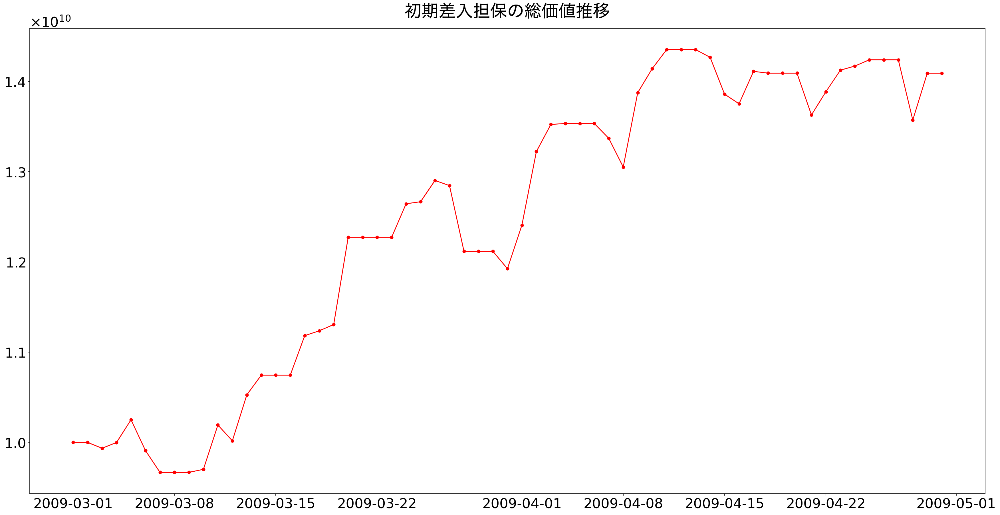

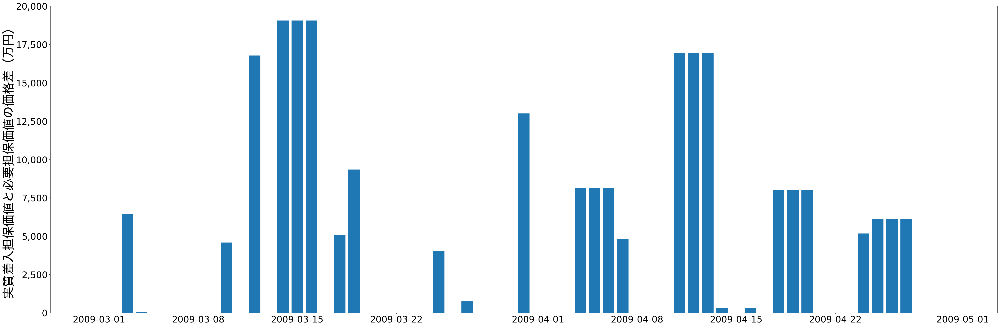

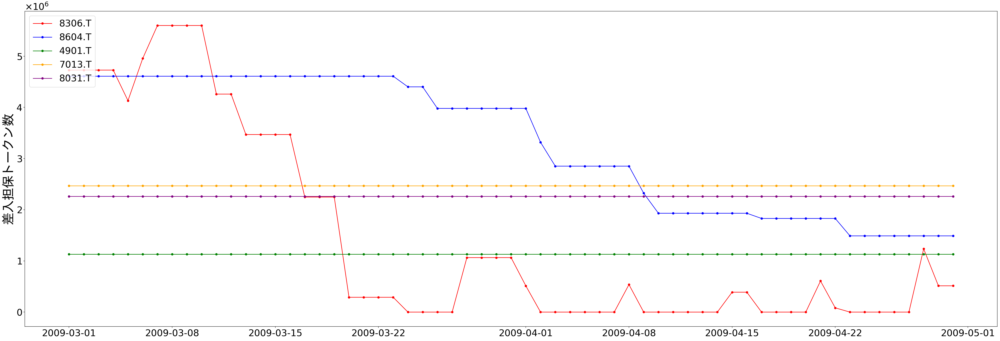

In [95]:
visualizer_s3_m2_2 = LogVisualizer(logs_s3_m2_2, './data0322/s3_m2_2')
# visualizer_s3_m2_2.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m2_2.plt_initial_collateral_portfolio_value()
visualizer_s3_m2_2.bar_collateral_price_diff()
_ = visualizer_s3_m2_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、動的優先度付け

In [65]:
simulator_s3_m3_1 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_3_1)
print('Start simulation model3_1...')
%time logs_s3_m3_1 = simulator_s3_m3_1.execute()
print("End simulation model3_1!!!")

("JCT portfolio: {'8306.T': {'num': 4728133, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 4608295, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1129306, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 2469136, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2259888, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 4728133, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 4608295, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1129306, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 2469136, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 2259888, 'is_usd': False, 'priority': 1, 'price': 885.0}"
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771

2009-03-05: Price updating...
JPY: 1.0
2009-03-05: Price updating...
8306.T: 421.0
8604.T: 426.0
4901.T: 1822.0
7013.T: 920.0
8031.T: 871.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 55758, 'is_usd': False, 'priority': 5, 'price': 421.0}"
追加差入（充足時）
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 426.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 5218, 'is_usd': False, 'priority': 3, 'price': 1822.0}"
余剰返還時
"7013.T: {'num': 143554, 'is_usd': False, 'priority': 2, 'price': 920.0}"
余剰返還時
"8031.T: {'num': 37427, 'is_usd': False, 'priority': 1, 'price': 871.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 1097695, 'price': 1822.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2173914, 'price': 920.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2296212, 'price': 871.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4750594, 'price': 421.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 

2009-03-12: Price updating...
JPY: 1.0
2009-03-12: Price updating...
8306.T: 396.0
8604.T: 449.0
4901.T: 1800.0
7013.T: 900.0
8031.T: 806.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 383163, 'is_usd': False, 'priority': 5, 'price': 396.0}"
追加差入（充足時）
"8604.T: {'num': 464105, 'is_usd': False, 'priority': 4, 'price': 449.0}"
追加差入（充足時）
"4901.T: {'num': 71522, 'is_usd': False, 'priority': 3, 'price': 1800.0}"
追加差入（充足時）
"7013.T: {'num': 196408, 'is_usd': False, 'priority': 2, 'price': 900.0}"
余剰返還時
"8031.T: {'num': 31745, 'is_usd': False, 'priority': 1, 'price': 806.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1111112, 'price': 1800.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2222223, 'price': 900.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2481390, 'price': 806.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5050506, 'price': 396.0, 'priority': 5},
 '8604.T': {'is_usd':

2009-03-19: Price updating...
JPY: 1.0
2009-03-19: Price updating...
8306.T: 489.0
8604.T: 500.0
4901.T: 2110.0
7013.T: 930.0
8031.T: 890.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1065243, 'is_usd': False, 'priority': 5, 'price': 489.0}"
余剰返還時
"8604.T: {'num': 939867, 'is_usd': False, 'priority': 4, 'price': 500.0}"
追加差入（充足時）
"4901.T: {'num': 188204, 'is_usd': False, 'priority': 3, 'price': 2110.0}"
余剰返還時
"7013.T: {'num': 318598, 'is_usd': False, 'priority': 2, 'price': 930.0}"
余剰返還時
"8031.T: {'num': 211242, 'is_usd': False, 'priority': 1, 'price': 890.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 947868, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2150538, 'price': 930.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2247192, 'price': 890.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4089980, 'price': 489.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4000000, 'price': 500.0, 'priority': 4}}
OK. collateral is moved.


2009-03-26: Price updating...
JPY: 1.0
2009-03-26: Price updating...
8306.T: 540.0
8604.T: 557.0
4901.T: 2310.0
7013.T: 1110.0
8031.T: 1077.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1489945, 'is_usd': False, 'priority': 5, 'price': 540.0}"
余剰返還時
"8604.T: {'num': 1106523, 'is_usd': False, 'priority': 4, 'price': 557.0}"
余剰返還時
"4901.T: {'num': 272552, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
余剰返還時
"7013.T: {'num': 650954, 'is_usd': False, 'priority': 2, 'price': 1110.0}"
余剰返還時
"8031.T: {'num': 613976, 'is_usd': False, 'priority': 1, 'price': 1077.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1801802, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1857011, 'price': 1077.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3703704, 'price': 540.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3590665, 'price': 557.0, 'priority': 4}}
OK. collateral is move

2009-04-02: Price updating...
JPY: 1.0
2009-04-02: Price updating...
8306.T: 528.0
8604.T: 563.0
4901.T: 2305.0
7013.T: 1250.0
8031.T: 1081.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1208939, 'is_usd': False, 'priority': 5, 'price': 528.0}"
余剰返還時
"8604.T: {'num': 917023, 'is_usd': False, 'priority': 4, 'price': 563.0}"
余剰返還時
"4901.T: {'num': 260540, 'is_usd': False, 'priority': 3, 'price': 2305.0}"
余剰返還時
"7013.T: {'num': 759734, 'is_usd': False, 'priority': 2, 'price': 1250.0}"
余剰返還時
"8031.T: {'num': 530170, 'is_usd': False, 'priority': 1, 'price': 1081.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 867679, 'price': 2305.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1600000, 'price': 1250.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1850139, 'price': 1081.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3787879, 'price': 528.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3552398, 'price': 563.0, 'priority': 4}}
OK. collateral is moved

2009-04-09: Price updating...
JPY: 1.0
2009-04-09: Price updating...
8306.T: 522.0
8604.T: 616.0
4901.T: 2480.0
7013.T: 1280.0
8031.T: 1154.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1150983, 'is_usd': False, 'priority': 5, 'price': 522.0}"
余剰返還時
"8604.T: {'num': 1340516, 'is_usd': False, 'priority': 4, 'price': 616.0}"
余剰返還時
"4901.T: {'num': 308562, 'is_usd': False, 'priority': 3, 'price': 2480.0}"
余剰返還時
"7013.T: {'num': 802469, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
余剰返還時
"8031.T: {'num': 668153, 'is_usd': False, 'priority': 1, 'price': 1154.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 806452, 'price': 2480.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1733103, 'price': 1154.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3831418, 'price': 522.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3246754, 'price': 616.0, 'priority': 4}}
OK. collateral is move

2009-04-16: Price updating...
JPY: 1.0
2009-04-16: Price updating...
8306.T: 505.0
8604.T: 582.0
4901.T: 2525.0
7013.T: 1280.0
8031.T: 1182.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1410572, 'is_usd': False, 'priority': 5, 'price': 505.0}"
追加差入（充足時）
"8604.T: {'num': 1480834, 'is_usd': False, 'priority': 4, 'price': 582.0}"
追加差入（充足時）
"4901.T: {'num': 353360, 'is_usd': False, 'priority': 3, 'price': 2525.0}"
余剰返還時
"7013.T: {'num': 918748, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
追加差入（充足時）
"8031.T: {'num': 785037, 'is_usd': False, 'priority': 1, 'price': 1182.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 792080, 'price': 2525.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1692048, 'price': 1182.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3960397, 'price': 505.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3436427, 'price': 582.0, 'priority': 4}}
OK. collat

2009-04-23: Price updating...
JPY: 1.0
2009-04-23: Price updating...
8306.T: 478.0
8604.T: 598.0
4901.T: 2540.0
7013.T: 1530.0
8031.T: 1090.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1073978, 'is_usd': False, 'priority': 5, 'price': 478.0}"
追加差入（充足時）
"8604.T: {'num': 1486436, 'is_usd': False, 'priority': 4, 'price': 598.0}"
余剰返還時
"4901.T: {'num': 369361, 'is_usd': False, 'priority': 3, 'price': 2540.0}"
余剰返還時
"7013.T: {'num': 1060685, 'is_usd': False, 'priority': 2, 'price': 1530.0}"
余剰返還時
"8031.T: {'num': 679588, 'is_usd': False, 'priority': 1, 'price': 1090.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 787402, 'price': 2540.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1307190, 'price': 1530.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1834863, 'price': 1090.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4184101, 'price': 478.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3344482, 'price': 598.0, 'priority': 4}}
OK. collatera

2009-04-30: Price updating...
JPY: 1.0
2009-04-30: Price updating...
8306.T: 535.0
8604.T: 589.0
4901.T: 2500.0
7013.T: 1490.0
8031.T: 1038.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1511026, 'is_usd': False, 'priority': 5, 'price': 535.0}"
余剰返還時
"8604.T: {'num': 1435332, 'is_usd': False, 'priority': 4, 'price': 589.0}"
余剰返還時
"4901.T: {'num': 361441, 'is_usd': False, 'priority': 3, 'price': 2500.0}"
余剰返還時
"7013.T: {'num': 1126854, 'is_usd': False, 'priority': 2, 'price': 1490.0}"
余剰返還時
"8031.T: {'num': 554607, 'is_usd': False, 'priority': 1, 'price': 1038.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 800000, 'price': 2500.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1342282, 'price': 1490.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1926783, 'price': 1038.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3738318, 'price': 535.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3395586, 'price': 589.0, 'priority': 4}}
OK. collateral is mov

Log Visualizer initialized.


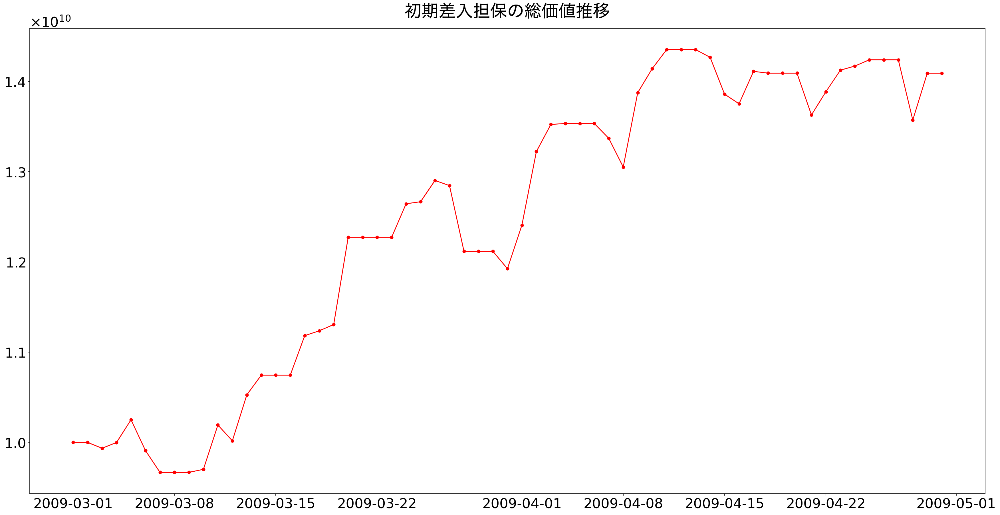

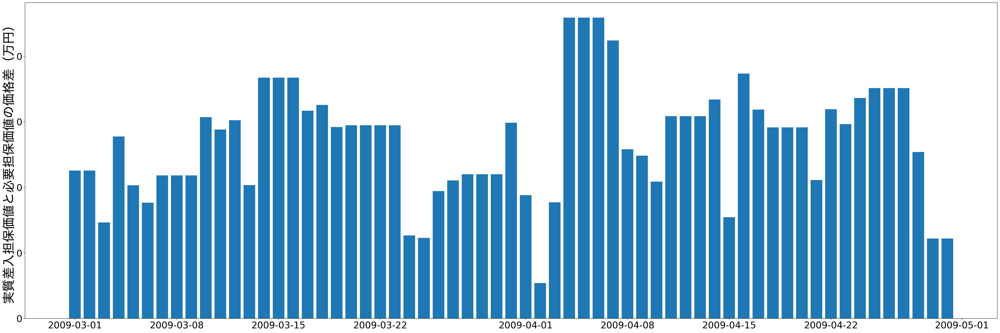

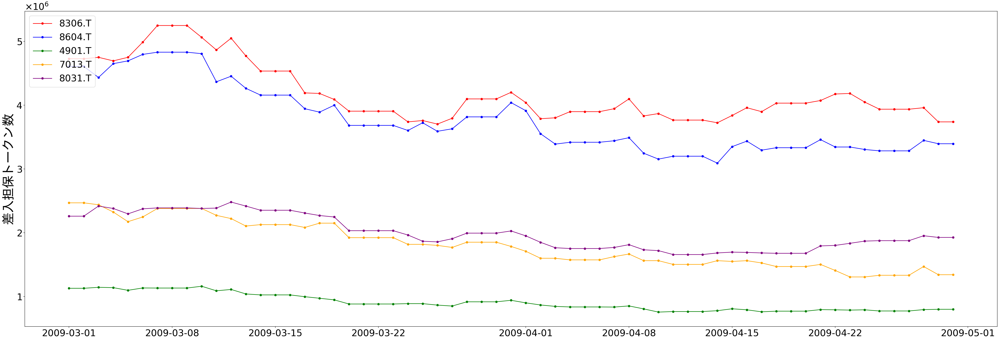

In [66]:
visualizer_s3_m3_1 = LogVisualizer(logs_s3_m3_1, './data0322/s3_m3_1')
# visualizer_s3_m3_1.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m3_1.plt_initial_collateral_portfolio_value()
visualizer_s3_m3_1.bar_collateral_price_diff()
_ = visualizer_s3_m3_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、動的優先度付け

In [67]:
simulator_s3_m3_2 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s3, lender_portfolio_X, start_date_3, end_date_3,  options=options_3_2)
print('Start simulation model3_2...')
%time logs_s3_m3_2 = simulator_s3_m3_2.execute()
print("End simulation model3_2!!!")

("JCT portfolio: {'8306.T': {'num': 4728133, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 4608295, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 1129306, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 2469136, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2259888, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2009-03-01: Price updating...
JPY: 1.0
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771.0
7013.T: 810.0
8031.T: 885.0
"8306.T: {'num': 4728133, 'is_usd': False, 'priority': 5, 'price': 423.0}"
"8604.T: {'num': 4608295, 'is_usd': False, 'priority': 4, 'price': 434.0}"
"4901.T: {'num': 1129306, 'is_usd': False, 'priority': 3, 'price': 1771.0}"
"7013.T: {'num': 2469136, 'is_usd': False, 'priority': 2, 'price': 810.0}"
"8031.T: {'num': 2259888, 'is_usd': False, 'priority': 1, 'price': 885.0}"
2009-03-01: Price updating...
8306.T: 423.0
8604.T: 434.0
4901.T: 1771

2009-03-06: Price updating...
JPY: 1.0
2009-03-06: Price updating...
8306.T: 401.0
8604.T: 417.0
4901.T: 1763.0
7013.T: 890.0
8031.T: 842.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 401.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 417.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 31611, 'is_usd': False, 'priority': 3, 'price': 1763.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"7013.T: {'num': 295222, 'is_usd': False, 'priority': 2, 'price': 890.0}"
追加差入（充足時）
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 842.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 1134430, 'price': 1763.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2247192, 'pri

2009-03-14: Price updating...
JPY: 1.0
2009-03-14: Price updating...
8306.T: 441.0
8604.T: 481.0
4901.T: 1950.0
7013.T: 940.0
8031.T: 850.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 476074, 'is_usd': False, 'priority': 5, 'price': 441.0}"
余剰返還時
"8604.T: {'num': 566525, 'is_usd': False, 'priority': 4, 'price': 481.0}"
余剰返還時
"4901.T: {'num': 93847, 'is_usd': False, 'priority': 3, 'price': 1950.0}"
余剰返還時
"7013.T: {'num': 363872, 'is_usd': False, 'priority': 2, 'price': 940.0}"
追加差入（充足時）
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 850.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 1025642, 'price': 1950.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 2127660, 'price': 940.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2352942, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4535148, 'price': 441.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 4158005, 'price': 481.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@

2009-03-23: Price updating...
JPY: 1.0
2009-03-23: Price updating...
8306.T: 512.0
8604.T: 543.0
4901.T: 2265.0
7013.T: 1040.0
8031.T: 984.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -2945.0
{'4901.T': {'is_usd': False, 'num': 883003, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1923077, 'price': 1040.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2032521, 'price': 984.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3906250, 'price': 512.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3683242, 'price': 543.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-03-24
2009-03-24: Price updating...
JPY: 1.0
2009-03-24: Price updating...
8306.T: 535.0
8604.T: 555.0
4901.T: 2250.0
7013.T: 1100.0
8031.T: 1

2009-04-01: Price updating...
JPY: 1.0
2009-04-01: Price updating...
8306.T: 495.0
8604.T: 511.0
4901.T: 2220.0
7013.T: 1170.0
8031.T: 1025.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1150983, 'is_usd': False, 'priority': 5, 'price': 495.0}"
余剰返還時
"8604.T: {'num': 1014124, 'is_usd': False, 'priority': 4, 'price': 511.0}"
追加差入（充足時）
"4901.T: {'num': 216998, 'is_usd': False, 'priority': 3, 'price': 2220.0}"
余剰返還時
"7013.T: {'num': 617284, 'is_usd': False, 'priority': 2, 'price': 1170.0}"
余剰返還時
"8031.T: {'num': 424362, 'is_usd': False, 'priority': 1, 'price': 1025.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 900901, 'price': 2220.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1709402, 'price': 1170.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1951220, 'price': 1025.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4040405, 'price': 495.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3913895, 'price': 511.0, 'priority': 4}}
OK. collateral is 

2009-04-09: Price updating...
JPY: 1.0
2009-04-09: Price updating...
8306.T: 522.0
8604.T: 616.0
4901.T: 2480.0
7013.T: 1280.0
8031.T: 1154.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1150983, 'is_usd': False, 'priority': 5, 'price': 522.0}"
余剰返還時
"8604.T: {'num': 1340516, 'is_usd': False, 'priority': 4, 'price': 616.0}"
余剰返還時
"4901.T: {'num': 281551, 'is_usd': False, 'priority': 3, 'price': 2480.0}"
余剰返還時
"7013.T: {'num': 802469, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
余剰返還時
"8031.T: {'num': 605143, 'is_usd': False, 'priority': 1, 'price': 1154.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 806452, 'price': 2480.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1733103, 'price': 1154.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3831418, 'price': 522.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3246754, 'price': 616.0, 'priority': 4}}
OK. collateral is move

2009-04-18: Price updating...
JPY: 1.0
2009-04-18: Price updating...
8306.T: 496.0
8604.T: 600.0
4901.T: 2595.0
7013.T: 1360.0
8031.T: 1192.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -141631963.0
{'4901.T': {'is_usd': False, 'num': 808081, 'price': 2595.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1550388, 'price': 1360.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1696353, 'price': 1192.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3838772, 'price': 496.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3350084, 'price': 600.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-19
2009-04-19: Price updating...
JPY: 1.0
2009-04-19: Price updating...
8306.T: 496.0
8604.T: 600.0
4901.T: 2595.0
7013.T: 1360.0
80

8306.T: 508.0
8604.T: 609.0
4901.T: 2585.0
7013.T: 1500.0
8031.T: 1066.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -3514.0
{'4901.T': {'is_usd': False, 'num': 773695, 'price': 2585.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1333334, 'price': 1500.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1876173, 'price': 1066.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3937008, 'price': 508.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3284073, 'price': 609.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2009-04-28
2009-04-28: Price updating...
JPY: 1.0
2009-04-28: Price updating...
8306.T: 505.0
8604.T: 580.0
4901.T: 2515.0
7013.T: 1360.0
8031.T: 1024.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 

Log Visualizer initialized.


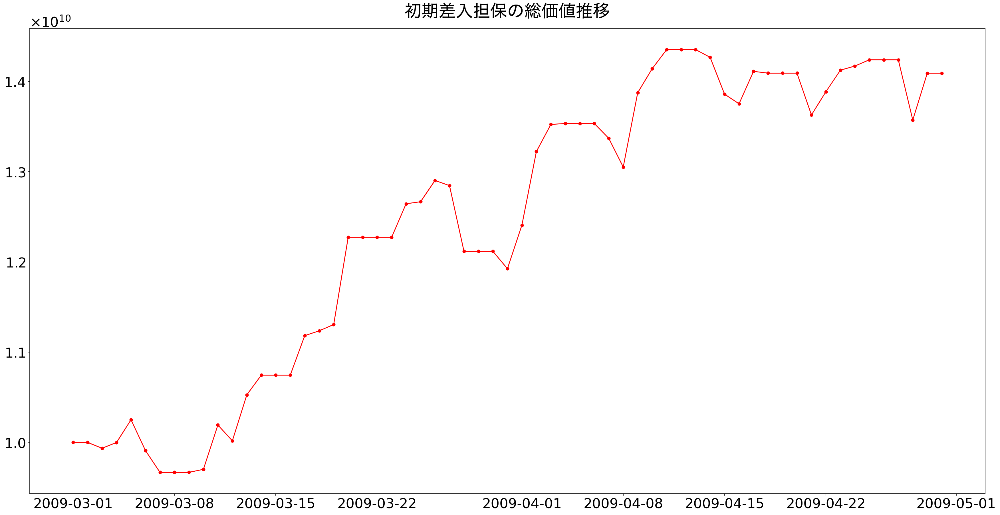

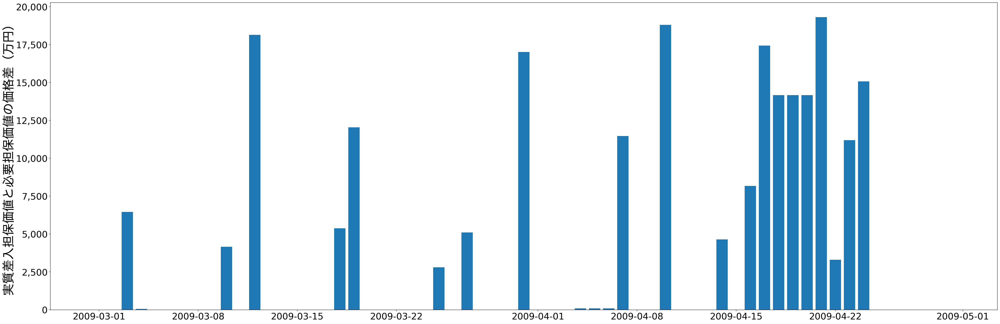

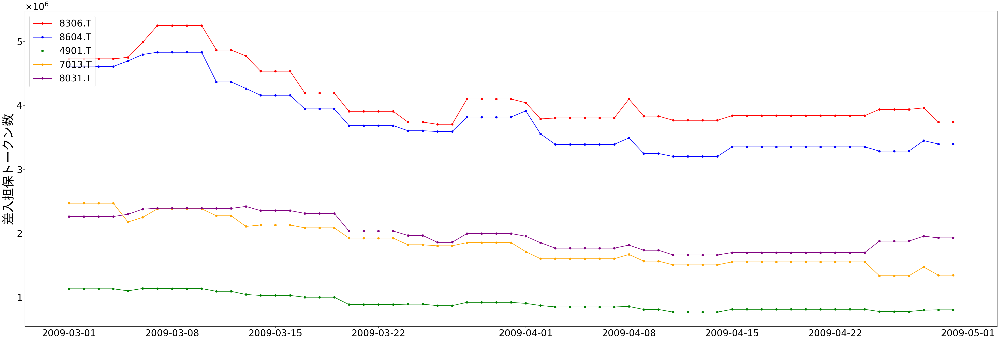

In [68]:
visualizer_s3_m3_2 = LogVisualizer(logs_s3_m3_2, './data0322/s3_m3_2')
# visualizer_s3_m3_2.compare_initial_collateral_portfolio_ratio()
visualizer_s3_m3_2.plt_initial_collateral_portfolio_value()
visualizer_s3_m3_2.bar_collateral_price_diff()
_ = visualizer_s3_m3_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

## シナリオ4: 乱高下

In [20]:
# シミュレーションの日付設定
start_date_4 = date(2008, 11, 1)
end_date_4 = date(2009, 1, 1)

### model1-1（追加検証）
単一担保の取引、マージンコール閾値設定なし

In [70]:
simulator_s4_m1_1 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_1_1)
print('Start simulation model1-1...')
%time logs_s4_m1_1 = simulator_s4_m1_1.execute()
print("End simulation model1-1!!!")

"JCT portfolio: {'8306.T': {'num': 15948964, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
"8306.T: {'num': 15948964, 'is_usd': False, 'priority': 5, 'price': 627.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008-11-01: Price updating...
8306.T: 627.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 15948964,
                                      'price': 627.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000428.0],
 'date': [datetime.date(2008, 11, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 15948964,
                                              'price': 627

2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17094018, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17094017, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-12-01: Price updating...
JPY: 1.0
2008-12-01: Price updating...
8306.T: 509.0
adjust by single token.
from Borrower(A) to Lender(B)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19646366, 'price': 509.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-02
2008-12-02: Price updating...
JPY: 1.0
2008-12-02: Price updating...
8306.T: 474.0
adjust by single token.
from Borrower(A) to Lender(B)
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 21097047, 'price': 474.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-12-17: Price updating...
JPY: 1.0
2008-12-17: Price updating...
8306.T: 519.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19267822, 'price': 519.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-18
2008-12-18: Price updating...
JPY: 1.0
2008-12-18: Price updating...
8306.T: 542.0
adjust by single token.
from Lender(B) to Borrower(A)
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 18450184, 'price': 542.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

Log Visualizer initialized.


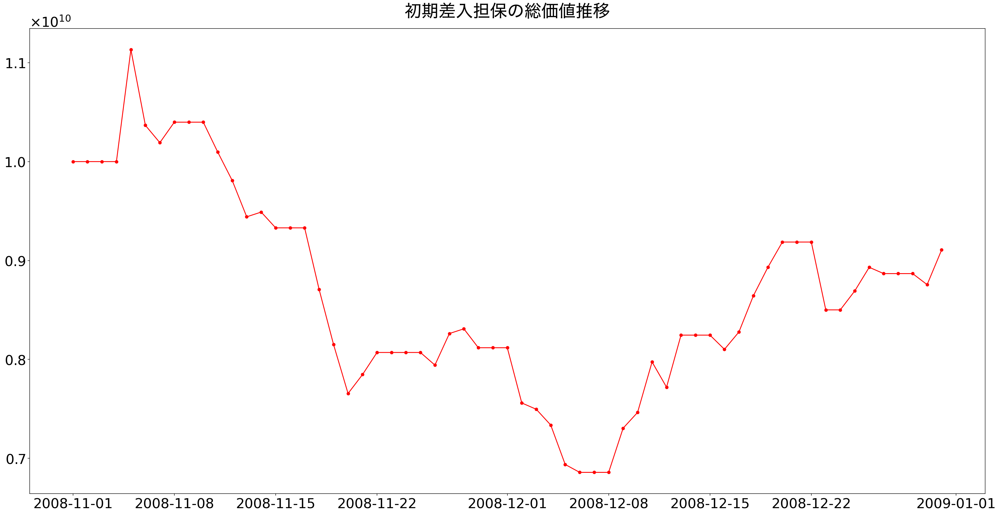

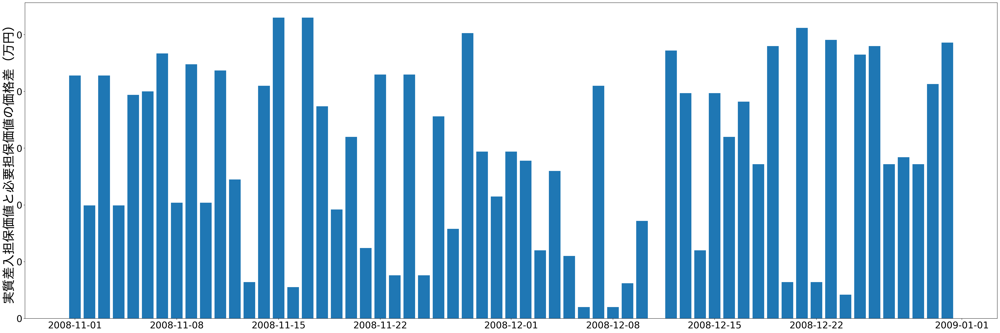

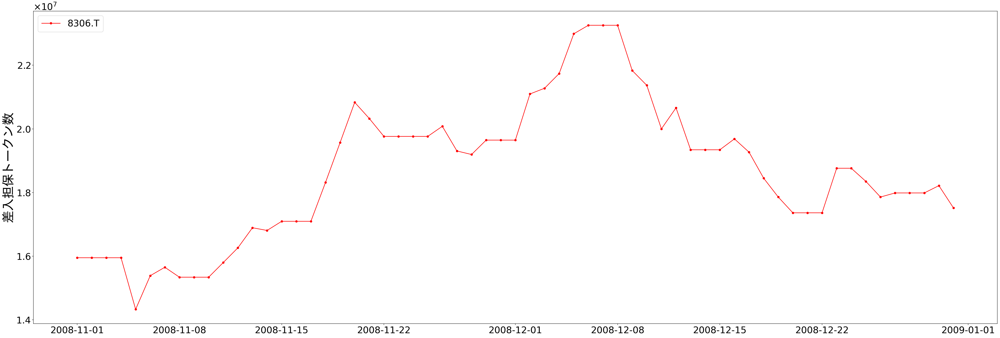

In [71]:
visualizer_s4_m1_1 = LogVisualizer(logs_s4_m1_1, './data0322/s4_m1_1')
# visualizer_s4_m1_1.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m1_1.plt_initial_collateral_portfolio_value()
visualizer_s4_m1_1.bar_collateral_price_diff()
_ = visualizer_s4_m1_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model1-2（追加検証）
単一担保の取引、マージンコール閾値設定あり

In [72]:
simulator_s4_m1_2 = ExecuteAutoAdjustmentTransactionSingle(single_borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_1_2)
print('Start simulation model1_2...')
%time logs_s4_m1_2 = simulator_s4_m1_2.execute()
print("End simulation model1_2!!!")

"JCT portfolio: {'8306.T': {'num': 15948964, 'is_usd': False, 'priority': 5}}"
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
"8306.T: {'num': 15948964, 'is_usd': False, 'priority': 5, 'price': 627.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008-11-01: Price updating...
8306.T: 627.0
Transaction is created.
{'borrower_additional_issue': [False],
 'collateral_portfolio': [{'8306.T': {'is_usd': False,
                                      'num': 15948964,
                                      'price': 627.0,
                                      'priority': 5}}],
 'collateral_sum': [10000000428.0],
 'date': [datetime.date(2008, 11, 1)],
 'has_done_margincall': [True],
 'initial_collateral_portfolio': [{'8306.T': {'is_usd': False,
                                              'num': 15948964,
                                              'price': 627

--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16891892, 'price': 595.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-15
2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  118243180.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 16891892, 'price': 585.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
price diff is so little that auto margin call is ca

2008-11-30: Price updating...
JPY: 1.0
2008-11-30: Price updating...
8306.T: 509.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  173745329.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19305019, 'price': 509.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-01
2008-12-01: Price updating...
JPY: 1.0
2008-12-01: Price updating...
8306.T: 509.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  173745329.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19305019, 'price': 509.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19342359, 'price': 517.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-16
2008-12-16: Price updating...
JPY: 1.0
2008-12-16: Price updating...
8306.T: 508.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  174081628.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 19342359, 'price': 508.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-17
2008-12-17: Price updating...
JPY: 1.0
2008-12-17: Price updating...
8306.T: 519.0
price diff is so little that auto margin call is ca

2008-12-31: Price updating...
JPY: 1.0
2008-12-31: Price updating...
8306.T: 571.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -196428082.0
--------------------OK. collateral is moved.------------------------
{'8306.T': {'is_usd': False, 'num': 17857142, 'price': 571.0, 'priority': 5}}
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 26.4 s, sys: 2.05 s, total: 28.4 s
Wall time: 2min 24s
End simulation model1_2!!!


Log Visualizer initialized.


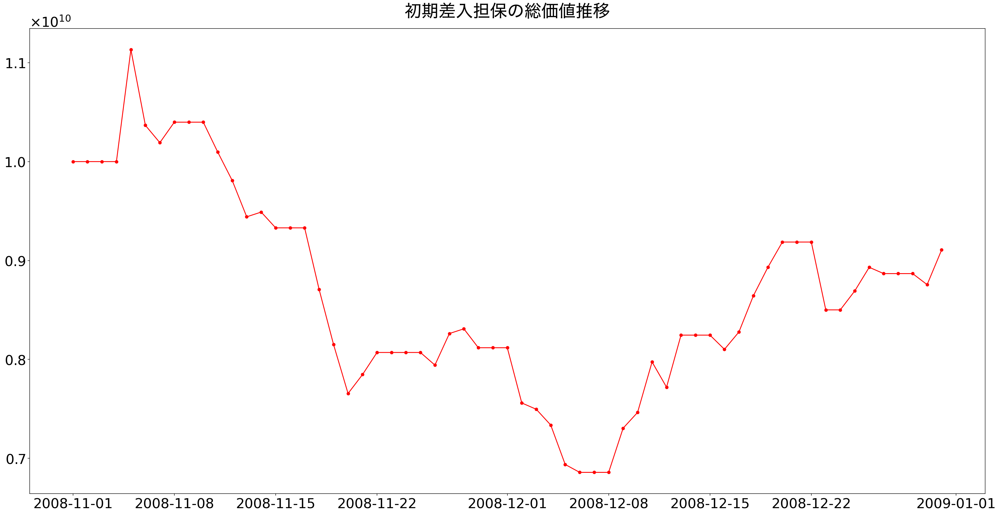

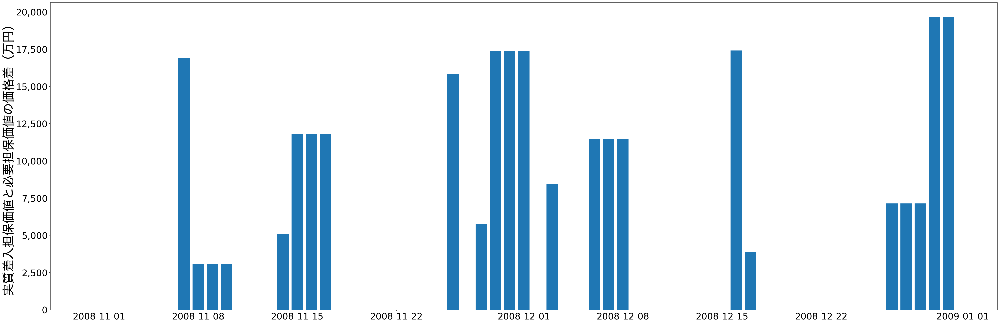

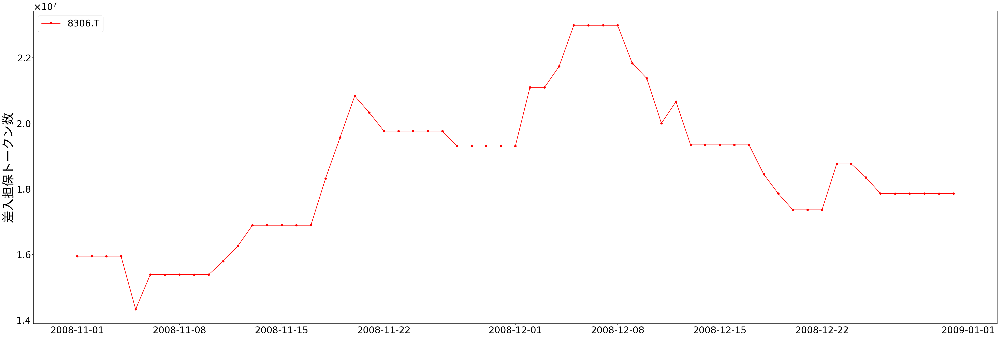

In [73]:
visualizer_s4_m1_2 = LogVisualizer(logs_s4_m1_2, './data0322/s4_m1_2')
# visualizer_s4_m1_2.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m1_2.plt_initial_collateral_portfolio_value()
visualizer_s4_m1_2.bar_collateral_price_diff()
_ = visualizer_s4_m1_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、静的優先度付け

In [23]:
simulator_s4_m2_1 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_2_1)
print('Start simulation model2_1...')
%time logs_s4_m2_1 = simulator_s4_m2_1.execute()
print("End simulation model2_1!!!")

("JCT portfolio: {'8306.T': {'num': 3189793, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2157498, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 865801, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1652893, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2162163, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 3189793, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 2157498, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 865801, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1652893, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 2162163, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1405095, 'is_usd': False, 'priority': 5, 'price': 650.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162161, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2413357, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 948.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-07
2008-11-07: Price updating...
JPY: 1.0
2008-11-07: Price updating...
8306.T: 639.0
8604.T: 948.0
4901.

2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 132273, 'is_usd': False, 'priority': 5, 'price': 585.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 837.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2270.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 824.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2270.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4183219, 'price': 585.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 837.0, 'priority': 4}}
OK. collat

2008-11-23: Price updating...
JPY: 1.0
2008-11-23: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1004382, 'is_usd': False, 'priority': 5, 'price': 506.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5960986, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 693.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-24
2008-11-24: Price updating...
JPY: 1.0
2008-11-24: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T:

8306.T: 474.0
8604.T: 612.0
4901.T: 2095.0
7013.T: 1070.0
8031.T: 768.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1328824, 'is_usd': False, 'priority': 5, 'price': 474.0}"
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 612.0}"
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2095.0}"
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1070.0}"
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 768.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2095.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 768.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7250257, 'price': 474.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 612.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

2008-12-10: Price updating...
JPY: 1.0
2008-12-10: Price updating...
8306.T: 468.0
8604.T: 701.0
4901.T: 2175.0
7013.T: 1110.0
8031.T: 796.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 6861041, 'is_usd': False, 'price': 468.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 796.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 6514281, 'price': 468.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 701.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-11
2008-12-11: Price updating...
JPY: 1.0
2008-12-11: Price updating...
8306.T: 500.0
8604

2008-12-19: Price updating...
8306.T: 560.0
8604.T: 699.0
4901.T: 1855.0
7013.T: 1090.0
8031.T: 820.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 6141149, 'is_usd': False, 'price': 560.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 1855.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 820.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5912894, 'price': 560.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 699.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-20
2008-12-20: Price updating...
JPY: 1.0
2008-12-20: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0

8306.T: 556.0
8604.T: 734.0
4901.T: 1927.0
7013.T: 1100.0
8031.T: 875.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2987828, 'is_usd': False, 'priority': 5, 'price': 556.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 1927.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 875.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5463891, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 734.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-29
2008-12-29: Price updating...
JPY: 1.0
2008-12-29: Price updating...
8306.T: 556.0
8604.T: 734.0
4901.T: 1927.0
7013.T: 1100.0
8031.T: 875.0
is_reverse: True
from Lender(B) 

Log Visualizer initialized.


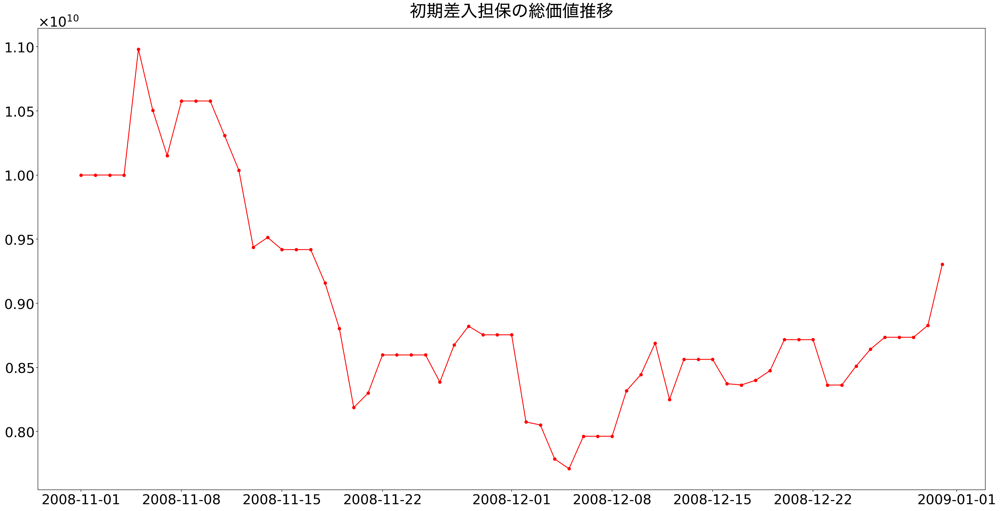

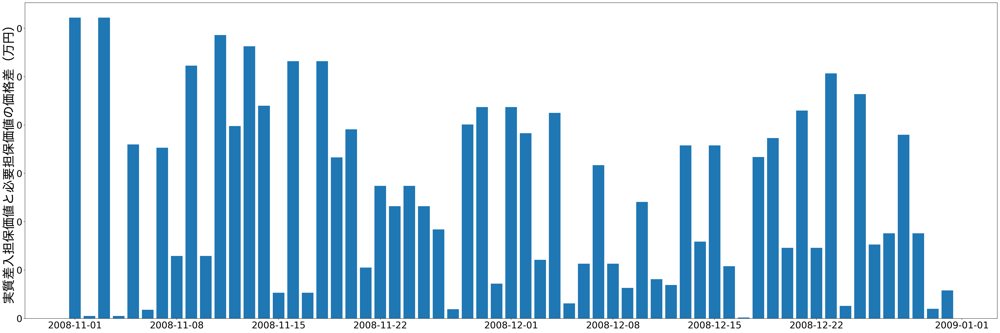

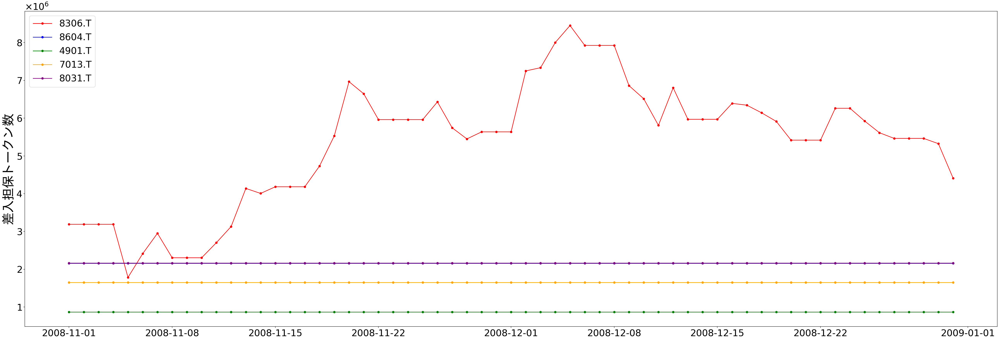

In [24]:
visualizer_s4_m2_1 = LogVisualizer(logs_s4_m2_1, './data0322/s4_m2_1')
# visualizer_s4_m2_1.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m2_1.plt_initial_collateral_portfolio_value()
visualizer_s4_m2_1.bar_collateral_price_diff()
_ = visualizer_s4_m2_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model2-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、静的優先度付け

In [25]:
simulator_s4_m2_2 = ExecuteAutoAdjustmentTransactionMulti(borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_2_2)
print('Start simulation model2_2...')
%time logs_s4_m2_2 = simulator_s4_m2_2.execute()
print("End simulation model2_2!!!")

("JCT portfolio: {'8306.T': {'num': 3189793, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2157498, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 865801, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1652893, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2162163, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 3189793, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 2157498, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 865801, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1652893, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 2162163, 'is_usd': False, 'priority': 1, 'price': 925.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
2008

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 1405095, 'is_usd': False, 'priority': 5, 'price': 650.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162161, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2413357, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 948.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-07
2008-11-07: Price updating...
JPY: 1.0
2008-11-07: Price updating...
8306.T: 639.0
8604.T: 948.0
4901.

2008-11-15: Price updating...
JPY: 1.0
2008-11-15: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T: 824.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  25424632.0
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2270.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1210.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4139758, 'price': 585.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 837.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-16
2008-11-16: Price updating...
JPY: 1.0
2008-11-16: Price updating...
8306.T: 585.0
8604.T: 837.0
4901.T: 2270.0
7013.T: 1210.0
8031.T

{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5960985, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 693.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-24
2008-11-24: Price updating...
JPY: 1.0
2008-11-24: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  274.0
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1140.0,

{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2095.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 768.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 7250257, 'price': 474.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 612.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-03
2008-12-03: Price updating...
JPY: 1.0
2008-12-03: Price updating...
8306.T: 470.0
8604.T: 618.0
4901.T: 2090.0
7013.T: 1070.0
8031.T: 759.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  39844129.0
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2090.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 10

{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2145.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1120.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 850.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5809389, 'price': 500.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 718.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-12
2008-12-12: Price updating...
JPY: 1.0
2008-12-12: Price updating...
8306.T: 484.0
8604.T: 666.0
4901.T: 2020.0
7013.T: 1080.0
8031.T: 803.0
from Borrower(A) to Lender(B)
"8306.T: {'num': 2192557, 'is_usd': False, 'priority': 5, 'price': 484.0}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2020.0, 'priority': 3},
 '7013.T': {'is_usd': False

2008-12-21: Price updating...
JPY: 1.0
2008-12-21: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  146.0
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 1914.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 5417732, 'price': 576.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 752.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-22
2008-12-22: Price updating...
JPY: 1.0
2008-12-22: Price updating...
8306.T: 576.0
8604.T: 752.0
4901.T: 1914.0
7013.T: 1100.0
8031.T: 824

2008-12-31: Price updating...
JPY: 1.0
2008-12-31: Price updating...
8306.T: 571.0
8604.T: 766.0
4901.T: 2000.0
7013.T: 1200.0
8031.T: 978.0
is_reverse: True
from Lender(B) to Borrower(A)
"8306.T: {'num': 5613440, 'is_usd': False, 'price': 571.0, 'priority': 5}"
@@@@@@@@@@@@@@price adjustment is successfully done@@@@@@@@@@@@@@
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2000.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1652893, 'price': 1200.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2162163, 'price': 978.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4409260, 'price': 571.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2157498, 'price': 766.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Finished!!!!
CPU times: user 1min 1s, sys: 5.39 s, total: 1min 7s
Wall time: 8min 56s
End simulation model2_2!!!


Log Visualizer initialized.


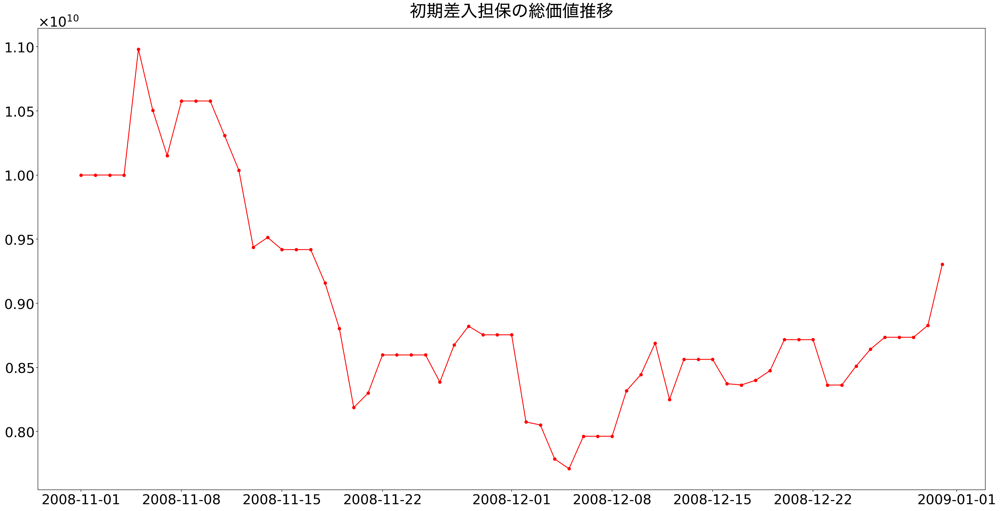

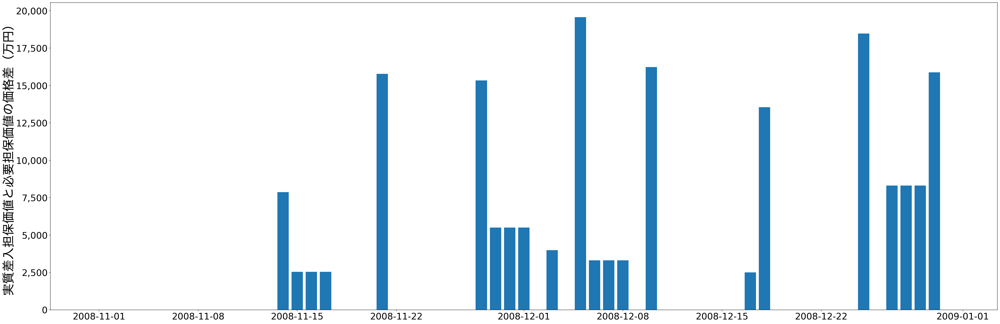

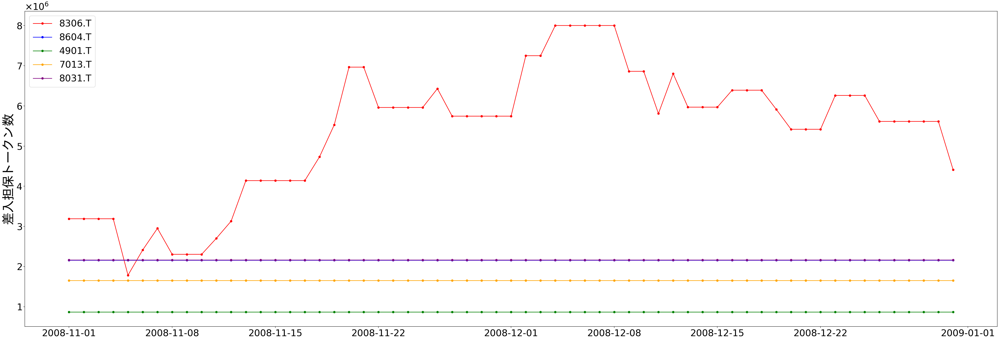

In [26]:
visualizer_s4_m2_2 = LogVisualizer(logs_s4_m2_2, './data0322/s4_m2_2')
# visualizer_s4_m2_2.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m2_2.plt_initial_collateral_portfolio_value()
visualizer_s4_m2_2.bar_collateral_price_diff()
_ = visualizer_s4_m2_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-1（追加検証）
複数担保の取引、マージンコール閾値設定なし、動的優先度付け

In [78]:
simulator_s4_m3_1 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_3_1)
print('Start simulation model3_1...')
%time logs_s4_m3_1 = simulator_s4_m3_1.execute()
print("End simulation model3_1!!!")

("JCT portfolio: {'8306.T': {'num': 3189793, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2157498, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 865801, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1652893, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2162163, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 3189793, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 2157498, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 865801, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1652893, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 2162163, 'is_usd': False, 'priority': 1, 'price': 925.0}"
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310

8306.T: 698.0
8604.T: 1027.0
4901.T: 2415.0
7013.T: 1350.0
8031.T: 1025.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 698.0}"
余剰返還時
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 1027.0}"
余剰返還時
"4901.T: {'num': 0, 'is_usd': False, 'priority': 3, 'price': 2415.0}"
余剰返還時
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1350.0}"
余剰返還時
"8031.T: {'num': 0, 'is_usd': False, 'priority': 1, 'price': 1025.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 828158, 'price': 2415.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1481482, 'price': 1350.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1951220, 'price': 1025.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 2865330, 'price': 698.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 1947420, 'price': 1027.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@

2008-11-12: Price updating...
JPY: 1.0
2008-11-12: Price updating...
8306.T: 615.0
8604.T: 905.0
4901.T: 2310.0
7013.T: 1280.0
8031.T: 928.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 30235, 'is_usd': False, 'priority': 5, 'price': 615.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 29838, 'is_usd': False, 'priority': 4, 'price': 905.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 27295, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
余剰返還時
"7013.T: {'num': 126175, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
追加差入（充足時）
"8031.T: {'num': 106664, 'is_usd': False, 'priority': 1, 'price': 928.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 865801, 'price': 2310.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2155173, 'price': 928.0, 'priority': 1},
 '8306.T': {'is_usd': Fals

{'4901.T': {'is_usd': False, 'num': 871460, 'price': 2295.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1680673, 'price': 1190.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2418380, 'price': 827.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3663004, 'price': 546.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2577320, 'price': 776.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-19
2008-11-19: Price updating...
JPY: 1.0
2008-11-19: Price updating...
8306.T: 511.0
8604.T: 749.0
4901.T: 2275.0
7013.T: 1160.0
8031.T: 773.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 511.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 0, 'is_usd': False, 'priority': 4, 'price': 749.0}"
collateral n

2008-11-25: Price updating...
JPY: 1.0
2008-11-25: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031.T: 754.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 214097, 'is_usd': False, 'priority': 5, 'price': 506.0}"
余剰返還時
"8604.T: {'num': 214773, 'is_usd': False, 'priority': 4, 'price': 693.0}"
余剰返還時
"4901.T: {'num': 70675, 'is_usd': False, 'priority': 3, 'price': 2280.0}"
余剰返還時
"7013.T: {'num': 31329, 'is_usd': False, 'priority': 2, 'price': 1140.0}"
余剰返還時
"8031.T: {'num': 200548, 'is_usd': False, 'priority': 1, 'price': 754.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 877193, 'price': 2280.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1754386, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2652520, 'price': 754.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3952570, 'price': 506.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2886003, 'price': 693.0, 'priority': 4}}
OK. collateral is moved.
@@@@

2008-12-02: Price updating...
JPY: 1.0
2008-12-02: Price updating...
8306.T: 474.0
8604.T: 612.0
4901.T: 2095.0
7013.T: 1070.0
8031.T: 768.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 237393, 'is_usd': False, 'priority': 5, 'price': 474.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8604.T: {'num': 150923, 'is_usd': False, 'priority': 4, 'price': 612.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"4901.T: {'num': 78302, 'is_usd': False, 'priority': 3, 'price': 2095.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"7013.T: {'num': 0, 'is_usd': False, 'priority': 2, 'price': 1070.0}"
collateral num is short@@@@@@@@@
!!!!additional token issuing by Borrower(A)!!!!
"8031.T: {'num': 505650, 'is_usd': False, 'priority': 1, 'price': 768.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 954654, 'price': 2095.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 18

{'4901.T': {'is_usd': False, 'num': 919541, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1886793, 'price': 1060.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2710028, 'price': 738.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4651163, 'price': 430.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3169573, 'price': 631.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-09
2008-12-09: Price updating...
JPY: 1.0
2008-12-09: Price updating...
8306.T: 458.0
8604.T: 715.0
4901.T: 2165.0
7013.T: 1090.0
8031.T: 758.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 0, 'is_usd': False, 'priority': 5, 'price': 458.0}"
余剰返還時
"8604.T: {'num': 237583, 'is_usd': False, 'priority': 4, 'price': 715.0}"
余剰返還時
"4901.T: {'num': 68114, 'is_usd': False, 'priority': 3, 'price': 2165.0}"
追加

{'4901.T': {'is_usd': False, 'num': 947868, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1834863, 'price': 1090.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2350177, 'price': 851.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3868472, 'price': 517.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2985075, 'price': 670.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-16
2008-12-16: Price updating...
JPY: 1.0
2008-12-16: Price updating...
8306.T: 508.0
8604.T: 641.0
4901.T: 2020.0
7013.T: 1100.0
8031.T: 834.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 782691, 'is_usd': False, 'priority': 5, 'price': 508.0}"
追加差入（充足時）
"8604.T: {'num': 422081, 'is_usd': False, 'priority': 4, 'price': 641.0}"
追加差入（充足時）
"4901.T: {'num': 42232, 'is_usd': False, 'priority': 3, 'price'

{'4901.T': {'is_usd': False, 'num': 1044933, 'price': 1914.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1818182, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2427185, 'price': 824.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3472223, 'price': 576.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2659575, 'price': 752.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-23
2008-12-23: Price updating...
JPY: 1.0
2008-12-23: Price updating...
8306.T: 533.0
8604.T: 711.0
4901.T: 1896.0
7013.T: 1070.0
8031.T: 795.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1178940, 'is_usd': False, 'priority': 5, 'price': 533.0}"
追加差入（充足時）
"8604.T: {'num': 747581, 'is_usd': False, 'priority': 4, 'price': 711.0}"
追加差入（充足時）
"4901.T: {'num': 33235, 'is_usd': False, 'priority': 3, 'pric

{'4901.T': {'is_usd': False, 'num': 1037883, 'price': 1927.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1818182, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2285715, 'price': 875.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3597123, 'price': 556.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2724796, 'price': 734.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-30
2008-12-30: Price updating...
JPY: 1.0
2008-12-30: Price updating...
8306.T: 549.0
8604.T: 729.0
4901.T: 1950.0
7013.T: 1130.0
8031.T: 901.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 1054040, 'is_usd': False, 'priority': 5, 'price': 549.0}"
追加差入（充足時）
"8604.T: {'num': 682360, 'is_usd': False, 'priority': 4, 'price': 729.0}"
追加差入（充足時）
"4901.T: {'num': 40285, 'is_usd': False, 'priority': 3, 'pric

Log Visualizer initialized.


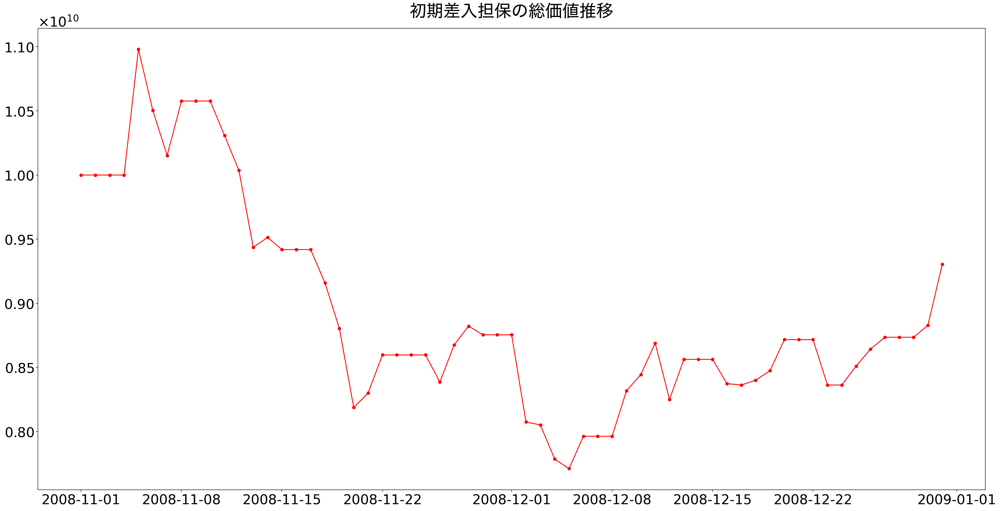

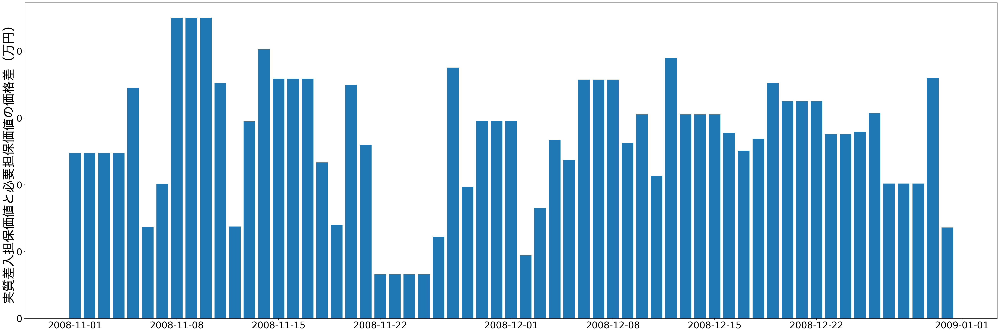

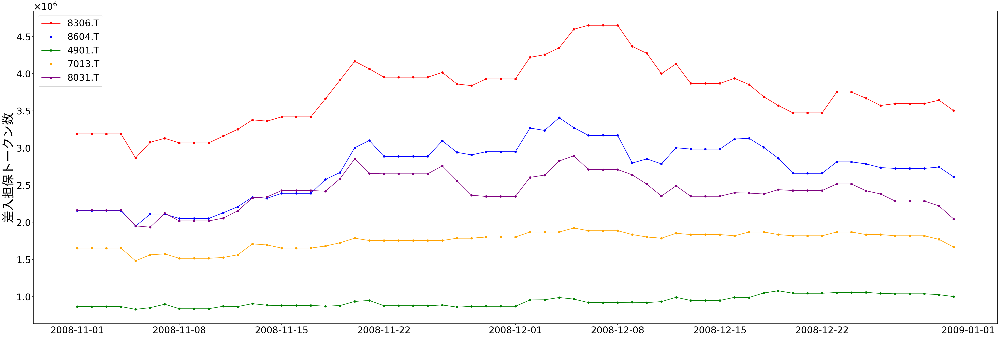

In [79]:
visualizer_s4_m3_1 = LogVisualizer(logs_s4_m3_1, './data0322/s4_m3_1')
# visualizer_s4_m3_1.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m3_1.plt_initial_collateral_portfolio_value()
visualizer_s4_m3_1.bar_collateral_price_diff()
_ = visualizer_s4_m3_1.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)

### model3-2（追加検証）
複数担保の取引、マージンコール閾値設定あり、動的優先度付け

In [80]:
simulator_s4_m3_2 = ExecuteAutoAdjustmentTransactionDynamicMulti(borrower_portfolio_s4, lender_portfolio_X, start_date_4, end_date_4,  options=options_3_2)
print('Start simulation model3_2...')
%time logs_s4_m3_2 = simulator_s4_m3_2.execute()
print("End simulation model3_2!!!")

("JCT portfolio: {'8306.T': {'num': 3189793, 'is_usd': False, 'priority': 5}, "
 "'8604.T': {'num': 2157498, 'is_usd': False, 'priority': 4}, '4901.T': "
 "{'num': 865801, 'is_usd': False, 'priority': 3}, '7013.T': {'num': 1652893, "
 "'is_usd': False, 'priority': 2}, '8031.T': {'num': 2162163, 'is_usd': False, "
 "'priority': 1}}")
"ST portfolio: {'JPY': {'num': 10000000000, 'is_usd': False, 'priority': 1}}"
2008-11-01: Price updating...
JPY: 1.0
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310.0
7013.T: 1210.0
8031.T: 925.0
"8306.T: {'num': 3189793, 'is_usd': False, 'priority': 5, 'price': 627.0}"
"8604.T: {'num': 2157498, 'is_usd': False, 'priority': 4, 'price': 927.0}"
"4901.T: {'num': 865801, 'is_usd': False, 'priority': 3, 'price': 2310.0}"
"7013.T: {'num': 1652893, 'is_usd': False, 'priority': 2, 'price': 1210.0}"
"8031.T: {'num': 2162163, 'is_usd': False, 'priority': 1, 'price': 925.0}"
2008-11-01: Price updating...
8306.T: 627.0
8604.T: 927.0
4901.T: 2310

2008-11-06: Price updating...
JPY: 1.0
2008-11-06: Price updating...
8306.T: 650.0
8604.T: 948.0
4901.T: 2350.0
7013.T: 1280.0
8031.T: 1034.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 324463, 'is_usd': False, 'priority': 5, 'price': 650.0}"
追加差入（充足時）
"8604.T: {'num': 210078, 'is_usd': False, 'priority': 4, 'price': 948.0}"
追加差入（充足時）
"4901.T: {'num': 37643, 'is_usd': False, 'priority': 3, 'price': 2350.0}"
追加差入（充足時）
"7013.T: {'num': 171411, 'is_usd': False, 'priority': 2, 'price': 1280.0}"
追加差入（充足時）
"8031.T: {'num': 210943, 'is_usd': False, 'priority': 1, 'price': 1034.0}"
余剰返還時
{'4901.T': {'is_usd': False, 'num': 851064, 'price': 2350.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1562500, 'price': 1280.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 1934236, 'price': 1034.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3076924, 'price': 650.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2109705, 'price': 948.0, 'priority': 4}}
OK. colla

{'4901.T': {'is_usd': False, 'num': 904978, 'price': 2210.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1709402, 'price': 1170.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2328289, 'price': 859.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3378379, 'price': 592.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2339182, 'price': 855.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-14
2008-11-14: Price updating...
JPY: 1.0
2008-11-14: Price updating...
8306.T: 595.0
8604.T: 861.0
4901.T: 2265.0
7013.T: 1180.0
8031.T: 854.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -79399543.0
{'4901.T': {'is_usd': False, 'num': 904978, 'price': 2265.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1709402, 'price': 1

2008-11-21: Price updating...
JPY: 1.0
2008-11-21: Price updating...
8306.T: 492.0
8604.T: 645.0
4901.T: 2110.0
7013.T: 1140.0
8031.T: 753.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -142976848.0
{'4901.T': {'is_usd': False, 'num': 934580, 'price': 2110.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1785715, 'price': 1140.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2853068, 'price': 753.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4166667, 'price': 492.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3003004, 'price': 645.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-11-22
2008-11-22: Price updating...
JPY: 1.0
2008-11-22: Price updating...
8306.T: 506.0
8604.T: 693.0
4901.T: 2280.0
7013.T: 1140.0
8031

2008-11-30: Price updating...
JPY: 1.0
2008-11-30: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.T: 852.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -97582332.0
{'4901.T': {'is_usd': False, 'num': 858370, 'price': 2300.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1785715, 'price': 1110.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2560820, 'price': 852.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3861004, 'price': 509.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2941177, 'price': 678.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-01
2008-12-01: Price updating...
JPY: 1.0
2008-12-01: Price updating...
8306.T: 509.0
8604.T: 678.0
4901.T: 2300.0
7013.T: 1110.0
8031.

2008-12-08: Price updating...
JPY: 1.0
2008-12-08: Price updating...
8306.T: 430.0
8604.T: 631.0
4901.T: 2175.0
7013.T: 1060.0
8031.T: 738.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -3572.0
{'4901.T': {'is_usd': False, 'num': 919541, 'price': 2175.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1886793, 'price': 1060.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2710028, 'price': 738.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 4651163, 'price': 430.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3169573, 'price': 631.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-09
2008-12-09: Price updating...
JPY: 1.0
2008-12-09: Price updating...
8306.T: 458.0
8604.T: 715.0
4901.T: 2165.0
7013.T: 1090.0
8031.T: 7

2008-12-16: Price updating...
JPY: 1.0
2008-12-16: Price updating...
8306.T: 508.0
8604.T: 641.0
4901.T: 2020.0
7013.T: 1100.0
8031.T: 834.0
necessary_each_collateral_value: 2000000000
"8306.T: {'num': 782691, 'is_usd': False, 'priority': 5, 'price': 508.0}"
追加差入（充足時）
"8604.T: {'num': 422081, 'is_usd': False, 'priority': 4, 'price': 641.0}"
追加差入（充足時）
"4901.T: {'num': 42232, 'is_usd': False, 'priority': 3, 'price': 2020.0}"
追加差入（充足時）
"7013.T: {'num': 51930, 'is_usd': False, 'priority': 2, 'price': 1100.0}"
余剰返還時
"8031.T: {'num': 502891, 'is_usd': False, 'priority': 1, 'price': 834.0}"
追加差入（充足時）
{'4901.T': {'is_usd': False, 'num': 990100, 'price': 2020.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1818182, 'price': 1100.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2398082, 'price': 834.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3937008, 'price': 508.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 3120125, 'price': 641.0, 'priority': 4}}
OK. collatera

{'4901.T': {'is_usd': False, 'num': 1054853, 'price': 1896.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1869159, 'price': 1070.0, 'priority': 2},
 '8031.T': {'is_usd': False, 'num': 2515724, 'price': 795.0, 'priority': 1},
 '8306.T': {'is_usd': False, 'num': 3752346, 'price': 533.0, 'priority': 5},
 '8604.T': {'is_usd': False, 'num': 2812940, 'price': 711.0, 'priority': 4}}
OK. collateral is moved.
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2008-12-25
2008-12-25: Price updating...
JPY: 1.0
2008-12-25: Price updating...
8306.T: 545.0
8604.T: 718.0
4901.T: 1892.0
7013.T: 1090.0
8031.T: 825.0
price diff is so little that auto margin call is cancelled.
margincall threshold:  0.02
threshold price:  200000000.0
price_diff:  -173356976.0
{'4901.T': {'is_usd': False, 'num': 1054853, 'price': 1892.0, 'priority': 3},
 '7013.T': {'is_usd': False, 'num': 1869159, 'price'

Log Visualizer initialized.


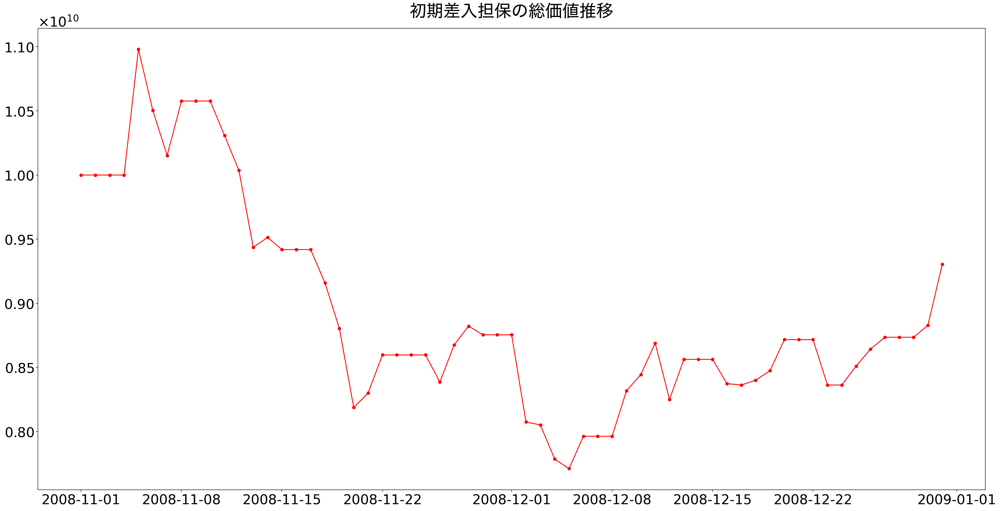

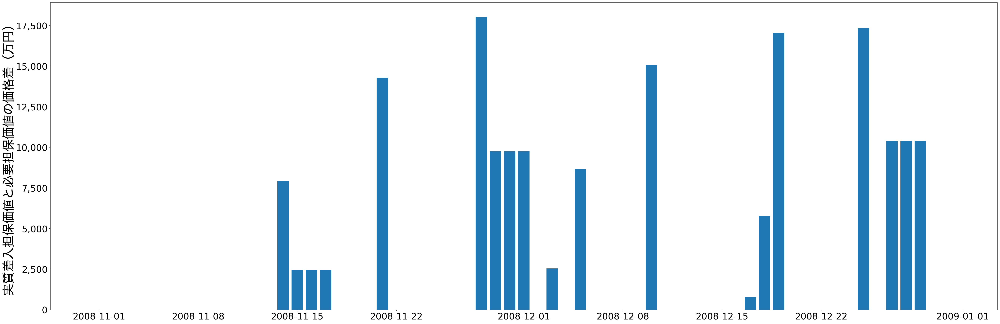

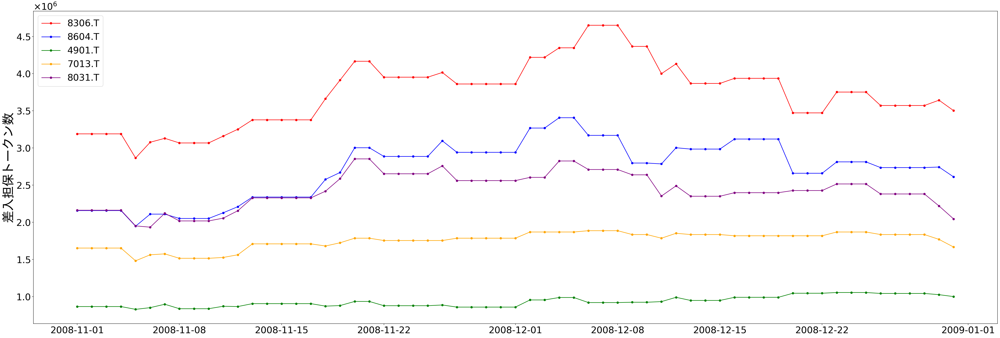

In [81]:
visualizer_s4_m3_2 = LogVisualizer(logs_s4_m3_2, './data0322/s4_m3_2')
# visualizer_s4_m3_2.compare_initial_collateral_portfolio_ratio()
visualizer_s4_m3_2.plt_initial_collateral_portfolio_value()
visualizer_s4_m3_2.bar_collateral_price_diff()
_ = visualizer_s4_m3_2.plt_collateral_num(ymin=0, ymax=7.0e+6, show_additional_issue=False)